US AİR havayolları tweetlerinin tespiti ile alakalı çalışıldı

# [1. Ön işleme Yok](#b1)

* ## [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Mounted at /content/drive
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'
file_path5 = '/content/drive/My Drive/Bitirme/Datasets/USAir/USAir_PreprocessedSon_df.csv'

df = pd.read_csv(file_path5, encoding='latin1', header=None)
#df = pd.read_csv(file_path5, index_col=0)

# Sütun isimlerini belirle--USAir
df.columns =['Text','score', 'hibrit', 'USAirPrePro', 'USAirPrePro2', 'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro', 'text_length', 'sentiment']

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
# Sütun isimlerini belirle--Finance
"""#df.columns=['Text','tokens', 'text_length', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPLSTMPrePRro',
       'score', 'oh_label']"""

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
#df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#b1)

In [ ]:
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
0,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
1,@VirginAmerica What @dhepburn said.,1,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,VirginAmerica What dhepburn said,@VirginAmerica What @dhepburn said.,VirginAmerica What dhepburn said,virginamerica dhepburn said,35,1
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
3,@VirginAmerica I didn't today... Must mean I need to take another trip!,1,virginamerica today must mean need take another trip,virginamerica didnt today must mean need take anoth trip,virginamerica today must mean need take another trip,virginamerica today must mean need take anoth trip,virginamerica today must mean need take anoth trip,VirginAmerica didn today Must mean need to take another trip,@VirginAmerica I didn't today... Must mean I need to take another trip!,VirginAmerica didn today Must mean need to take another trip,virginamerica n't today must mean need take anoth trip,71,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0


In [ ]:
df=df.drop(df.index[0])

In [ ]:
df.head()

In [ ]:
df.shape

(14641, 13)

###### [Nötr sınıfı çıkarma](#p2)

In [ ]:
df["score"].value_counts()

,count
score,
0.0,9178
2.0,2363


In [ ]:
print(df.shape)
df = df[df['airline_sentiment'] != 'neutral']
print(df.shape)
df.head(5)

(14640, 13)


KeyError: 'airline_sentiment'

In [ ]:
#nötr sınıf 1
print(df.shape)
df = df[df['score'] != '1']
print(df.shape)
df.head(5)

(11542, 13)
(11542, 13)


,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
0,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
5,@VirginAmerica and it's a really big bad thing about it,0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0


In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
#Burda 0 olanlar 0 yapıldı 2 olanlar 1 yapıldı pozitif:1 negative:0
df['score2'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
df["score"].value_counts()

,count
score,
0.0,9178
2.0,2363


In [ ]:
df['score2']

,score2
1,1
2,2
3,1
7,2
8,1
...,...
14631,2
14633,1
14636,2
14638,1


In [ ]:
df['score2']

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment,score2
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2.0,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2,2.0
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0.0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0,0.0
5,@VirginAmerica and it's a really big bad thing about it,0.0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0,0.0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0.0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0,0.0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",2.0,virginamerica yes nearly every time fly vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,virginamerica yes nearly every time fly vx ear worm wont go away,virginamerica ye nearli everi time fli vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,VirginAmerica yes nearly every time fly VX this ear worm won go away,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",VirginAmerica yes nearly every time fly VX this ear worm won go away,"virginamerica ye , nearli everi time fli vx ear worm go away",85,2,2.0


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(11542, 14)

In [ ]:
print(len(df))

11542


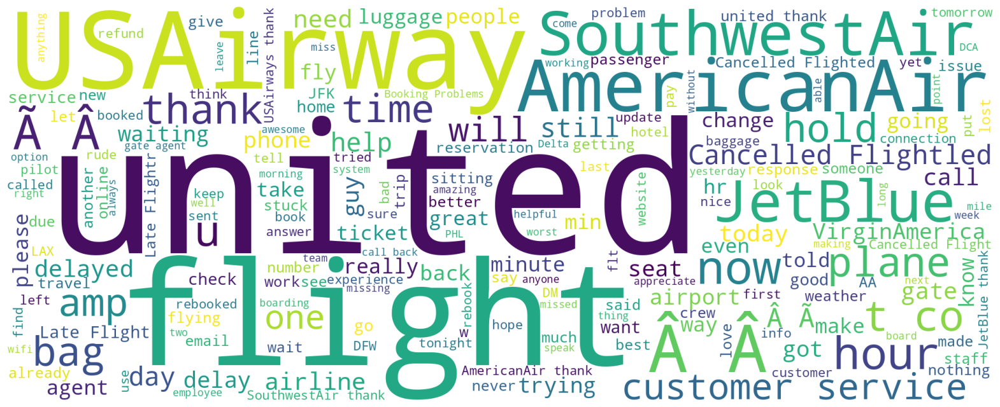

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment', 'score2'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
#secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score'
#secilen_sentiment_kolon_adi='score2'
#secilen_kolon_adi='hibrit'
secilen_kolon_adi='Text'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
df

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment,score2
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2.0,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2,1.0
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0.0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0,0.0
5,@VirginAmerica and it's a really big bad thing about it,0.0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0,0.0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0.0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0,0.0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",2.0,virginamerica yes nearly every time fly vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,virginamerica yes nearly every time fly vx ear worm wont go away,virginamerica ye nearli everi time fli vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,VirginAmerica yes nearly every time fly VX this ear worm won go away,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",VirginAmerica yes nearly every time fly VX this ear worm won go away,"virginamerica ye , nearli everi time fli vx ear worm go away",94,2,1.0
...,...,...,...,...,...,...,...,..

In [ ]:
data.head()

,Text,score
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2.0
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0.0
5,@VirginAmerica and it's a really big bad thing about it,0.0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0.0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",2.0


In [ ]:
X_df.head()

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"


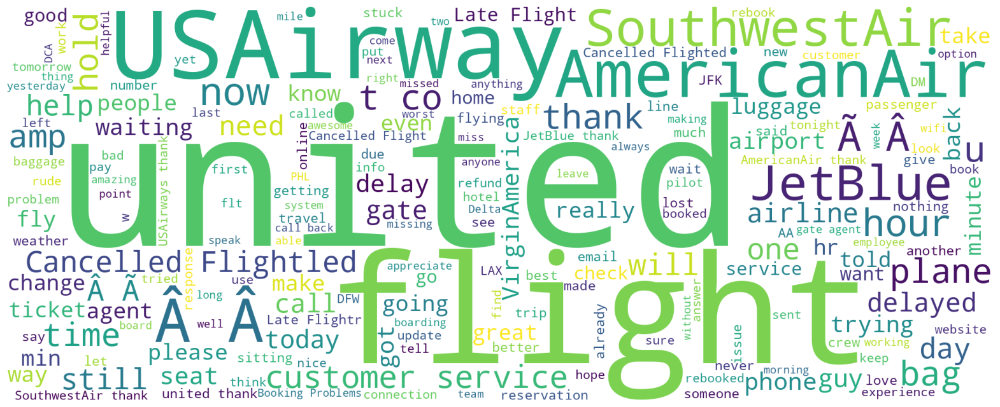

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

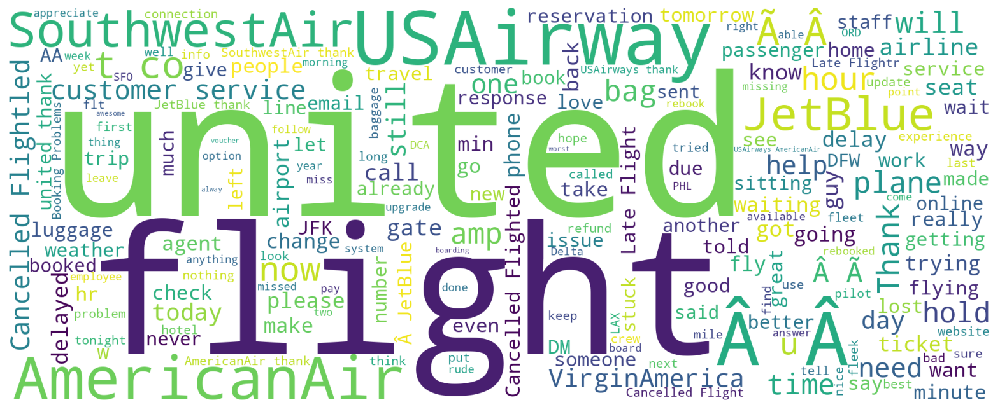

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"
...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday."
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ
14636,@AmericanAir thank you we got on a different flight to Chicago.
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc


In [ ]:
df['score2'] = df['score'].apply(lambda x: x - 1 if x == 2 else x)

In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score
2,2.0
4,0.0
5,0.0
6,0.0
7,2.0
...,...
14634,0.0
14635,0.0
14636,2.0
14637,0.0


In [ ]:
y = y.apply(lambda x: x - 1 if x == 2 else x)
y

,score
2,1.0
4,0.0
5,0.0
6,0.0
7,1.0
...,...
14634,0.0
14635,0.0
14636,1.0
14637,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
 y_liste= y_liste.apply(lambda x: x - 1 if x == 2 else x)
 y_liste= y_liste.apply(lambda x: x + 1 if x == -1 else x)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

####  [keşifsel veri analizi için deneme](#b1)


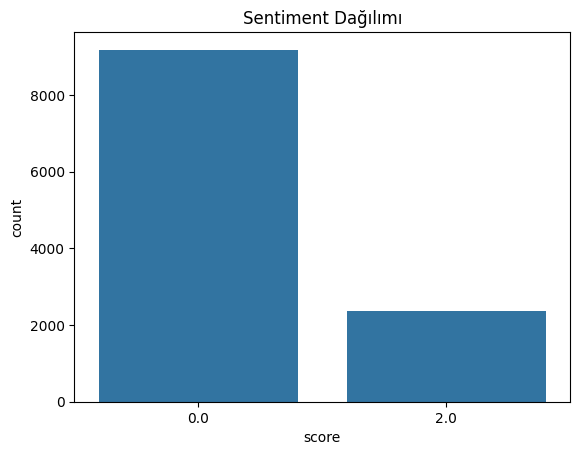

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

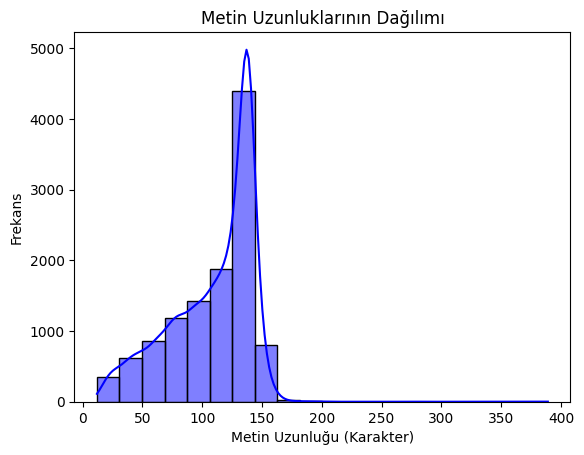

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

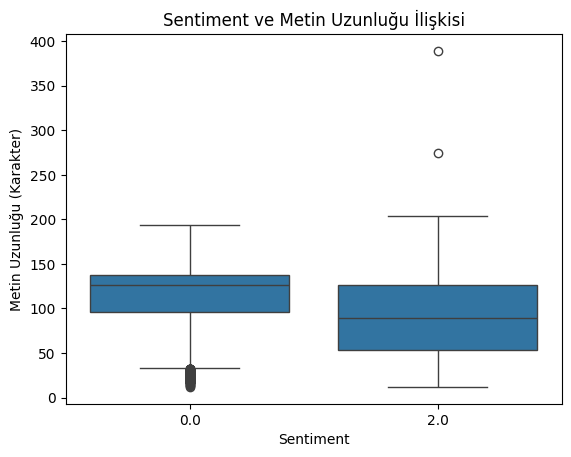

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

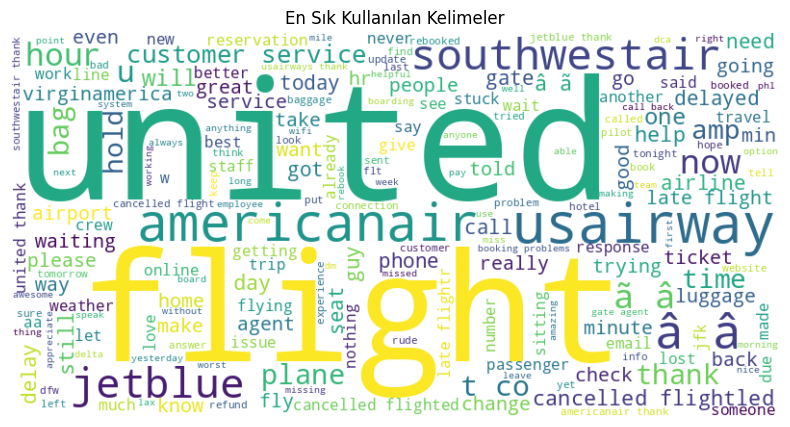

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df['Text']).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
df['score'] = df['score'].astype(int)

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()


In [ ]:
positive_text

''

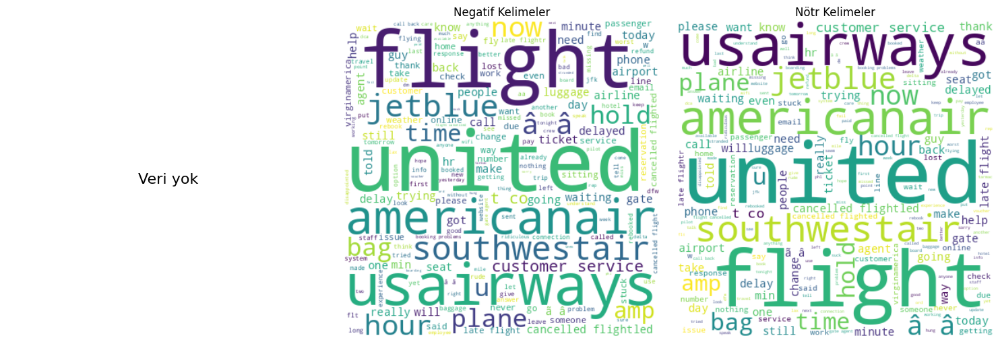

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


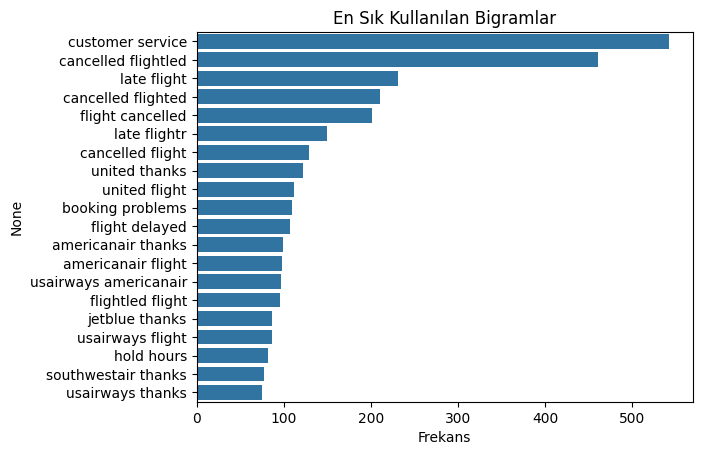

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

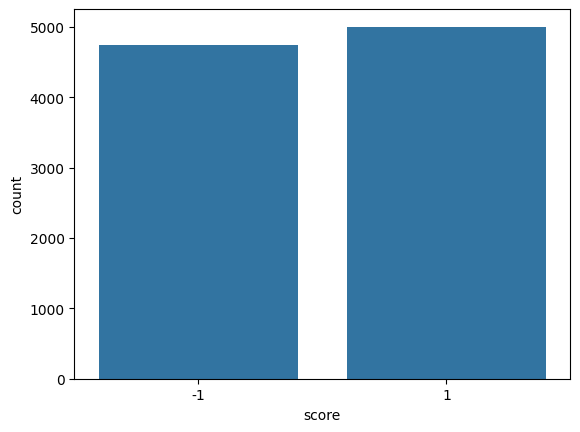

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment', 'score2'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
 y_liste= y_liste.apply(lambda x: x - 1 if x == 2 else x)
 y_liste= y_liste.apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,Text,score
2,@VirginAmerica plus you've added commercials to the experience... tacky.,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0
5,@VirginAmerica and it's a really big bad thing about it,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",1
...,...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday.",0
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ,0
14636,@AmericanAir thank you we got on a different flight to Chicago.,1
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc,0


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"
...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday."
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ
14636,@AmericanAir thank you we got on a different flight to Chicago.
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"
...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday."
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ
14636,@AmericanAir thank you we got on a different flight to Chicago.
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc


In [ ]:
y_liste

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(8078, 10000) (3463, 10000)


In [ ]:
print(test_vectors)

  (0, 1373)	0.15569762721925262
  (0, 2220)	0.2294976821463633
  (0, 2370)	0.45308583637279
  (0, 3986)	0.15657719888528404
  (0, 4012)	0.2745688846803433
  (0, 4103)	0.15137857783243283
  (0, 5877)	0.20009716834157987
  (0, 6247)	0.19301387421294663
  (0, 8716)	0.5194935460692452
  (0, 9187)	0.47080741827757416
  (0, 9370)	0.1617279204230615
  (1, 2556)	0.27664151332717357
  (1, 3986)	0.1746990273675629
  (1, 4441)	0.673458154674929
  (1, 4811)	0.2804572478666836
  (1, 5238)	0.21849188760993338
  (1, 9479)	0.5594719510488546
  (2, 1149)	0.24545166606969296
  (2, 1217)	0.19625492829936633
  (2, 1656)	0.2584384371217087
  (2, 1981)	0.2338094992506207
  (2, 3986)	0.0972321992452956
  (2, 4103)	0.09400392998508261
  (2, 4287)	0.17176810212807556
  (2, 4935)	0.11245676431408201
  :	:
  (3461, 5699)	0.29291957179375167
  (3461, 5770)	0.2173674095815945
  (3461, 6036)	0.19537088379157452
  (3461, 6247)	0.12643769655828638
  (3461, 6389)	0.17078490840184324
  (3461, 7391)	0.21768480977946786



<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  83.19376263355473


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

           0       0.83      1.00      0.90      2771
           1       1.00      0.16      0.27       692

    accuracy                           0.83      3463
   macro avg       0.91      0.58      0.59      3463
weighted avg       0.86      0.83      0.78      3463



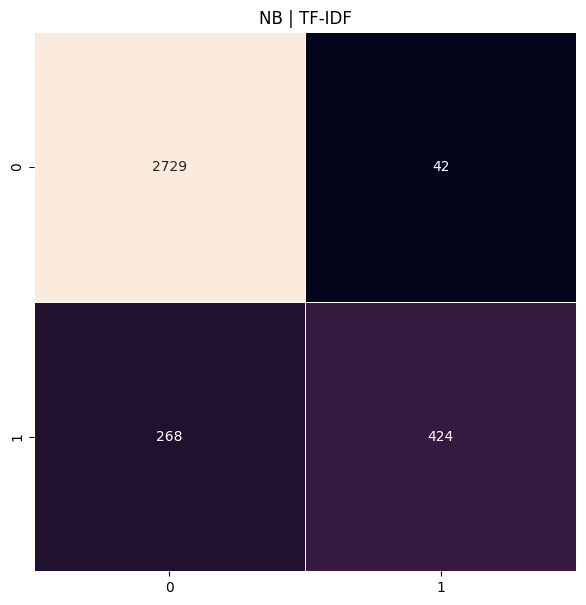

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

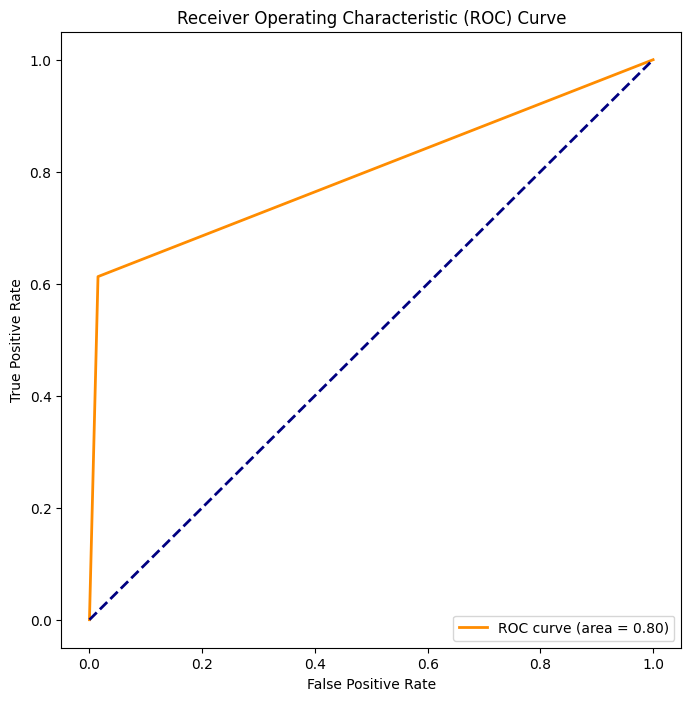

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predicted_NB)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.75194917701415


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.93      0.98      0.96      2771
           1       0.89      0.73      0.80       692

    accuracy                           0.93      3463
   macro avg       0.91      0.85      0.88      3463
weighted avg       0.93      0.93      0.92      3463



In [ ]:
y_test.head(500)

,score
11826,0
8106,1
1280,0
14344,0
3830,1
...,...
5336,0
5185,0
11660,0
3277,1


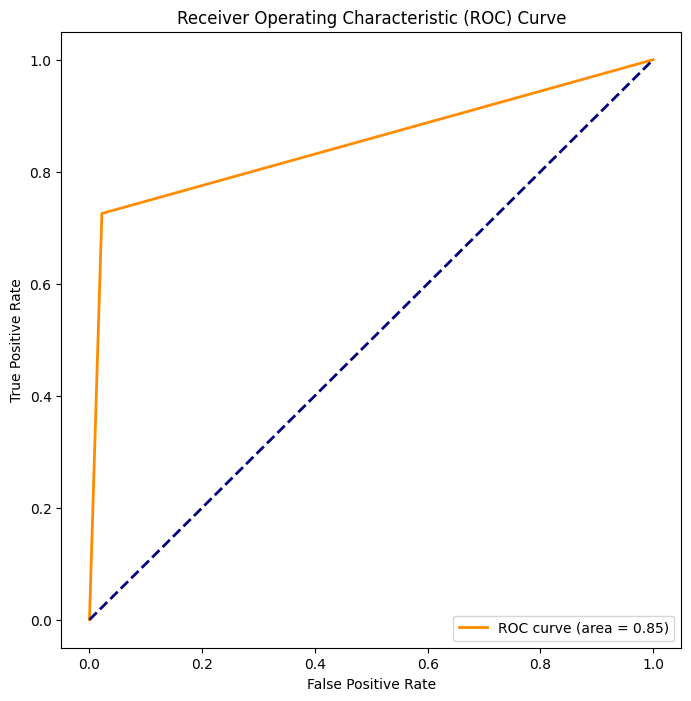

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_SVM)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


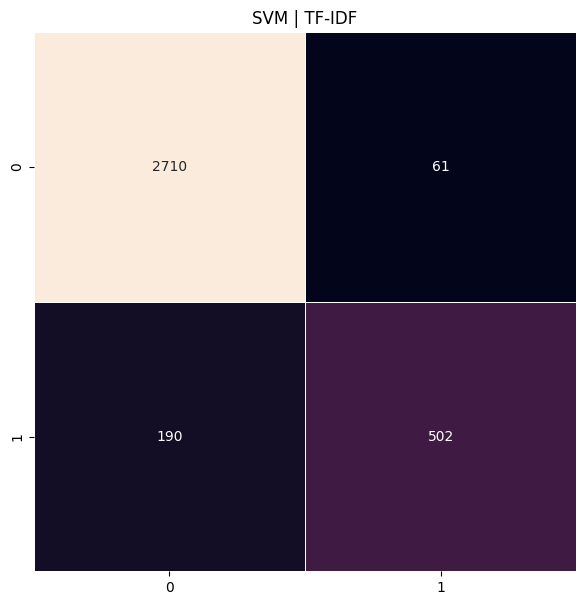

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  90.99047069015305


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.91      0.99      0.95      2771
           1       0.92      0.60      0.73       692

    accuracy                           0.91      3463
   macro avg       0.92      0.79      0.84      3463
weighted avg       0.91      0.91      0.90      3463



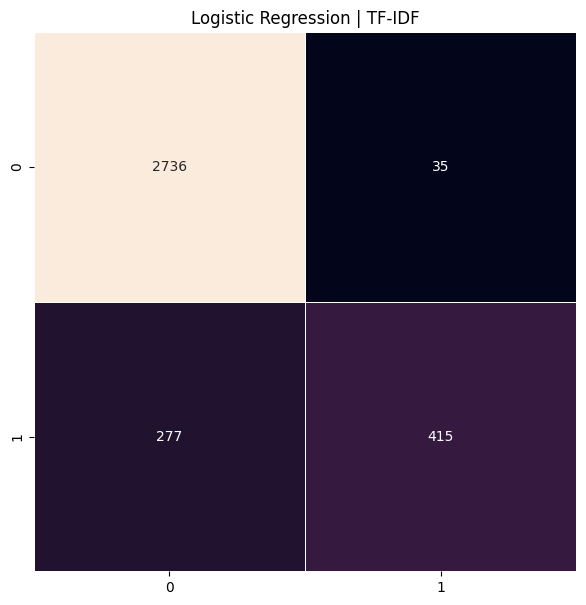

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score
11826,0
8106,1
1280,0
14344,0
3830,1
...,...
398,1
1448,0
11438,0
13383,0


In [ ]:
predictions_log

array([0, 1, 0, ..., 0, 0, 0])

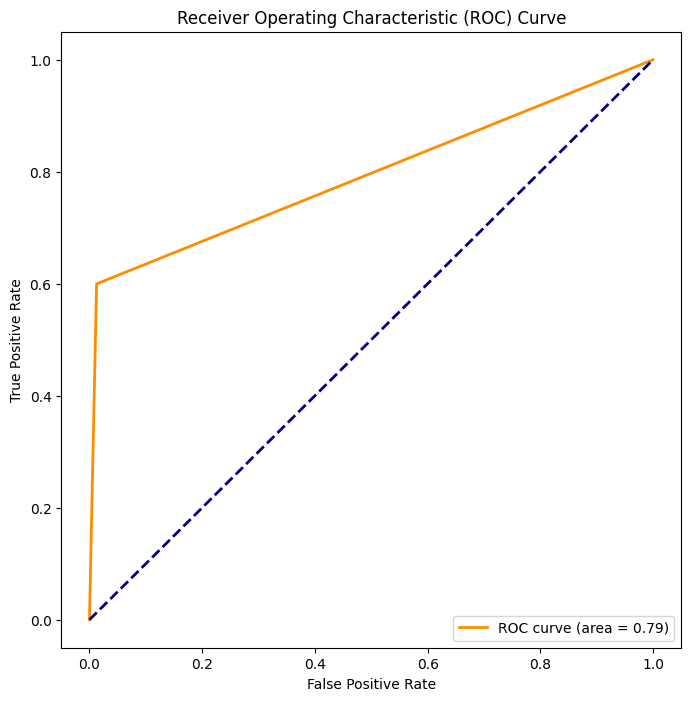

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_test = y_test.astype(int)
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  88.65145827317355


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2771
           1       0.72      0.70      0.71       692

    accuracy                           0.89      3463
   macro avg       0.82      0.82      0.82      3463
weighted avg       0.89      0.89      0.89      3463



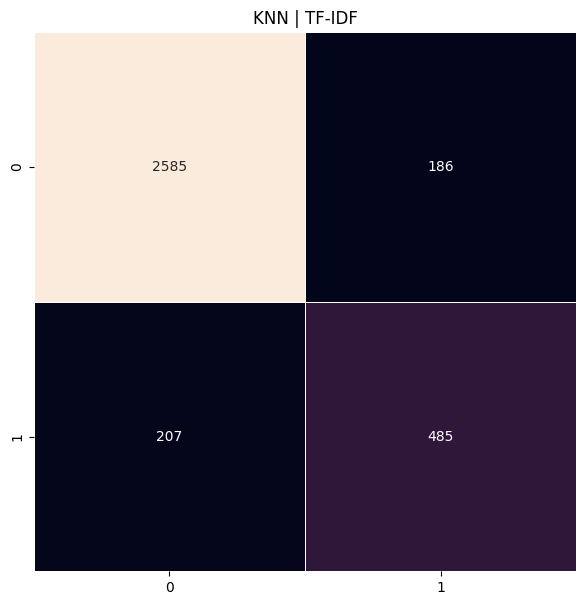

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

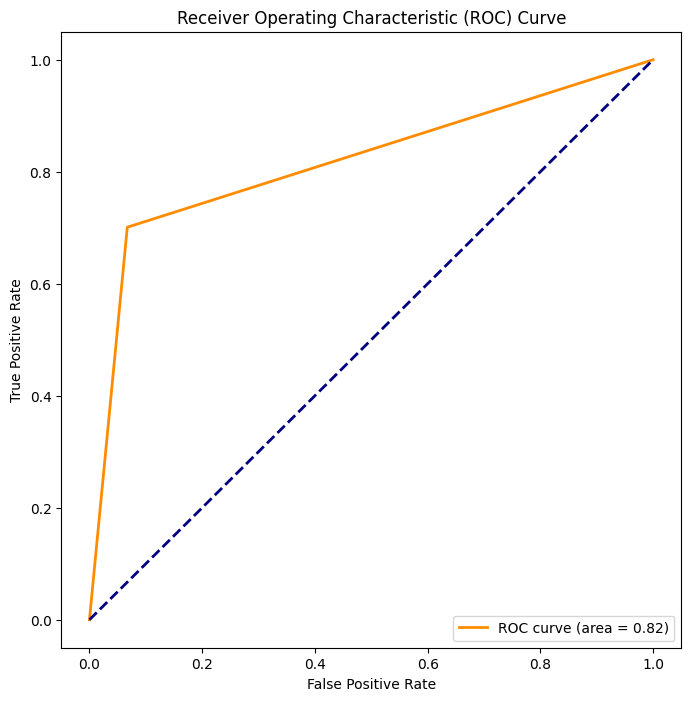

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_test = y_test.astype(int)
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  86.5434594282414


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.91      0.92      0.92      2771
           1       0.67      0.66      0.66       692

    accuracy                           0.87      3463
   macro avg       0.79      0.79      0.79      3463
weighted avg       0.86      0.87      0.87      3463



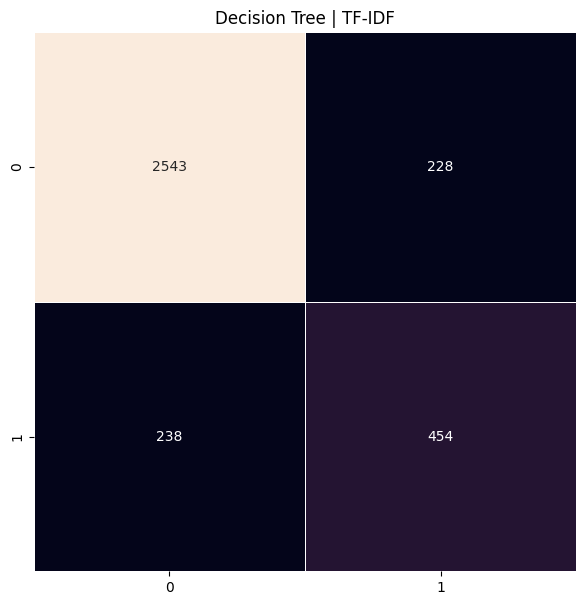

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_test = y_test.astype(int)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  89.1712388102801


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.89      0.99      0.94      2771
           1       0.92      0.50      0.65       692

    accuracy                           0.89      3463
   macro avg       0.90      0.75      0.79      3463
weighted avg       0.89      0.89      0.88      3463



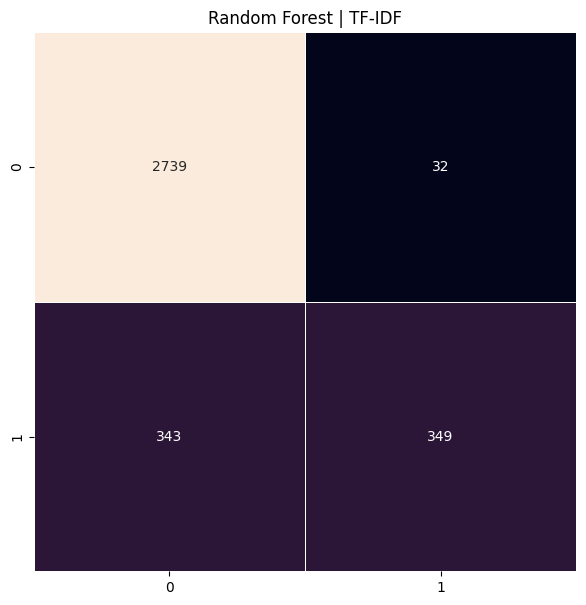

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,Text,score
2,@VirginAmerica plus you've added commercials to the experience... tacky.,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0
5,@VirginAmerica and it's a really big bad thing about it,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",1
...,...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday.",0
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ,0
14636,@AmericanAir thank you we got on a different flight to Chicago.,1
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc,0


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"
...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday."
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ
14636,@AmericanAir thank you we got on a different flight to Chicago.
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc


In [ ]:
y

,score
2,1.0
4,0.0
5,0.0
6,0.0
7,1.0
...,...
14634,0.0
14635,0.0
14636,1.0
14637,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(8078, 10000) (3463, 10000)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  91.04822408316488


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      2771
           1       0.91      0.61      0.73       692

    accuracy                           0.91      3463
   macro avg       0.91      0.80      0.84      3463
weighted avg       0.91      0.91      0.90      3463



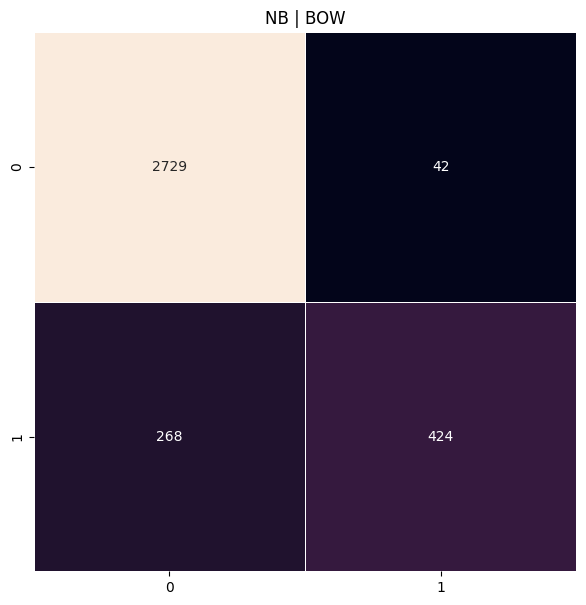

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  91.36586774473


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95      2771
           1       0.80      0.76      0.78       692

    accuracy                           0.91      3463
   macro avg       0.87      0.86      0.86      3463
weighted avg       0.91      0.91      0.91      3463



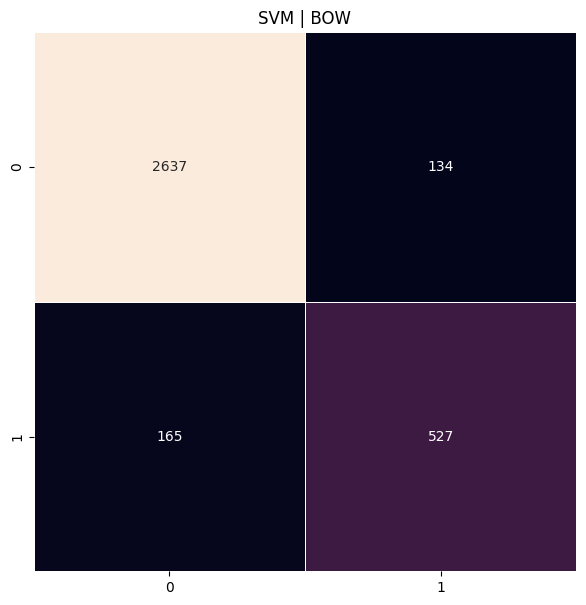

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  92.31879872942535


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.94      0.97      0.95      2771
           1       0.85      0.75      0.80       692

    accuracy                           0.92      3463
   macro avg       0.89      0.86      0.87      3463
weighted avg       0.92      0.92      0.92      3463



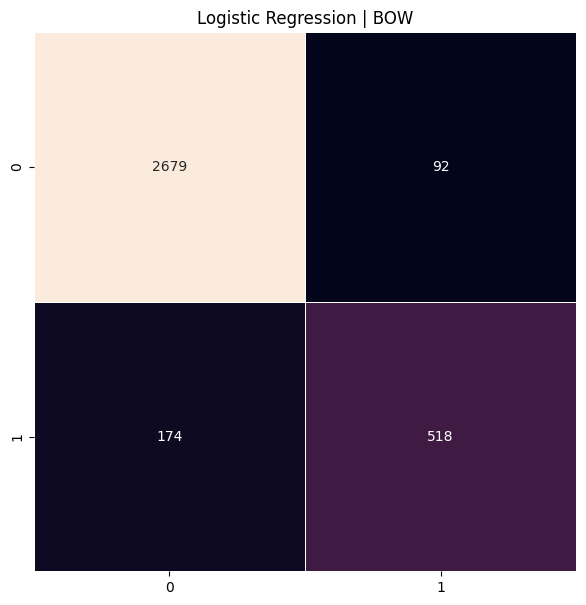

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  87.14987005486572


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.91      0.91      0.91      2771
           1       0.65      0.66      0.65       692

    accuracy                           0.86      3463
   macro avg       0.78      0.78      0.78      3463
weighted avg       0.86      0.86      0.86      3463



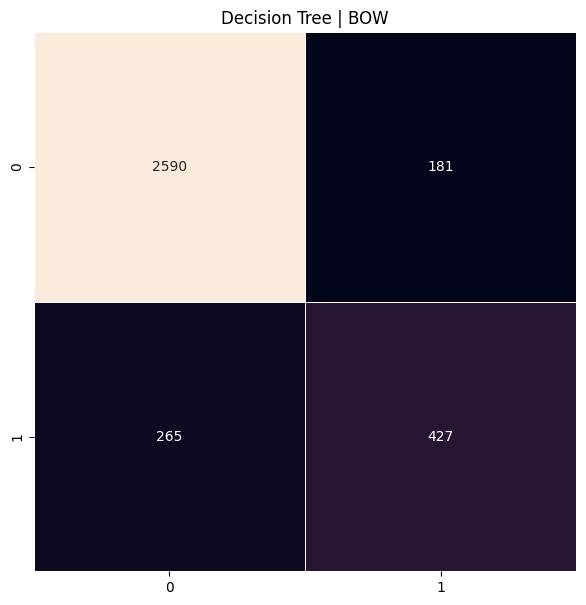

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  89.54663586485707


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.89      0.99      0.94      2771
           1       0.93      0.52      0.66       692

    accuracy                           0.90      3463
   macro avg       0.91      0.75      0.80      3463
weighted avg       0.90      0.90      0.88      3463



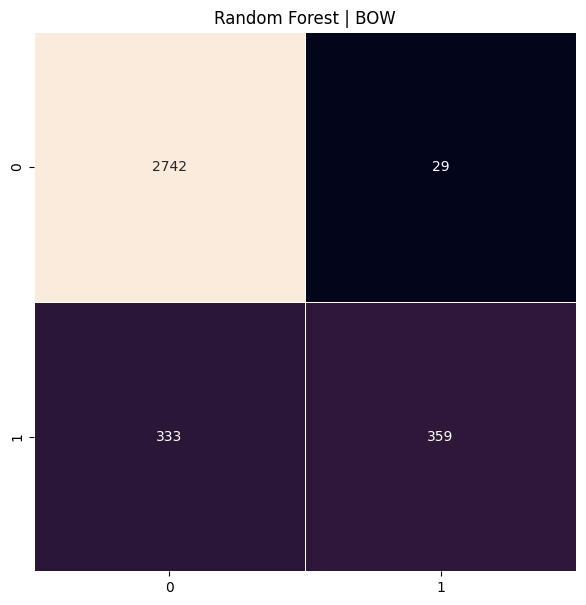

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,Text,score
2,@VirginAmerica plus you've added commercials to the experience... tacky.,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0
5,@VirginAmerica and it's a really big bad thing about it,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",1
...,...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday.",0
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ,0
14636,@AmericanAir thank you we got on a different flight to Chicago.,1
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc,0


In [ ]:
data_size=data.shape[0]
data_size

11541

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(3061562, 4276100)

In [ ]:
tokenized_tweet


,Text
2,"[@VirginAmerica, plus, you've, added, commercials, to, the, experience..., tacky.]"
4,"[@VirginAmerica, it's, really, aggressive, to, blast, obnoxious, ""entertainment"", in, your, guests', faces, &amp;, they, have, little, recourse]"
5,"[@VirginAmerica, and, it's, a, really, big, bad, thing, about, it]"
6,"[@VirginAmerica, seriously, would, pay, $30, a, flight, for, seats, that, didn't, have, this, playing., it's, really, the, only, bad, thing, about, flying, VA]"
7,"[@VirginAmerica, yes,, nearly, every, time, I, fly, VX, this, Ã¢ÂÂear, wormÃ¢ÂÂ, wonÃ¢ÂÂt, go, away, :)]"
...,...
14634,"[@AmericanAir, my, flight, was, Cancelled, Flightled,, leaving, tomorrow, morning., Auto, rebooked, for, a, Tuesday, night, flight, but, need, to, arrive, Monday.]"
14635,"[@AmericanAir, right, on, cue, with, the, delaysÃ°ÂÂÂ]"
14636,"[@AmericanAir, thank, you, we, got, on, a, different, flight, to, Chicago.]"
14637,"[@AmericanAir, leaving, over, 20, minutes, Late, Flight., No, warnings, or, communication, until, we, were, 15, minutes, Late, Flight., That's, called, shitty, customer, svc]"


In [ ]:
tokenized_tweet.shape

(11541,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 11541


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(11541, 100)
11541


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.361558,0.224618,-0.017908,0.014358,-0.165353,-0.365827,0.169108,0.629077,-0.108034,-0.382436,...,0.211084,0.246335,-0.037756,-0.192158,0.577175,0.335052,0.233676,-0.395460,0.070587,-0.058140
1,-0.446945,0.300933,-0.025759,0.017378,-0.190122,-0.454671,0.200158,0.778775,-0.173929,-0.482458,...,0.314917,0.289519,-0.044507,-0.181317,0.736768,0.416679,0.328502,-0.450068,0.059221,-0.109569
2,-0.571542,0.347172,-0.055189,0.026651,-0.225769,-0.504725,0.274943,0.969604,-0.205766,-0.599654,...,0.374480,0.370082,-0.037617,-0.230088,0.909595,0.487686,0.411695,-0.597863,0.104308,-0.146358
3,-0.531948,0.334130,-0.024897,0.010414,-0.223333,-0.491519,0.275092,0.910592,-0.214822,-0.590679,...,0.374813,0.337052,-0.046034,-0.216201,0.841142,0.473754,0.366322,-0.523007,0.078171,-0.138544
4,-0.399677,0.264295,-0.042233,0.015332,-0.120766,-0.340972,0.203116,0.738181,-0.192265,-0.441258,...,0.264673,0.249250,-0.008793,-0.162268,0.706414,0.346685,0.325111,-0.388647,0.094897,-0.142233
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11536,-0.428873,0.334389,-0.044148,-0.003804,-0.338011,-0.315950,0.460026,0.894174,-0.116355,-0.541821,...,0.326600,0.523147,0.063834,-0.278799,0.947253,0.398363,0.068055,-0.485161,0.096941,-0.155671
11537,-0.539820,0.323564,-0.016069,0.015333,-0.250759,-0.649609,0.238011,0.898262,-0.163106,-0.632465,...,0.340476,0.347601,-0.122063,-0.225037,0.740559,0.547242,0.382004,-0.621376,0.003752,-0.081133
11538,-0.504580,0.434869,-0.000985,0.010877,-0.246150,-0.462225,0.415043,1.121287,-0.286639,-0.621578,...,0.348435,0.472883,-0.016095,-0.268766,1.109249,0.507483,0.344827,-0.533495,0.162861,-0.196311
11539,-0.459343,0.331211,-0.024949,-0.063201,-0.238886,-0.523549,0.279860,0.820688,-0.131894,-0.494909,...,0.299664,0.408106,-0.106496,-0.237342,0.749284,0.514538,0.252367,-0.590610,0.053772,-0.198939


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)


In [ ]:
data['score']

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
11683    0
8629     1
6657     1
4153     0
11478    0
Name: score, dtype: int64


In [ ]:
yvalid.head()

,score
11826,0
8106,1
1280,0
14344,0
3830,1


In [ ]:
yvalid.shape

(3463,)

In [ ]:
ytrain

,score
11683,0
8629,1
6657,1
4153,0
11478,0
...,...
14350,0
6719,0
7099,1
1150,0


In [ ]:
ytrain.shape

(8078,)

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  83.91568004620271


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.5397553516819572


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.88      0.91      0.89      2771
           1       0.57      0.51      0.54       692

    accuracy                           0.83      3463
   macro avg       0.73      0.71      0.72      3463
weighted avg       0.82      0.83      0.82      3463



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.822287789510906

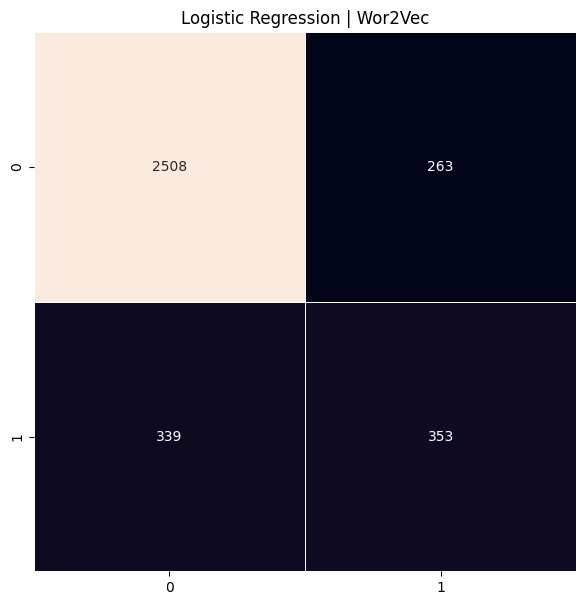

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,ytrain)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  84.6375974588507


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6092214663643235

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8480784148533109

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.90      0.92      0.91      2771
           1       0.64      0.58      0.61       692

    accuracy                           0.85      3463
   macro avg       0.77      0.75      0.76      3463
weighted avg       0.85      0.85      0.85      3463



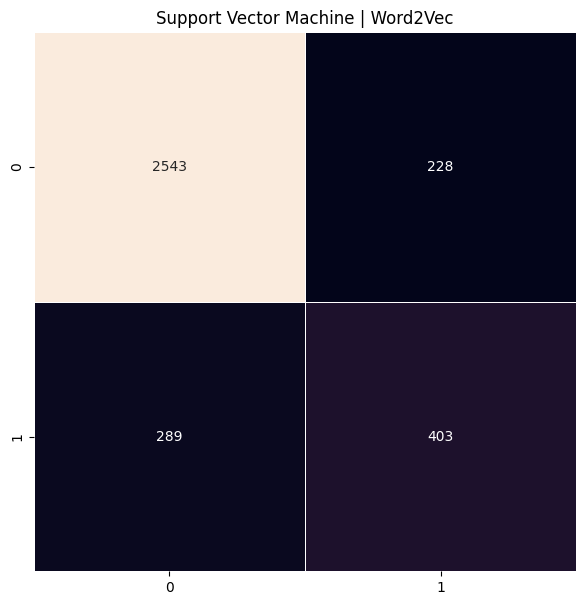

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  75.02165752237944


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.3888491779842745

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7540928148044301

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.85      0.84      0.85      2771
           1       0.38      0.39      0.39       692

    accuracy                           0.75      3463
   macro avg       0.62      0.62      0.62      3463
weighted avg       0.76      0.75      0.75      3463



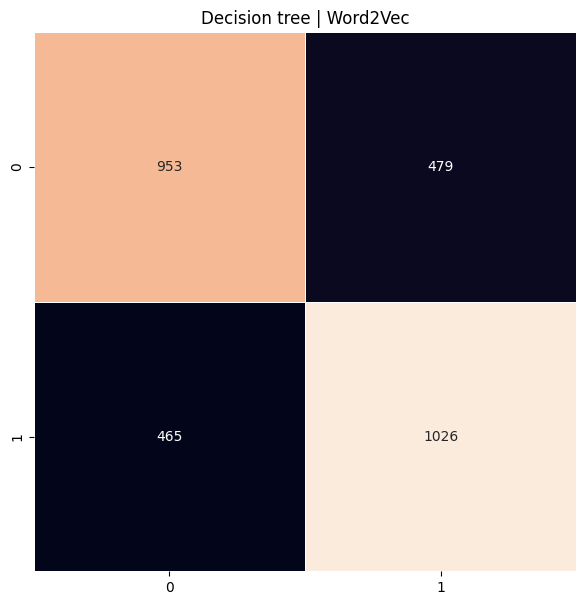

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  83.71354317066128


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.40380549682875266

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.84      0.98      0.91      2771
           1       0.75      0.28      0.40       692

    accuracy                           0.84      3463
   macro avg       0.80      0.63      0.65      3463
weighted avg       0.83      0.84      0.81      3463



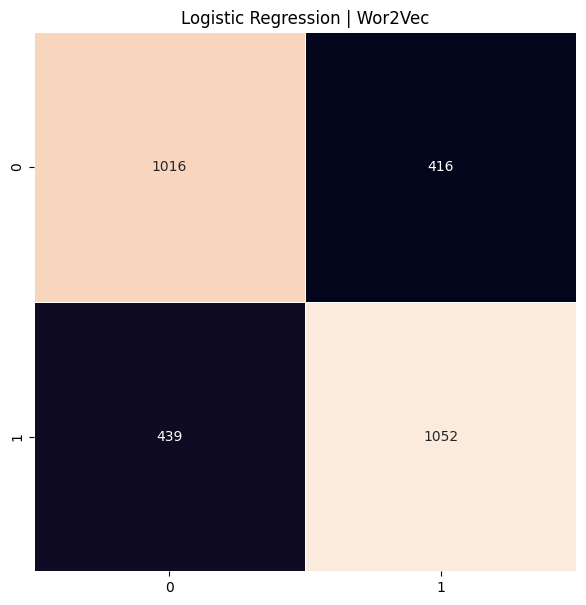

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, predictions_rf_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7075206539189545

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

9741

In [ ]:
tokenized_documents[0]

['wipro', 'growth', 'remains', 'mirage']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=9811, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
eur : 0
net : 1
profit : 2
mn : 3
stock : 4
r : 5
q : 6
share : 7
sale : 8
company : 9
year : 10
crore : 11
loss : 12
million : 13
finnish : 14
quarter : 15
market : 16
operating : 17
period : 18
said : 19
per : 20
fall : 21
bank : 22
mln : 23
price : 24
euro : 25
cent : 26
first : 27
compared : 28
demand : 29
future : 30
month : 31
high : 32
rt : 33
oyj : 34
group : 35
india : 36
oil : 37
corresponding : 38
hit : 39
low : 40
rise : 41
buy : 42
gain : 43
nifty : 44
may : 45
global : 46
sell : 47
u : 48
today : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

47

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 3218


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'china annual dogmeat fair open activist aapl amzn btc eth fb goog msft qqq spy tsla cnbc foxbusiness business money entrepreneur trading investing investment stock stockmarket forex crypto cryptocurrency bitcoin ethereum coinbase robinhood'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'european stocks push higher trade war threats recede https co iybgwmahhv trading tradingview forex eurusd investing investor entrepreneur stocks forexlifestyle wallstreet forexsignals business forextrader technicalanalysis millionaire billionaire https co rdzdsegyq'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


In [ ]:
len(sequences)

9741

In [ ]:
sequences[0]

[554, 59, 832, 6755]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(9741, 47)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
padded_sequences

array([[ 554,   59,  832, ...,    0,    0,    0],
       [ 960,    4, 4205, ...,    0,    0,    0],
       [  48,    4, 3419, ...,    0,    0,    0],
       ...,
       [  14, 3817, 1294, ...,    0,    0,    0],
       [  17,    2,    0, ...,    0,    0,    0],
       [ 529,  298,  274, ...,    0,    0,    0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train_int, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

ValueError: Unrecognized data type: x=[[2634   23    2 ...    0    0    0]
 [4378 4377  130 ...    0    0    0]
 [5789 2407 2850 ...    0    0    0]
 ...
 [1524   23  361 ...    0    0    0]
 [2996  685   23 ...    0    0    0]
 [ 688  122  383 ...    0    0    0]] (of type <class 'numpy.ndarray'>)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(2923,)

In [ ]:
y_train.shape

(6818,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - accuracy: 0.5144 - loss: 0.6925 - val_accuracy: 0.5210 - val_loss: 0.6909
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 282ms/step - accuracy: 0.5458 - loss: 0.6887 - val_accuracy: 0.5621 - val_loss: 0.6834
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.5898 - loss: 0.6761 - val_accuracy: 0.6011 - val_loss: 0.6748
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 12s 279ms/step - accuracy: 0.6101 - loss: 0.6666 - val_accuracy: 0.6042 - val_loss: 0.6586
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 263ms/step - accuracy: 0.6199 - loss: 0.6599 - val_accuracy: 0.6004 - val_loss: 0.6595
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 202ms/step - accuracy: 0.6108 - loss: 0.6606 - val_accuracy: 0.5816 - val_loss: 0.6761
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 201ms/step - accuracy: 0.6068 - loss: 0.6605 - val_accuracy: 0.6059 - val_loss: 0.6563
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - accuracy: 0.6265 - loss: 0.6508 - val

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 77.08%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_5', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 9812, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.04519786  0.00506743  0.04164286 ...  0.04010054 -0.00221134
   0.00623528]
 [-0.00735713  0.0218625  -0.03816529 ... -0.00974482 -0.0122553
   0.04100901]
 [-0.02643167 -0.00945206 -0.00791474 ... -0.0068404  -0.03539057
  -0.02666515]
 ...
 [-0.01960655  0.04041782 -0.02229015 ... -0.04667262  0.04667972
  -0.00404646]
 [-0.02550494  0.04417685  0.02810412 ... -0.02909876  0.04002215
  -0.01307654]
 [ 0.00185049  0.03814306 -0.03833202 ... -0.01929575  0.04256621
  -0.00403254]]


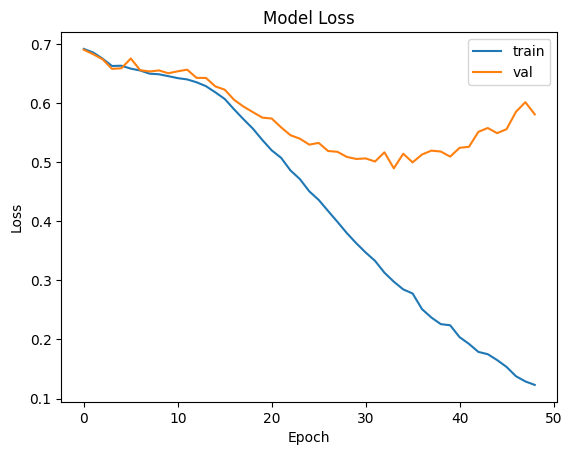

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

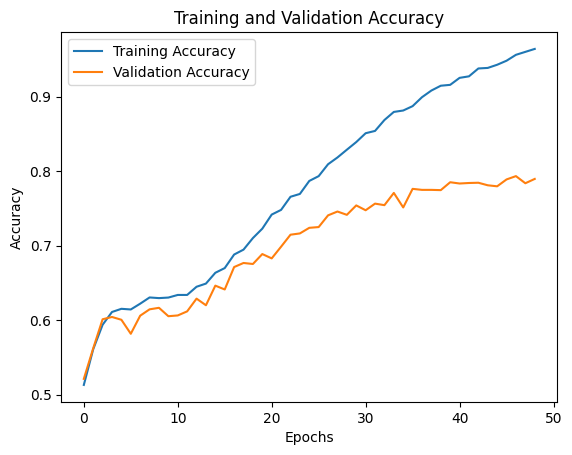

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 53, 100)        │     1,079,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 53, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,359,473 (5.19 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,079,100 (4.12 MB)

 Optimizer params: 186,916 (730.14 KB)

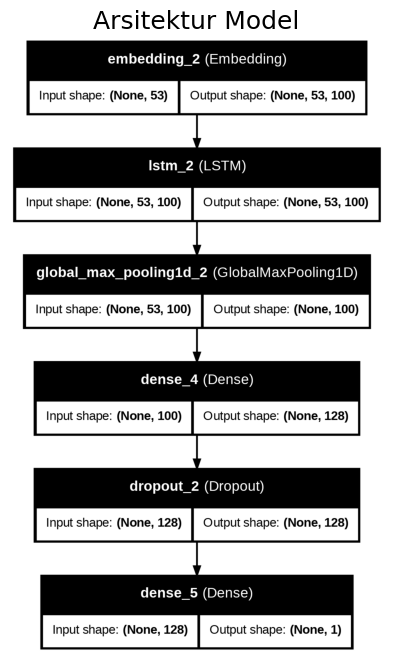

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



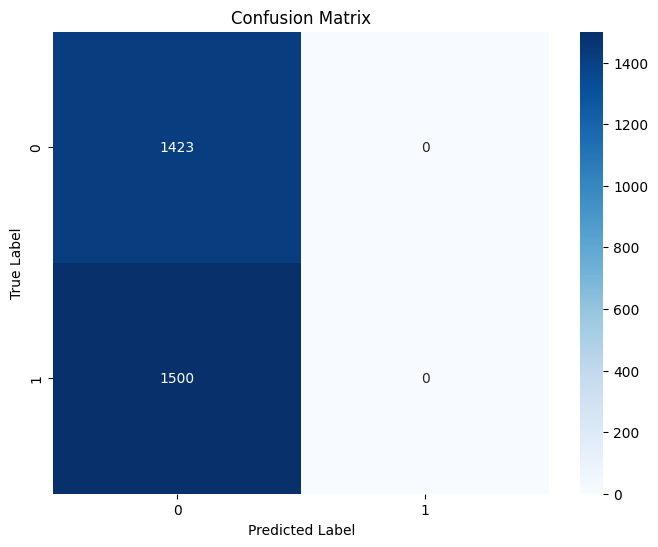

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


# [2. Hibrit Sütununa Göre](#b1)

* ## [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bitirme/Datasets/
#df=pd.read_csv("Loan.csv",index_col=0)


""" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz
PreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'
df.to_csv(PreprocessedSon2_df_file_path, index=False)"""


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bitirme/Datasets


" # Yeni Bir dosya kaydetme koddunu buraya yazıyoruz\nPreprocessedSon2_df_file_path = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon2_df.csv'\ndf.to_csv(PreprocessedSon2_df_file_path, index=False)"

In [ ]:
"""
Kaggle API ile yükleme
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"""

"\nKaggle API ile yükleme\nimport numpy as np\nimport pandas as pd\nimport os\nfor dirname, _, filenames in os.walk('/kaggle/input'):\n    for filename in filenames:\n        print(os.path.join(dirname, filename))\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'
file_path5 = '/content/drive/My Drive/Bitirme/Datasets/USAir/USAir_PreprocessedSon_df.csv'

df = pd.read_csv(file_path5, encoding='latin1', header=None)
#df = pd.read_csv(file_path5, index_col=0)

# Sütun isimlerini belirle--USAir
df.columns =['Text','score', 'hibrit', 'USAirPrePro', 'USAirPrePro2', 'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro', 'text_length', 'sentiment']

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
# Sütun isimlerini belirle--Finance
"""#df.columns=['Text','tokens', 'text_length', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPLSTMPrePRro',
       'score', 'oh_label']"""

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment'],
      dtype='object')


In [ ]:
#df4=pd.read_csv("PreprocessedSon3_df.csv",index_col=0)

In [ ]:
#df3=pd.read_csv("IMDB_df.csv",index_col=0)

In [ ]:
#df2=pd.read_csv("USAir_balanced_df.csv",index_col=0)

In [ ]:
#df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#b1)

In [ ]:
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
0,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
1,@VirginAmerica What @dhepburn said.,1,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,VirginAmerica What dhepburn said,@VirginAmerica What @dhepburn said.,VirginAmerica What dhepburn said,virginamerica dhepburn said,35,1
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
3,@VirginAmerica I didn't today... Must mean I need to take another trip!,1,virginamerica today must mean need take another trip,virginamerica didnt today must mean need take anoth trip,virginamerica today must mean need take another trip,virginamerica today must mean need take anoth trip,virginamerica today must mean need take anoth trip,VirginAmerica didn today Must mean need to take another trip,@VirginAmerica I didn't today... Must mean I need to take another trip!,VirginAmerica didn today Must mean need to take another trip,virginamerica n't today must mean need take anoth trip,71,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0


In [ ]:
df=df.drop(df.index[0])

In [ ]:
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
1,@VirginAmerica What @dhepburn said.,1,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,VirginAmerica What dhepburn said,@VirginAmerica What @dhepburn said.,VirginAmerica What dhepburn said,virginamerica dhepburn said,35,1
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
3,@VirginAmerica I didn't today... Must mean I need to take another trip!,1,virginamerica today must mean need take another trip,virginamerica didnt today must mean need take anoth trip,virginamerica today must mean need take another trip,virginamerica today must mean need take anoth trip,virginamerica today must mean need take anoth trip,VirginAmerica didn today Must mean need to take another trip,@VirginAmerica I didn't today... Must mean I need to take another trip!,VirginAmerica didn today Must mean need to take another trip,virginamerica n't today must mean need take anoth trip,71,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
5,@VirginAmerica and it's a really big bad thing about it,0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0


In [ ]:
df.shape

(14640, 13)

###### [Nötr sınıfı çıkarma](#p2)

In [ ]:
df["score"].value_counts()

,count
score,
0,9178
1,3099
2,2363


In [ ]:
print(df.shape)
df = df[df['airline_sentiment'] != 'neutral']
print(df.shape)
df.head(5)

(14640, 13)


KeyError: 'airline_sentiment'

In [ ]:
#nötr sınıf 1
print(df.shape)
df = df[df['score'] != '1']
print(df.shape)
df.head(5)

(14640, 13)
(11541, 13)


,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
5,@VirginAmerica and it's a really big bad thing about it,0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",2,virginamerica yes nearly every time fly vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,virginamerica yes nearly every time fly vx ear worm wont go away,virginamerica ye nearli everi time fli vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,VirginAmerica yes nearly every time fly VX this ear worm won go away,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",VirginAmerica yes nearly every time fly VX this ear worm won go away,"virginamerica ye , nearli everi time fli vx ear worm go away",85,2


In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#df['score'] =df['score'].astype(int)

In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
#Burda 0 olanlar 0 yapıldı 2 olanlar 1 yapıldı pozitif:1 negative:0
df['score'] = df['score'].apply(lambda x: x -1  if x == 2 else x)

In [ ]:
df["score"].value_counts()

,count
score,
0,9178
1,2363


In [ ]:
df['score']

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


In [ ]:
df['score2']

KeyError: 'score2'

In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment,score2
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2.0,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2,2.0
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0.0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0,0.0
5,@VirginAmerica and it's a really big bad thing about it,0.0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0,0.0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0.0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0,0.0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",2.0,virginamerica yes nearly every time fly vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,virginamerica yes nearly every time fly vx ear worm wont go away,virginamerica ye nearli everi time fli vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,VirginAmerica yes nearly every time fly VX this ear worm won go away,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",VirginAmerica yes nearly every time fly VX this ear worm won go away,"virginamerica ye , nearli everi time fli vx ear worm go away",85,2,2.0


In [ ]:
#df2 = df2.reset_index()

In [ ]:
#gerekmezse çalıştırma
"""df = df.reset_index()
df.isnull().values.any()

df.head()"""

,index,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label
0,1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0
1,2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0
2,3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0
3,4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0
4,5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0


In [ ]:
df.columns

Index(['Text', 'tokens', 'text_length', 'hibrit', 'USAirPrePro',
       'USAirPrePro2', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2',
       'MuammerNLPLSTMPrePRro', 'score', 'oh_label', 'score2'],
      dtype='object')

In [ ]:
#df = df.drop(columns=['index'])


In [ ]:
df.shape

(11541, 13)

In [ ]:
print(len(df))

11541


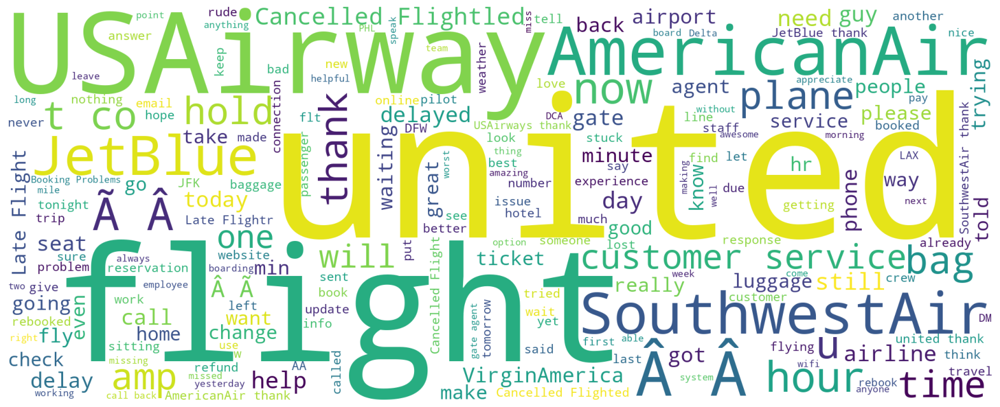

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
#secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score'
#secilen_sentiment_kolon_adi='score2'
secilen_kolon_adi='hibrit'
#secilen_kolon_adi='Text'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)

In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
df

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
2,@VirginAmerica plus you've added commercials to the experience... tacky.,1,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
5,@VirginAmerica and it's a really big bad thing about it,0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",1,virginamerica yes nearly every time fly vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,virginamerica yes nearly every time fly vx ear worm wont go away,virginamerica ye nearli everi time fli vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,VirginAmerica yes nearly every time fly VX this ear worm won go away,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",VirginAmerica yes nearly every time fly VX this ear worm won go away,"virginamerica ye , nearli everi time fli vx ear worm go away",85,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14634,"@America

In [ ]:
data.head()

,hibrit,score
2,virginamerica plus added commercials experience tacky,1
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,0
5,virginamerica really big bad thing,0
6,virginamerica seriously would pay flight seats playing really bad thing flying va,0
7,virginamerica yes nearly every time fly vx ear worm go away,1


In [ ]:
X_df.head()

,hibrit
2,virginamerica plus added commercials experience tacky
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse
5,virginamerica really big bad thing
6,virginamerica seriously would pay flight seats playing really bad thing flying va
7,virginamerica yes nearly every time fly vx ear worm go away


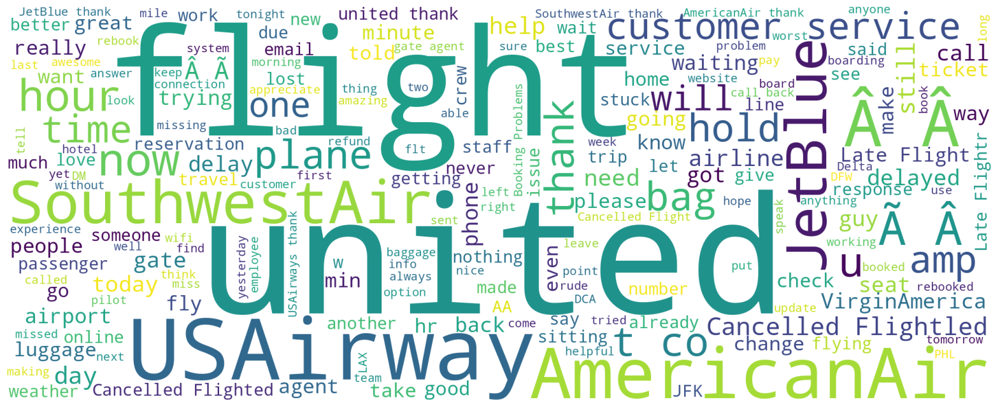

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

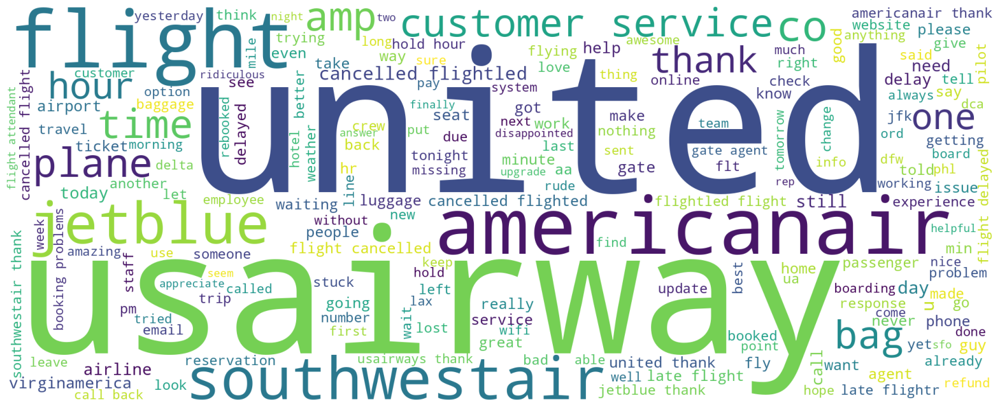

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,hibrit
2,virginamerica plus added commercials experience tacky
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse
5,virginamerica really big bad thing
6,virginamerica seriously would pay flight seats playing really bad thing flying va
7,virginamerica yes nearly every time fly vx ear worm go away
...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
14635,americanair right cue delays
14636,americanair thank got different flight chicago
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc


In [ ]:
df['score2'] = df['score'].apply(lambda x: x - 1 if x == 2 else x)

In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


In [ ]:
y = y.apply(lambda x: x - 1 if x == 2 else x)
y

,score
2,1.0
4,0.0
5,0.0
6,0.0
7,1.0
...,...
14634,0.0
14635,0.0
14636,1.0
14637,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
 y_liste= y_liste.apply(lambda x: x - 1 if x == 2 else x)
 y_liste= y_liste.apply(lambda x: x + 1 if x == -1 else x)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

####  [keşifsel veri analizi için deneme](#b1)


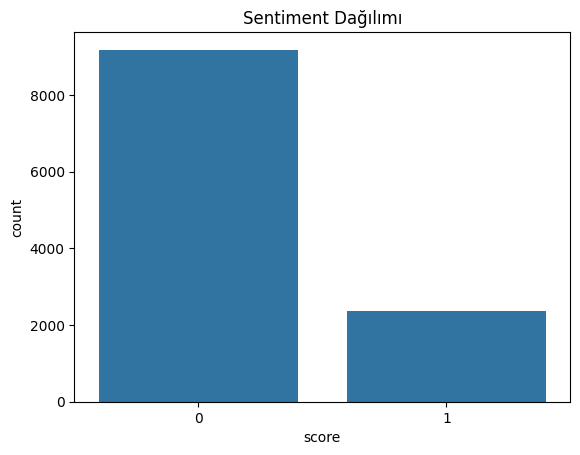

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

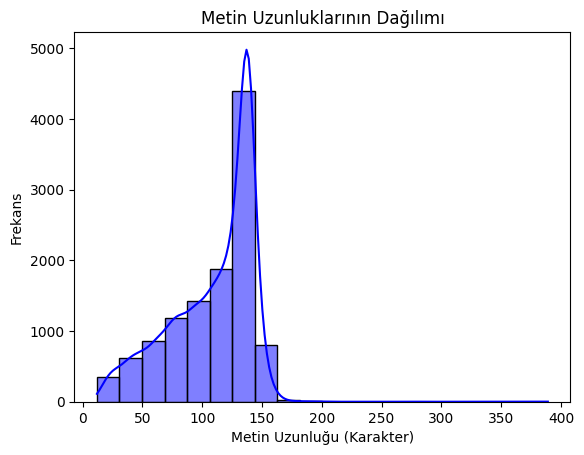

In [ ]:
df['text_length'] = df['Text'].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

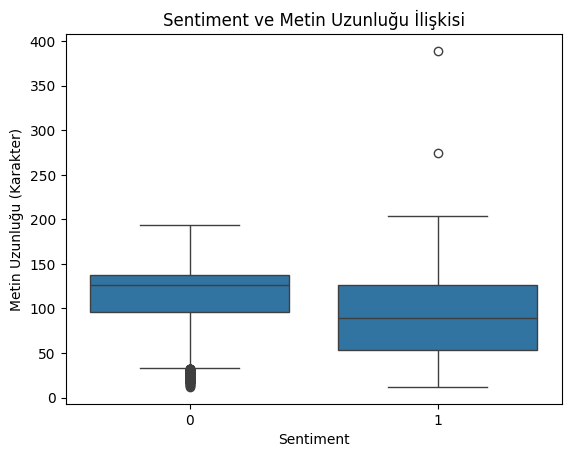

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

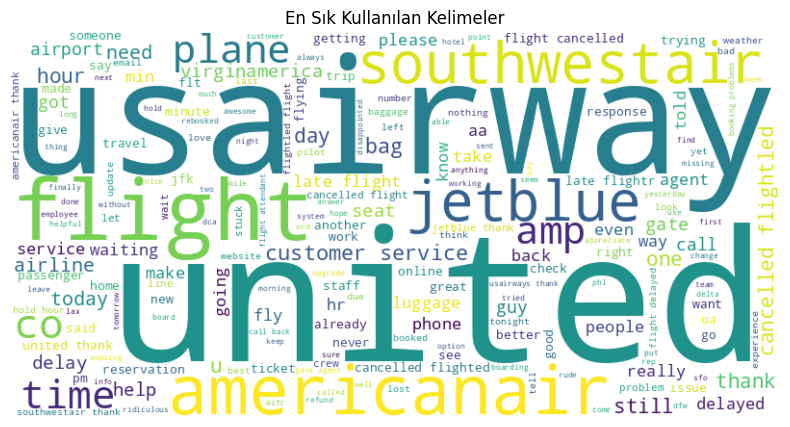

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df[secilen_kolon_adi]).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
df['score'] = df['score'].astype(int)

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()


In [ ]:
positive_text

' virginamerica plus added commercials experience tacky   virginamerica yes nearly every time fly vx ear worm go away   virginamerica well   virginamerica amazing arrived hour early good   virginamerica lt pretty graphics much better minimal iconography   virginamerica great deal already thinking nd trip australia amp even gone st trip yet p  virginamerica virginmedia flying fabulous seductive skies take stress away travel http co ahlxhhkiyn  virginamerica thanks   virginamerica excited first cross country flight lax mco heard nothing great things virgin america daystogo flying virginamerica   virginamerica know would amazingly awesome bos fll please want fly   virginamerica love graphic http co ut grrwaaa  virginamerica love hipster innovation feel good brand   virginamerica great news america could start flights hawaii end year http co p zy fe via pacificbiznews  virginamerica moodlighting way fly best experience ever cool calming moodlitmonday  virginamerica freddieawards done done 

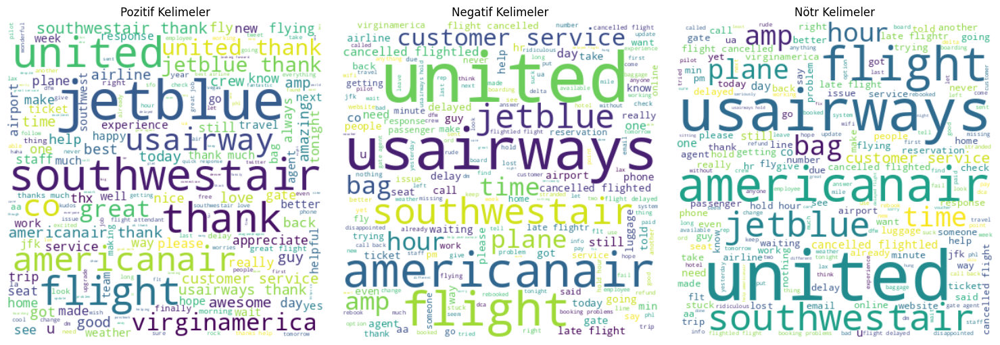

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


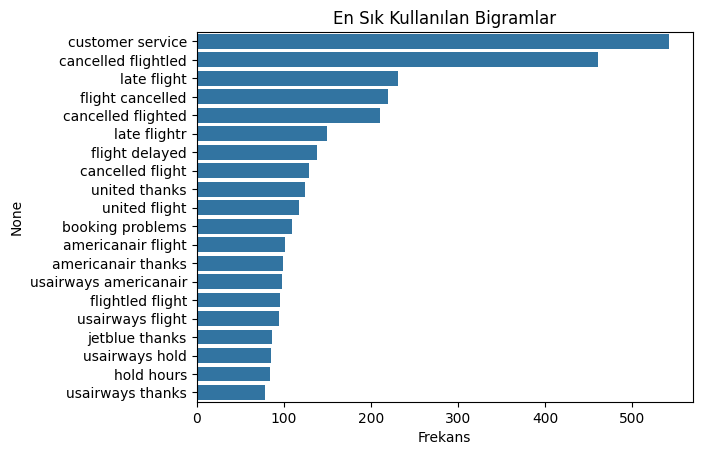

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

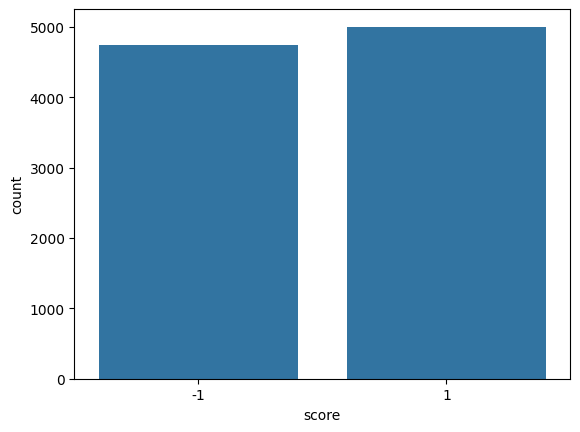

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment', 'score2'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
 y_liste= y_liste.apply(lambda x: x - 1 if x == 2 else x)
 y_liste= y_liste.apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
2,virginamerica plus added commercials experience tacky,1
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,0
5,virginamerica really big bad thing,0
6,virginamerica seriously would pay flight seats playing really bad thing flying va,0
7,virginamerica yes nearly every time fly vx ear worm go away,1
...,...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0
14635,americanair right cue delays,0
14636,americanair thank got different flight chicago,1
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc,0


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"
...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday."
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ
14636,@AmericanAir thank you we got on a different flight to Chicago.
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,hibrit
2,virginamerica plus added commercials experience tacky
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse
5,virginamerica really big bad thing
6,virginamerica seriously would pay flight seats playing really bad thing flying va
7,virginamerica yes nearly every time fly vx ear worm go away
...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
14635,americanair right cue delays
14636,americanair thank got different flight chicago
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc


In [ ]:
y_liste

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(8078, 9268) (3463, 9268)


In [ ]:
print(test_vectors)

  (0, 1149)	0.2949210528789199
  (0, 1305)	0.5822479367019033
  (0, 2990)	0.20066684983902833
  (0, 3003)	0.35284079473218666
  (0, 8450)	0.605021445981643
  (0, 8614)	0.20783202743053628
  (1, 1492)	0.2766644010193099
  (1, 2990)	0.1742392761023148
  (1, 3423)	0.6735138726426537
  (1, 3783)	0.28048045125025883
  (1, 4221)	0.21850996434396272
  (1, 8729)	0.5595182384683401
  (2, 101)	0.2756739350314544
  (2, 166)	0.2204196419601428
  (2, 610)	0.2902597569025727
  (2, 919)	0.2625982774460013
  (2, 2990)	0.10890792200423977
  (2, 3262)	0.1927737095410845
  (2, 4634)	0.23832328648499124
  (2, 5108)	0.24740060818718695
  (2, 6246)	0.24328658690249458
  (2, 6583)	0.30458074618917486
  (2, 6923)	0.24885907867856613
  (2, 7603)	0.33129668680394425
  (2, 7653)	0.4228775828256169
  :	:
  (3460, 1083)	0.27689703197544446
  (3460, 3361)	0.44590371540971635
  (3460, 4655)	0.3035416699674783
  (3460, 5865)	0.2613789986783604
  (3460, 6041)	0.19468428613336564
  (3460, 6066)	0.4019889606435488
  (34


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  84.08894022523823


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91      2771
           1       0.99      0.21      0.34       692

    accuracy                           0.84      3463
   macro avg       0.91      0.60      0.62      3463
weighted avg       0.87      0.84      0.80      3463



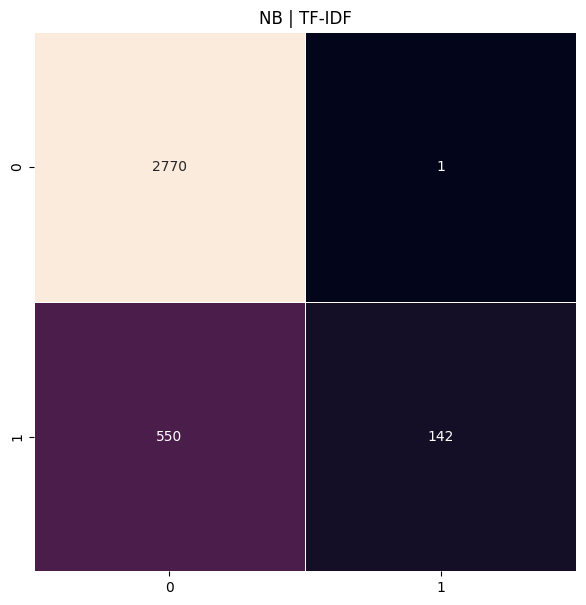

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

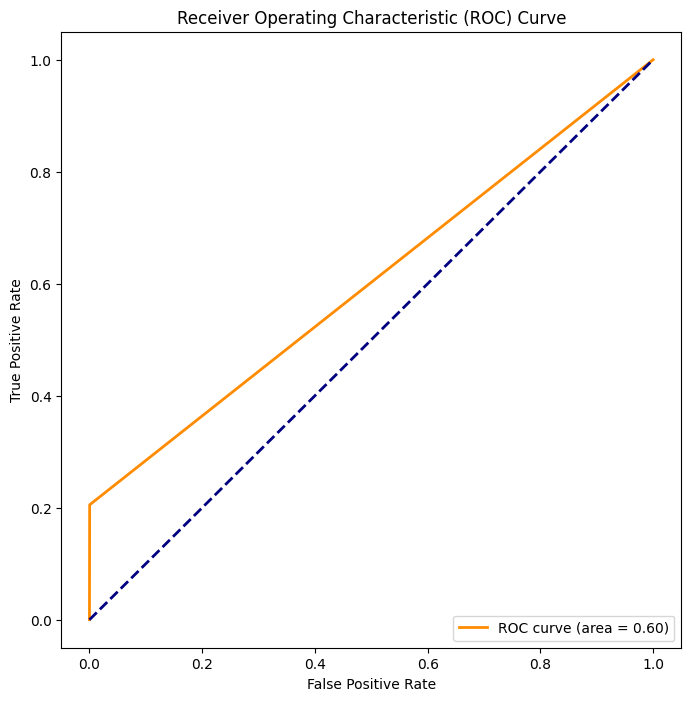

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predicted_NB)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.11666185388393


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2771
           1       0.87      0.71      0.78       692

    accuracy                           0.92      3463
   macro avg       0.90      0.84      0.87      3463
weighted avg       0.92      0.92      0.92      3463



In [ ]:
y_test.head(500)

,score
11826,0
8106,1
1280,0
14344,0
3830,1
...,...
5336,0
5185,0
11660,0
3277,1


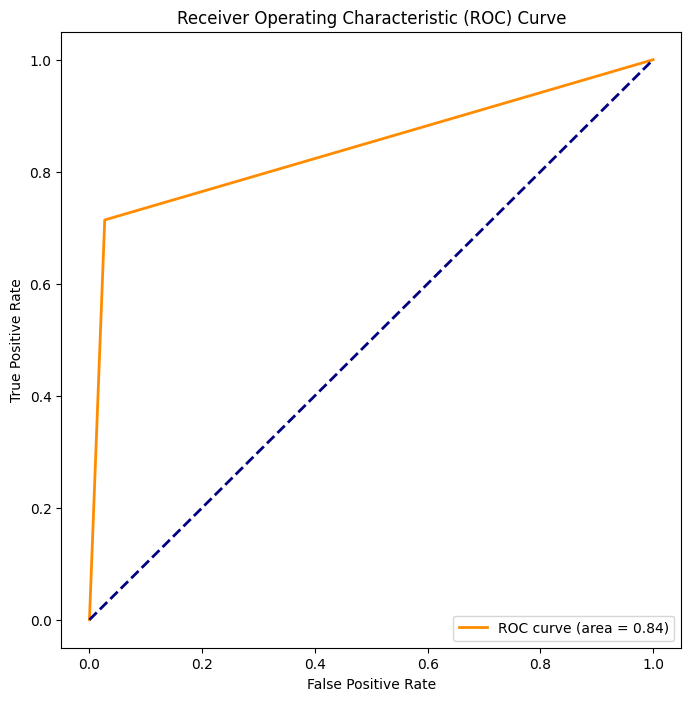

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_SVM)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


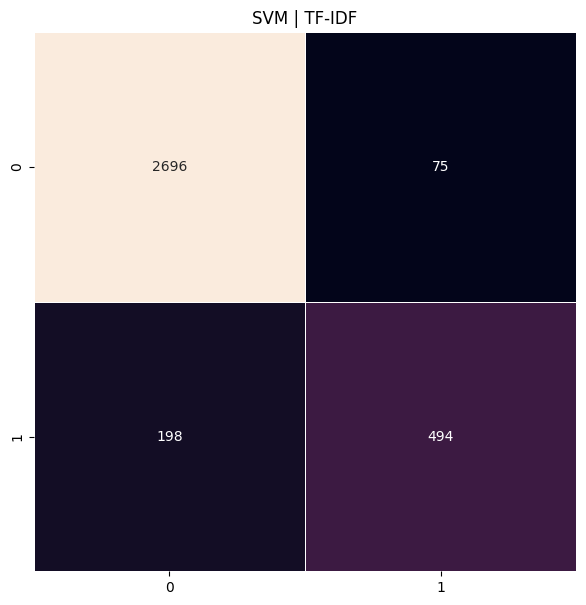

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  90.41293676003465


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      2771
           1       0.90      0.59      0.71       692

    accuracy                           0.90      3463
   macro avg       0.90      0.79      0.83      3463
weighted avg       0.90      0.90      0.90      3463



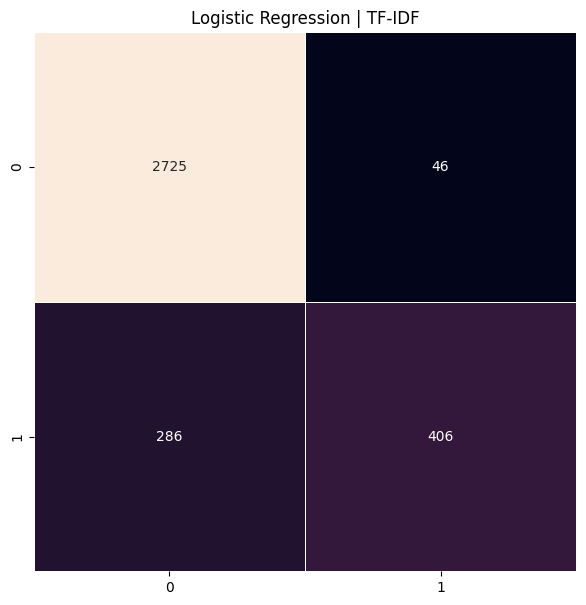

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score
11826,0
8106,1
1280,0
14344,0
3830,1
...,...
398,1
1448,0
11438,0
13383,0


In [ ]:
predictions_log

array([0, 1, 0, ..., 0, 0, 0])

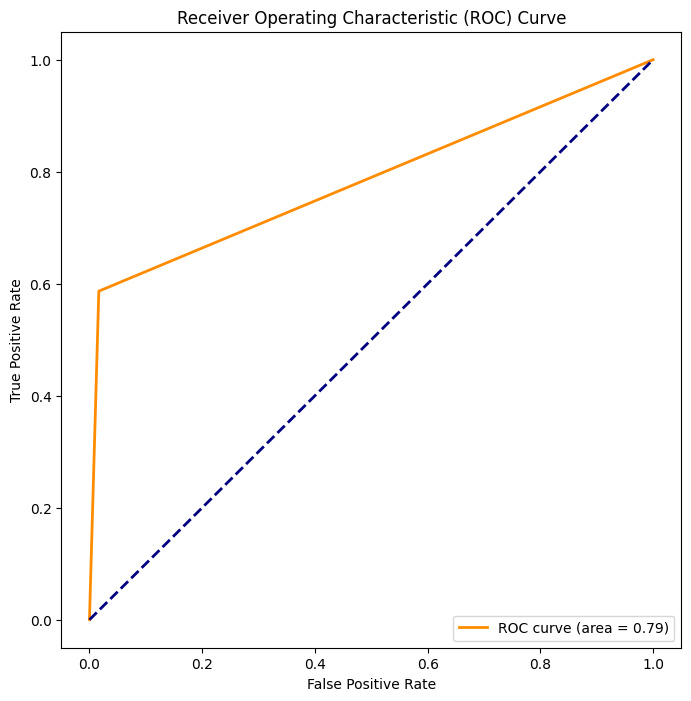

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_test = y_test.astype(int)
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  88.07392434305515


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.93      0.92      0.93      2771
           1       0.70      0.71      0.70       692

    accuracy                           0.88      3463
   macro avg       0.81      0.82      0.81      3463
weighted avg       0.88      0.88      0.88      3463



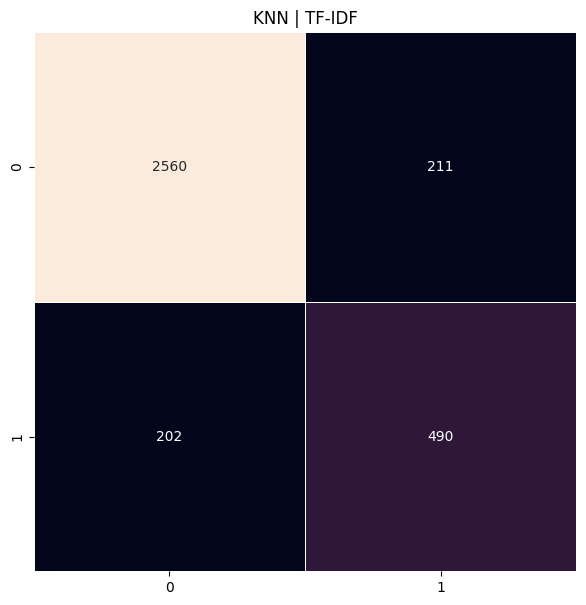

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

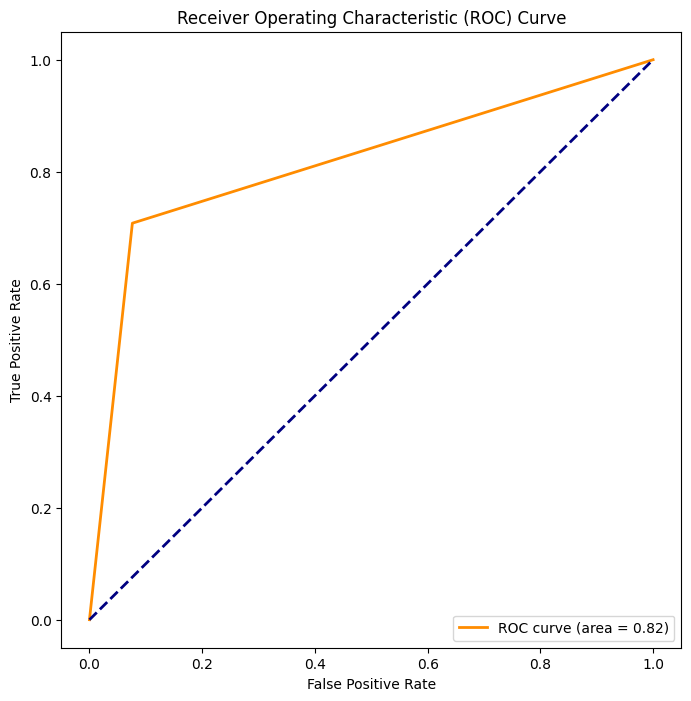

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_test = y_test.astype(int)
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  85.67715853306382


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.91      0.91      0.91      2771
           1       0.65      0.63      0.64       692

    accuracy                           0.86      3463
   macro avg       0.78      0.77      0.77      3463
weighted avg       0.86      0.86      0.86      3463



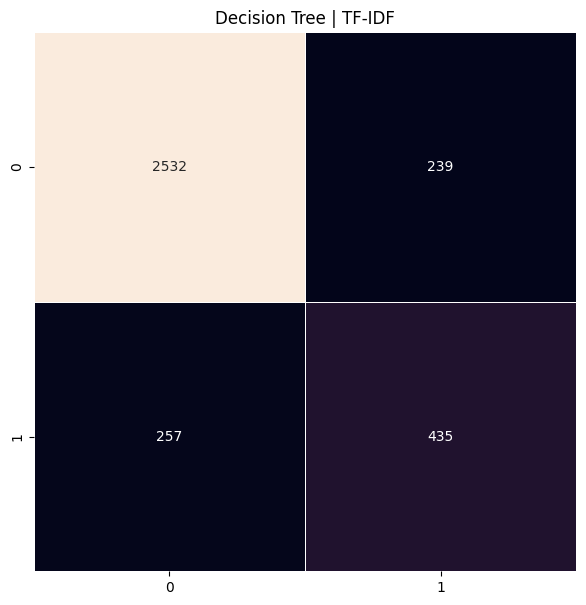

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_test = y_test.astype(int)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  90.3263066705169


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2771
           1       0.86      0.62      0.72       692

    accuracy                           0.90      3463
   macro avg       0.88      0.80      0.83      3463
weighted avg       0.90      0.90      0.90      3463



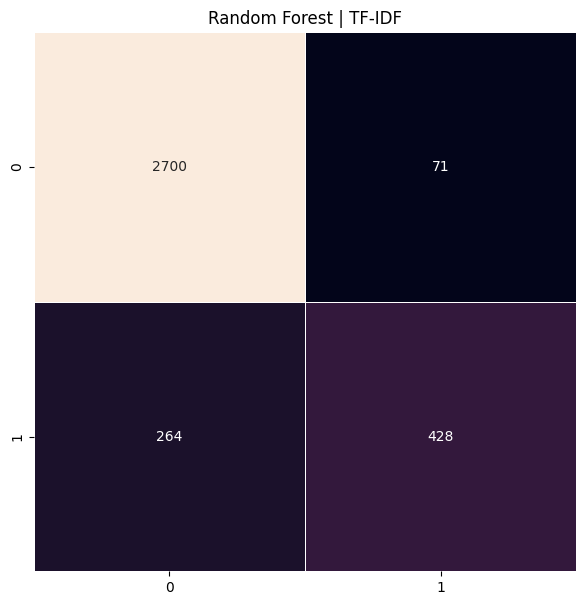

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
2,virginamerica plus added commercials experience tacky,1
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,0
5,virginamerica really big bad thing,0
6,virginamerica seriously would pay flight seats playing really bad thing flying va,0
7,virginamerica yes nearly every time fly vx ear worm go away,1
...,...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0
14635,americanair right cue delays,0
14636,americanair thank got different flight chicago,1
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc,0


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,hibrit
2,virginamerica plus added commercials experience tacky
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse
5,virginamerica really big bad thing
6,virginamerica seriously would pay flight seats playing really bad thing flying va
7,virginamerica yes nearly every time fly vx ear worm go away
...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
14635,americanair right cue delays
14636,americanair thank got different flight chicago
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc


In [ ]:
y

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(8078, 9268) (3463, 9268)


###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  90.70170372509385


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      2771
           1       0.87      0.63      0.73       692

    accuracy                           0.91      3463
   macro avg       0.89      0.80      0.84      3463
weighted avg       0.90      0.91      0.90      3463



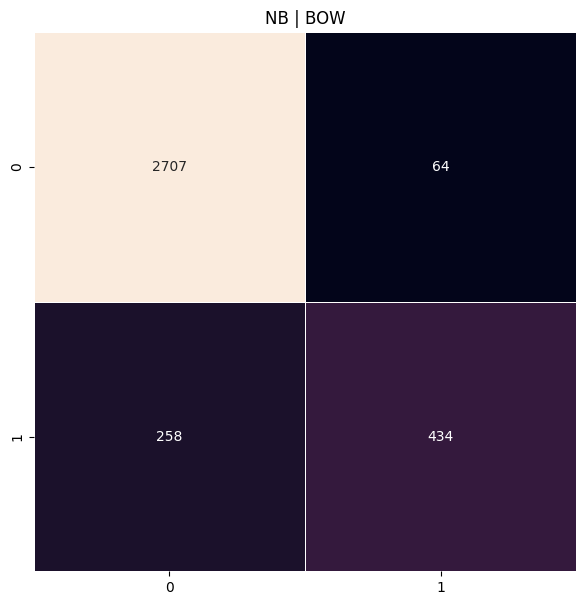

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  91.13485417268265


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.94      0.95      0.95      2771
           1       0.80      0.74      0.77       692

    accuracy                           0.91      3463
   macro avg       0.87      0.85      0.86      3463
weighted avg       0.91      0.91      0.91      3463



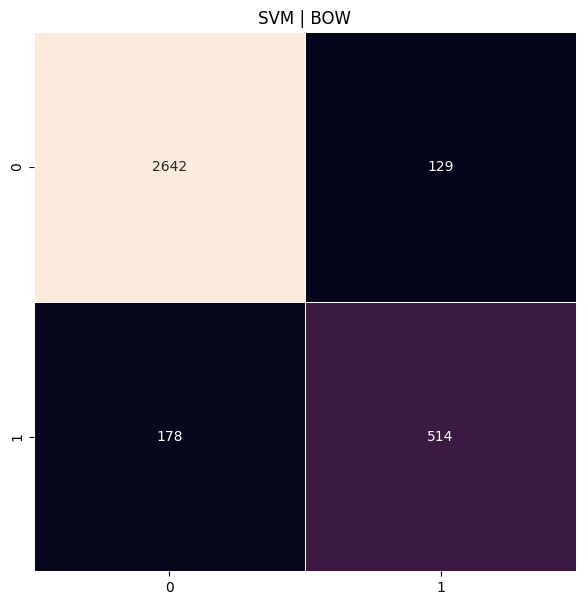

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  91.27923765521224


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2771
           1       0.84      0.70      0.76       692

    accuracy                           0.91      3463
   macro avg       0.88      0.83      0.85      3463
weighted avg       0.91      0.91      0.91      3463



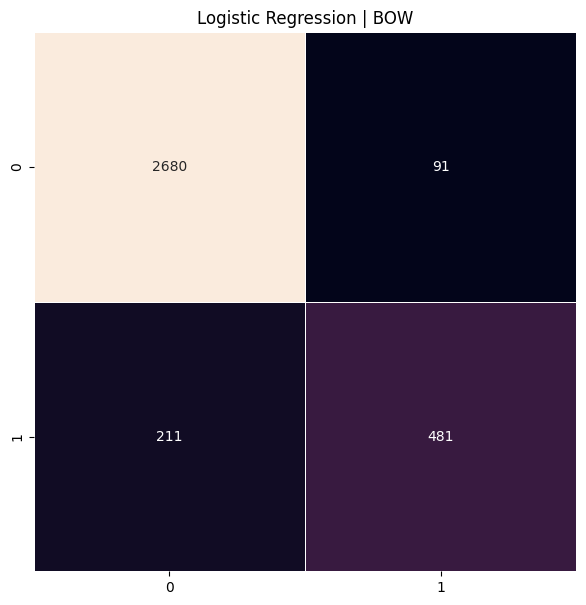

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  86.5434594282414


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92      2771
           1       0.68      0.61      0.65       692

    accuracy                           0.87      3463
   macro avg       0.79      0.77      0.78      3463
weighted avg       0.86      0.87      0.86      3463



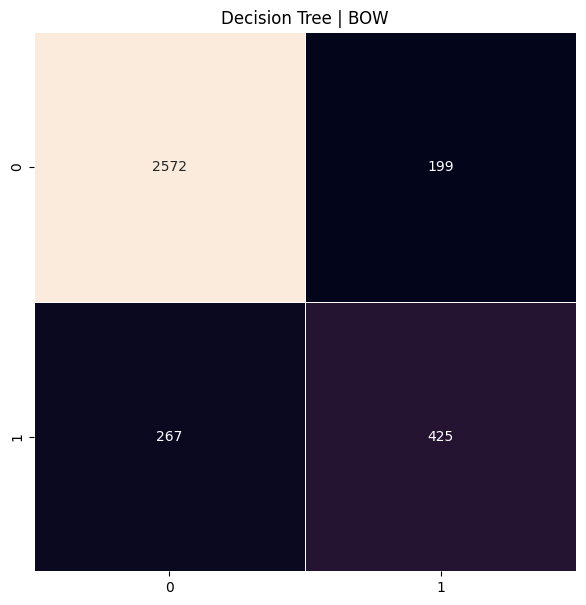

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  90.00866300895177


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      2771
           1       0.82      0.64      0.72       692

    accuracy                           0.90      3463
   macro avg       0.87      0.80      0.83      3463
weighted avg       0.90      0.90      0.90      3463



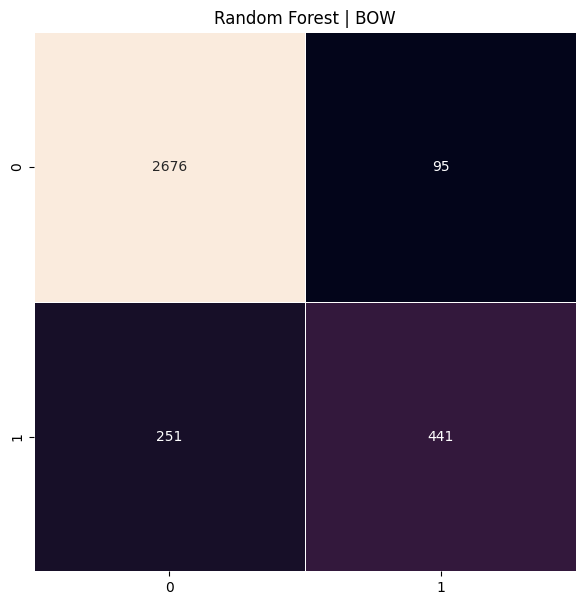

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
2,virginamerica plus added commercials experience tacky,1
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,0
5,virginamerica really big bad thing,0
6,virginamerica seriously would pay flight seats playing really bad thing flying va,0
7,virginamerica yes nearly every time fly vx ear worm go away,1
...,...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0
14635,americanair right cue delays,0
14636,americanair thank got different flight chicago,1
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc,0


In [ ]:
data_size=data.shape[0]
data_size

11541

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(1906110, 2399040)

In [ ]:
tokenized_tweet


,hibrit
2,"[virginamerica, plus, added, commercials, experience, tacky]"
4,"[virginamerica, really, aggressive, blast, obnoxious, entertainment, guests, faces, amp, little, recourse]"
5,"[virginamerica, really, big, bad, thing]"
6,"[virginamerica, seriously, would, pay, flight, seats, playing, really, bad, thing, flying, va]"
7,"[virginamerica, yes, nearly, every, time, fly, vx, ear, worm, go, away]"
...,...
14634,"[americanair, flight, cancelled, flightled, leaving, tomorrow, morning, auto, rebooked, tuesday, night, flight, need, arrive, monday]"
14635,"[americanair, right, cue, delays]"
14636,"[americanair, thank, got, different, flight, chicago]"
14637,"[americanair, leaving, minutes, late, flight, warnings, communication, minutes, late, flight, called, shitty, customer, svc]"


In [ ]:
tokenized_tweet.shape

(11541,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 11541


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(11541, 100)
11541


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.323264,0.361070,0.052408,-0.144750,0.156114,-0.467811,0.183392,0.496069,-0.187000,-0.404376,...,0.410130,0.295887,0.070825,0.097141,0.183107,0.145226,0.106760,-0.580905,0.185738,-0.093072
1,-0.218607,0.254063,0.051553,-0.075481,0.116860,-0.345758,0.155745,0.358361,-0.114704,-0.300548,...,0.316868,0.172381,0.047687,0.066429,0.091256,0.110189,0.070366,-0.416168,0.138093,-0.035327
2,-0.477001,0.544192,0.095771,-0.185293,0.243375,-0.725492,0.298776,0.758549,-0.261234,-0.620244,...,0.654261,0.398464,0.094858,0.144113,0.228151,0.237824,0.163003,-0.874794,0.278769,-0.103163
3,-0.401324,0.469972,0.114523,-0.146193,0.226494,-0.649352,0.306549,0.678012,-0.201865,-0.569115,...,0.603153,0.309393,0.083907,0.111457,0.183374,0.212724,0.119904,-0.803216,0.264441,-0.082628
4,-0.373091,0.436325,0.087317,-0.134859,0.221146,-0.570991,0.249131,0.611256,-0.188436,-0.487636,...,0.539937,0.292346,0.079417,0.101001,0.163262,0.189160,0.127913,-0.699142,0.224318,-0.072577
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11536,-0.258240,0.400139,0.213927,-0.040585,0.197050,-0.648733,0.457541,0.624942,-0.093046,-0.633783,...,0.608009,0.124390,0.049503,0.061705,0.070169,0.243025,-0.003255,-0.865444,0.323286,-0.023600
11537,-0.366327,0.436089,0.104820,-0.138062,0.216939,-0.614340,0.300356,0.652035,-0.184006,-0.540627,...,0.559557,0.278361,0.083993,0.110368,0.174062,0.197772,0.101719,-0.772480,0.256387,-0.070123
11538,-0.413989,0.515649,0.168170,-0.118949,0.267982,-0.763235,0.432629,0.790078,-0.187851,-0.701187,...,0.707262,0.276430,0.097286,0.112394,0.163510,0.258529,0.083483,-0.965623,0.334840,-0.066438
11539,-0.287553,0.393032,0.168720,-0.104394,0.256996,-0.666824,0.379865,0.691034,-0.181027,-0.641995,...,0.606697,0.169639,0.120298,0.086430,0.061502,0.211336,0.005390,-0.802760,0.324183,-0.039021


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)


In [ ]:
data['score']

,score
2,1
4,0
5,0
6,0
7,1
...,...
14634,0
14635,0
14636,1
14637,0


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
11683    0
8629     1
6657     1
4153     0
11478    0
Name: score, dtype: int64


In [ ]:
yvalid.head()

,score
11826,0
8106,1
1280,0
14344,0
3830,1


In [ ]:
yvalid.shape

(3463,)

In [ ]:
ytrain

,score
11683,0
8629,1
6657,1
4153,0
11478,0
...,...
14350,0
6719,0
7099,1
1150,0


In [ ]:
ytrain.shape

(8078,)

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  84.66647415535662


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.5695746214852199


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89      2771
           1       0.57      0.57      0.57       692

    accuracy                           0.83      3463
   macro avg       0.73      0.73      0.73      3463
weighted avg       0.83      0.83      0.83      3463



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8277458753352186

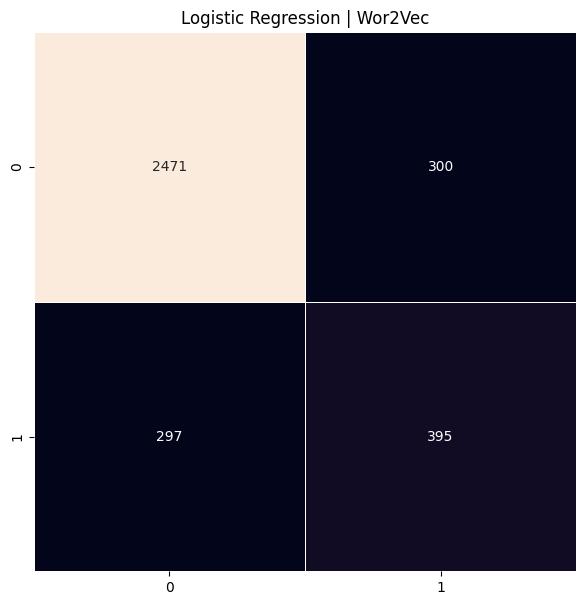

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,ytrain)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  85.61940514005198


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.649753347427766

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8577966973346772

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91      2771
           1       0.63      0.67      0.65       692

    accuracy                           0.86      3463
   macro avg       0.77      0.79      0.78      3463
weighted avg       0.86      0.86      0.86      3463



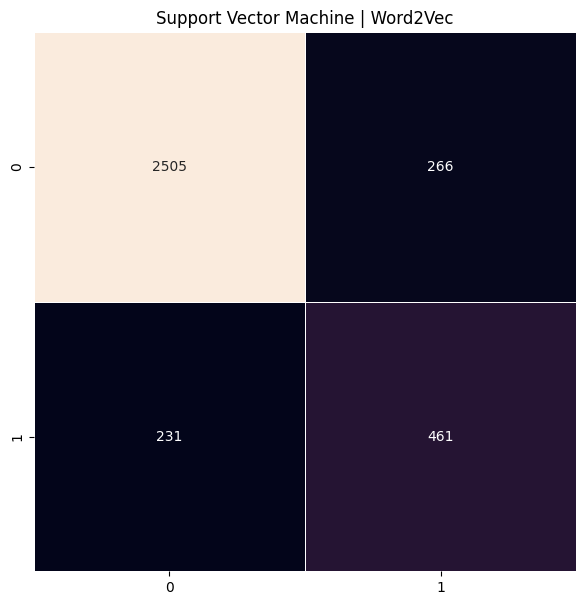

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  79.52642217730292


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.4930939226519337

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7914909899611997

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.88      0.86      0.87      2771
           1       0.47      0.52      0.49       692

    accuracy                           0.79      3463
   macro avg       0.67      0.69      0.68      3463
weighted avg       0.80      0.79      0.79      3463



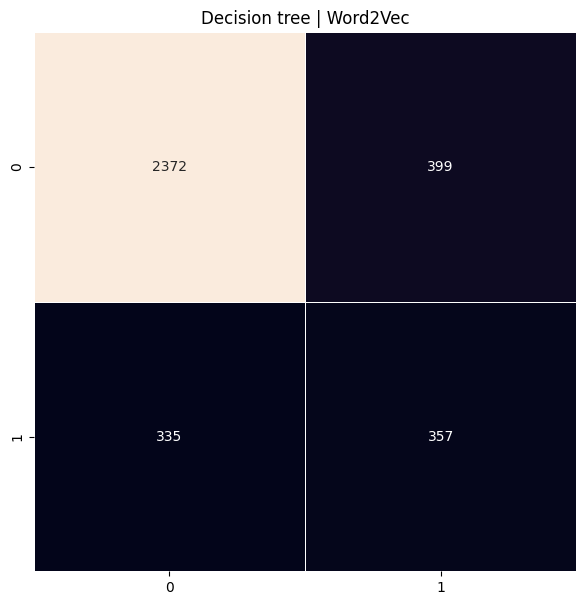

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
#multi output için
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  85.30176147848685


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import f1_score

# Multi-label için model sarmalayıcı kullan
RF = OneVsRestClassifier(RandomForestClassifier(random_state=42))
RF.fit(xtrain_w2v, ytrain)

# Tahmin
predictions = RF.predict(xvalid_w2v)

# F1 score
f1 = f1_score(yvalid, predictions, average='macro')  # veya 'samples', 'micro'
print("F1 Score:", f1)


In [ ]:

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.5527272727272727

In [ ]:
#2 output
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = OneVsRestClassifier(RandomForestClassifier())
RF.fit(xtrain_w2v, ytrain)

prediction_RF = RF.predict(xvalid_w2v)
f1 = f1_score(yvalid, prediction_RF, average='macro')  # veya 'micro', 'samples'
print("F1 Score:", f1)


F1 Score: 0.7331568514134088


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.87      0.96      0.92      2771
           1       0.74      0.45      0.55       692

    accuracy                           0.86      3463
   macro avg       0.81      0.70      0.74      3463
weighted avg       0.85      0.86      0.84      3463



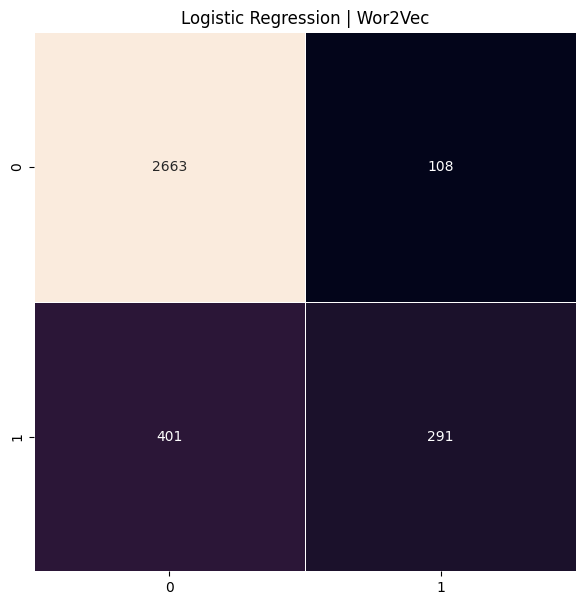

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, predictions_rf_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.7075206539189545

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score2
1,wipro growth remains mirage,0
2,chinese stock leave u investor vulnerable,0
3,u stock finish mixed amid tech selling,0
4,opec reduces estimate oil demand growth,0
5,immediate support rupee placed bonanza,0
...,...,...
9737,negotiation carried constructive manner party tried find solution situation,1
9738,wockhardt story really intriguing deven choksey,1
9739,finnish bore owned rettig family grown recently acquisition smaller shipping company,1
9740,operating profit eur mn eur mn,1


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
X_df

,hibrit
1,wipro growth remains mirage
2,chinese stocks leave us investors vulnerable
3,us stocks finish mixed amid tech selling
4,opec reduces estimate oil demand growth
5,immediate support rupee placed bonanza
...,...
9737,negotiations carried constructive manner parties tried find solution situation
9738,wockhardt story really intriguing deven choksey
9739,finnish bore owned rettig family grown recently acquisition smaller shipping companies
9740,operating profit eur mn eur mn


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

9741

In [ ]:
tokenized_documents[0]

['wipro', 'growth', 'remains', 'mirage']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=9811, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
eur : 0
net : 1
profit : 2
mn : 3
stock : 4
r : 5
q : 6
share : 7
sale : 8
company : 9
year : 10
crore : 11
loss : 12
million : 13
finnish : 14
quarter : 15
market : 16
operating : 17
period : 18
said : 19
per : 20
fall : 21
bank : 22
mln : 23
price : 24
euro : 25
cent : 26
first : 27
compared : 28
demand : 29
future : 30
month : 31
high : 32
rt : 33
oyj : 34
group : 35
india : 36
oil : 37
corresponding : 38
hit : 39
low : 40
rise : 41
buy : 42
gain : 43
nifty : 44
may : 45
global : 46
sell : 47
u : 48
today : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

47

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 3218


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'china annual dogmeat fair open activist aapl amzn btc eth fb goog msft qqq spy tsla cnbc foxbusiness business money entrepreneur trading investing investment stock stockmarket forex crypto cryptocurrency bitcoin ethereum coinbase robinhood'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'european stocks push higher trade war threats recede https co iybgwmahhv trading tradingview forex eurusd investing investor entrepreneur stocks forexlifestyle wallstreet forexsignals business forextrader technicalanalysis millionaire billionaire https co rdzdsegyq'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


In [ ]:
len(sequences)

9741

In [ ]:
sequences[0]

[554, 59, 832, 6755]

In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
padded_sequences.shape

(9741, 47)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([0, 0, 0, ..., 1, 1, 1])

In [ ]:
padded_sequences

array([[ 554,   59,  832, ...,    0,    0,    0],
       [ 960,    4, 4205, ...,    0,    0,    0],
       [  48,    4, 3419, ...,    0,    0,    0],
       ...,
       [  14, 3817, 1294, ...,    0,    0,    0],
       [  17,    2,    0, ...,    0,    0,    0],
       [ 529,  298,  274, ...,    0,    0,    0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train_int, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

ValueError: Unrecognized data type: x=[[2634   23    2 ...    0    0    0]
 [4378 4377  130 ...    0    0    0]
 [5789 2407 2850 ...    0    0    0]
 ...
 [1524   23  361 ...    0    0    0]
 [2996  685   23 ...    0    0    0]
 [ 688  122  383 ...    0    0    0]] (of type <class 'numpy.ndarray'>)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(2923,)

In [ ]:
y_train.shape

(6818,)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 11s 282ms/step - accuracy: 0.5144 - loss: 0.6925 - val_accuracy: 0.5210 - val_loss: 0.6909
Epoch 2/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 282ms/step - accuracy: 0.5458 - loss: 0.6887 - val_accuracy: 0.5621 - val_loss: 0.6834
Epoch 3/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 5s 204ms/step - accuracy: 0.5898 - loss: 0.6761 - val_accuracy: 0.6011 - val_loss: 0.6748
Epoch 4/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 12s 279ms/step - accuracy: 0.6101 - loss: 0.6666 - val_accuracy: 0.6042 - val_loss: 0.6586
Epoch 5/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 263ms/step - accuracy: 0.6199 - loss: 0.6599 - val_accuracy: 0.6004 - val_loss: 0.6595
Epoch 6/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 9s 202ms/step - accuracy: 0.6108 - loss: 0.6606 - val_accuracy: 0.5816 - val_loss: 0.6761
Epoch 7/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 10s 201ms/step - accuracy: 0.6068 - loss: 0.6605 - val_accuracy: 0.6059 - val_loss: 0.6563
Epoch 8/100
27/27 ━━━━━━━━━━━━━━━━━━━━ 7s 251ms/step - accuracy: 0.6265 - loss: 0.6508 - val

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 77.08%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_5', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 9812, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[-0.04519786  0.00506743  0.04164286 ...  0.04010054 -0.00221134
   0.00623528]
 [-0.00735713  0.0218625  -0.03816529 ... -0.00974482 -0.0122553
   0.04100901]
 [-0.02643167 -0.00945206 -0.00791474 ... -0.0068404  -0.03539057
  -0.02666515]
 ...
 [-0.01960655  0.04041782 -0.02229015 ... -0.04667262  0.04667972
  -0.00404646]
 [-0.02550494  0.04417685  0.02810412 ... -0.02909876  0.04002215
  -0.01307654]
 [ 0.00185049  0.03814306 -0.03833202 ... -0.01929575  0.04256621
  -0.00403254]]


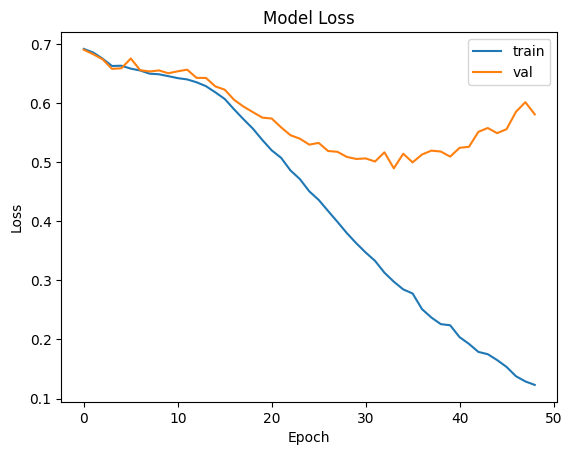

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

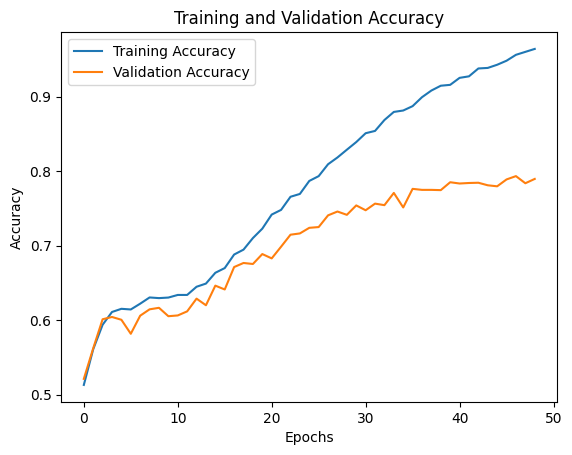

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_2 (Embedding)         │ (None, 53, 100)        │     1,079,100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 53, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_2          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,359,473 (5.19 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,079,100 (4.12 MB)

 Optimizer params: 186,916 (730.14 KB)

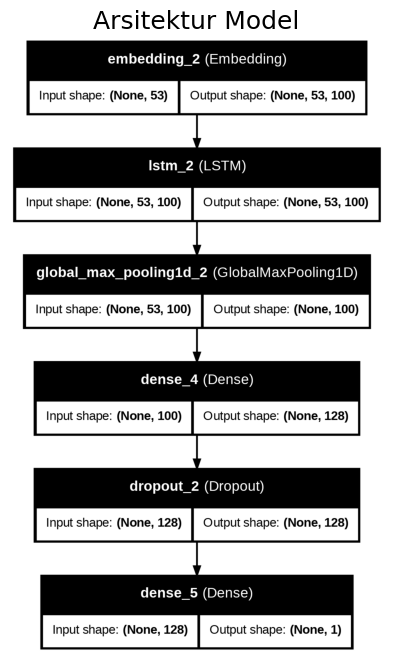

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



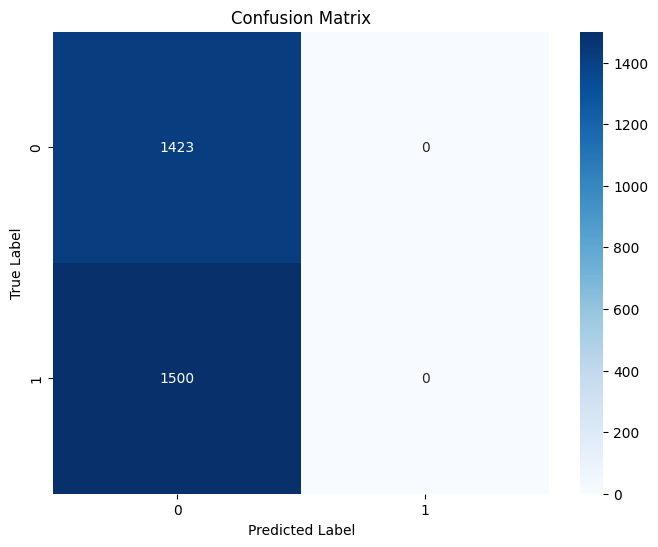

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


# [3.USAirPrePro2 Sütununa Göre](#b1)


* ## [Kütüphanelerin Yüklenmesi ve Veri Seti İşlemleri](#b1)

###### [1.Kütüphaneler yüklenmesi](#b1)

In [ ]:
# Gerekli kütüphaneleri belirtilen versiyonlarda kur
!pip install --upgrade --no-cache-dir numpy==1.26.4 scipy==1.13.1 gensim==4.3.3 pandas==2.2.2 tensorflow==2.18.0 tensorflow-text==2.18.1 tf-keras==2.18.0 tensorflow-decision-forests==1.11.0


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt_tab')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
# Gerekli kütüphaneler
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer

#from keras.preprocessing.text import Tokenizer
from keras.layers import Dense, Dropout, Embedding, LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential


In [ ]:
"""from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping"""


'from tensorflow.keras.preprocessing.text import Tokenizer\nfrom tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM\nfrom tensorflow.keras.callbacks import EarlyStopping'

In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


######[Dosyanın Yüklenmesi ve veri setinin incelenmesi](#b1)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BitirmeMuammer/USAir/
#df=pd.read_csv("Loan.csv",index_col=0)

Mounted at /content/drive
/content/drive/My Drive/BitirmeMuammer/USAir


In [ ]:
# Veri setini yükle
file_path = '/content/drive/My Drive/Bert/USAir_df.csv'
file_path2 = '/content/drive/My Drive/Bert/USAir_balanced_df.csv'
file_path3 = '/content/drive/My Drive/Bitirme/Datasets/twitter_racism_parsed_dataset.csv'
file_path4 = '/content/drive/My Drive/Bitirme/Datasets/PreprocessedSon3_2output_df.csv'
file_path5 = '/content/drive/My Drive/BitirmeMuammer/USAir/USAir_PreprocessedSon_df.csv'

df = pd.read_csv(file_path5, encoding='latin1', header=None)
#df = pd.read_csv(file_path5, index_col=0)

# Sütun isimlerini belirle--USAir
df.columns =['Text','score', 'hibrit', 'USAirPrePro', 'USAirPrePro2', 'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro', 'text_length', 'sentiment']

# Sütun isimlerini belirle
#df.columns = ['index', 'id','Text','label','score']
# Sütun isimlerini belirle--Finance
"""#df.columns=['Text','tokens', 'text_length', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'MuammerNLPPrePRro', 'MuammerNLPPrePRro2', 'MuammerNLPLSTMPrePRro',
       'score', 'oh_label']"""

# İlk sütunu kontrol edelim
print("Sütun isimleri:", df.columns)

Sütun isimleri: Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment'],
      dtype='object')


###### [Veri setinin incelenmesi](#b1)

In [ ]:
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
0,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
1,@VirginAmerica What @dhepburn said.,1,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,VirginAmerica What dhepburn said,@VirginAmerica What @dhepburn said.,VirginAmerica What dhepburn said,virginamerica dhepburn said,35,1
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
3,@VirginAmerica I didn't today... Must mean I need to take another trip!,1,virginamerica today must mean need take another trip,virginamerica didnt today must mean need take anoth trip,virginamerica today must mean need take another trip,virginamerica today must mean need take anoth trip,virginamerica today must mean need take anoth trip,VirginAmerica didn today Must mean need to take another trip,@VirginAmerica I didn't today... Must mean I need to take another trip!,VirginAmerica didn today Must mean need to take another trip,virginamerica n't today must mean need take anoth trip,71,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0


In [ ]:
df=df.drop(df.index[0])

In [ ]:
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
1,@VirginAmerica What @dhepburn said.,1,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,virginamerica dhepburn said,VirginAmerica What dhepburn said,@VirginAmerica What @dhepburn said.,VirginAmerica What dhepburn said,virginamerica dhepburn said,35,1
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
3,@VirginAmerica I didn't today... Must mean I need to take another trip!,1,virginamerica today must mean need take another trip,virginamerica didnt today must mean need take anoth trip,virginamerica today must mean need take another trip,virginamerica today must mean need take anoth trip,virginamerica today must mean need take anoth trip,VirginAmerica didn today Must mean need to take another trip,@VirginAmerica I didn't today... Must mean I need to take another trip!,VirginAmerica didn today Must mean need to take another trip,virginamerica n't today must mean need take anoth trip,71,1
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
5,@VirginAmerica and it's a really big bad thing about it,0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0


In [ ]:
df.shape

(14640, 13)

###### [Nötr sınıfı çıkarma](#p2)

In [ ]:
df["score"].value_counts()

,count
score,
0,9178
1,3099
2,2363
score,1


In [ ]:
"""print(df.shape)
df = df[df['airline_sentiment'] != 'neutral']
print(df.shape)
df.head(5)"""

"print(df.shape)\ndf = df[df['airline_sentiment'] != 'neutral']\nprint(df.shape)\ndf.head(5)"

In [ ]:
#nötr sınıf 1
print(df.shape)
df = df[df['score'] != '1']
print(df.shape)
df.head(5)

(14641, 13)
(11542, 13)


,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
0,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
2,@VirginAmerica plus you've added commercials to the experience... tacky.,2,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
5,@VirginAmerica and it's a really big bad thing about it,0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0


In [ ]:
df=df.reset_index(drop=True)

In [ ]:
df['score'] = pd.to_numeric(df['score'], errors='coerce')


In [ ]:
#df['score'] =df['score'].astype(int)

In [ ]:
#Burda -1 olanlar 0 yapıldı 1 olanlar kaldı
df['score'] = df['score'].apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
#Burda 0 olanlar 0 yapıldı 2 olanlar 1 yapıldı pozitif:1 negative:0
df['score'] = df['score'].apply(lambda x: x -1  if x == 2 else x)

In [ ]:
df["score"].value_counts()

,count
score,
0.0,9178
1.0,2363


In [ ]:
df['score']

,score
0,1.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
11536,0.0
11537,0.0
11538,1.0
11539,0.0


In [ ]:
#df = df.drop(df.index[0])
df.head()

,Text,score,hibrit,USAirPrePro,USAirPrePro2,USAirPrePro3,USAirPrePro4,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPPrePRro3,MuammerNLPLSTMPrePRro,text_length,sentiment
0,@VirginAmerica plus you've added commercials to the experience... tacky.,1.0,virginamerica plus added commercials experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plus added commercial experience tacky,virginamerica plu youv ad commerci experi tacki,virginamerica plu ad commerci experi tacki,VirginAmerica plus you ve added commercials to the experience tacky,@VirginAmerica plus you've added commercials to the experience... tacky.,VirginAmerica plus you ve added commercials to the experience tacky,virginamerica plu 've ad commerci experi tacki,72,2
1,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",0.0,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,virginamerica realli aggress blast obnoxi entertain guest face amp littl recours,virginamerica realli aggress blast obnoxi entertain guest face littl recours,VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse",VirginAmerica it really aggressive to blast obnoxious entertainment in your guests faces amp they have little recourse,virginamerica 's realli aggress blast obnoxi entertain guest ' face amp littl recours,126,0
2,@VirginAmerica and it's a really big bad thing about it,0.0,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica really big bad thing,virginamerica realli big bad thing,virginamerica realli big bad thing,VirginAmerica and it a really big bad thing about it,@VirginAmerica and it's a really big bad thing about it,VirginAmerica and it a really big bad thing about it,virginamerica 's realli big bad thing,55,0
3,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,0.0,virginamerica seriously would pay flight seats playing really bad thing flying va,virginamerica serious would pay flight seat didnt play realli bad thing fli va,virginamerica seriously would pay flight seat playing really bad thing flying va,virginamerica serious would pay flight seat play realli bad thing fli va,virginamerica serious would pay flight seat play realli bad thing fli va,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA,VirginAmerica seriously would pay flight for seats that didn have this playing it really the only bad thing about flying VA,virginamerica serious would pay flight seat n't play 's realli bad thing fli va,135,0
4,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",1.0,virginamerica yes nearly every time fly vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,virginamerica yes nearly every time fly vx ear worm wont go away,virginamerica ye nearli everi time fli vx ear worm go away,virginamerica ye nearli everi time fli vx ear worm wont go away,VirginAmerica yes nearly every time fly VX this ear worm won go away,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)",VirginAmerica yes nearly every time fly VX this ear worm won go away,"virginamerica ye , nearli everi time fli vx ear worm go away",85,2


In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment'],
      dtype='object')

In [ ]:
df.shape

(11541, 13)

In [ ]:
print(len(df))

11541


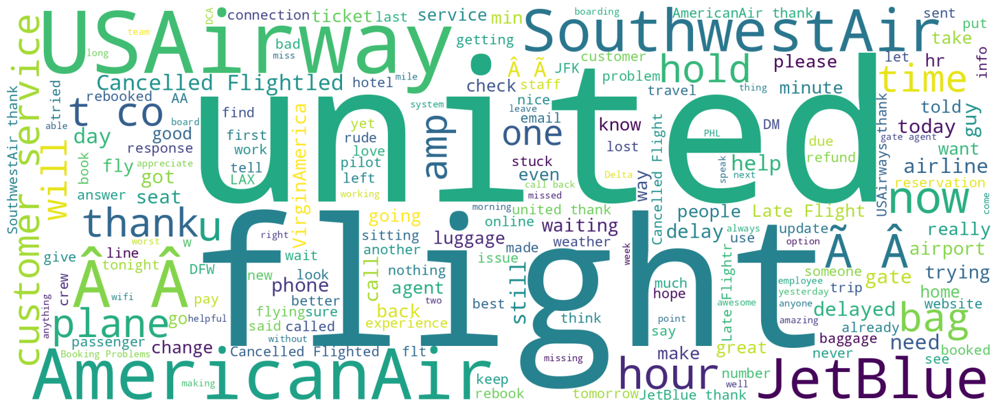

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [Veri setinden kullanılacak sütun seçilmesi](#b1)

In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment'],
      dtype='object')

In [ ]:
#Kullanıacak kolon adi girin sonra çalıştırın. Yukarıdaki kolon isimlerinden seç
secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score'
#secilen_sentiment_kolon_adi='score2'
#secilen_kolon_adi='hibrit'
#secilen_kolon_adi='Text'

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=df[[secilen_kolon_adi,secilen_sentiment_kolon_adi]]
data=data.reset_index(drop=True)
data

,USAirPrePro2,score
0,virginamerica plus added commercial experience tacky,1.0
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,0.0
2,virginamerica really big bad thing,0.0
3,virginamerica seriously would pay flight seat playing really bad thing flying va,0.0
4,virginamerica yes nearly every time fly vx ear worm wont go away,1.0
...,...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0.0
11537,americanair right cue delay,0.0
11538,americanair thank got different flight chicago,1.0
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc,0.0


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)
#data=data.reset_index(drop=True)

In [ ]:
data

,USAirPrePro2,score
0,virginamerica plus added commercial experience tacky,1.0
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,0.0
2,virginamerica really big bad thing,0.0
3,virginamerica seriously would pay flight seat playing really bad thing flying va,0.0
4,virginamerica yes nearly every time fly vx ear worm wont go away,1.0
...,...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0.0
11537,americanair right cue delay,0.0
11538,americanair thank got different flight chicago,1.0
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc,0.0


In [ ]:
data.head()

,USAirPrePro2,score
0,virginamerica plus added commercial experience tacky,1.0
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,0.0
2,virginamerica really big bad thing,0.0
3,virginamerica seriously would pay flight seat playing really bad thing flying va,0.0
4,virginamerica yes nearly every time fly vx ear worm wont go away,1.0


In [ ]:
X_df.head()

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away


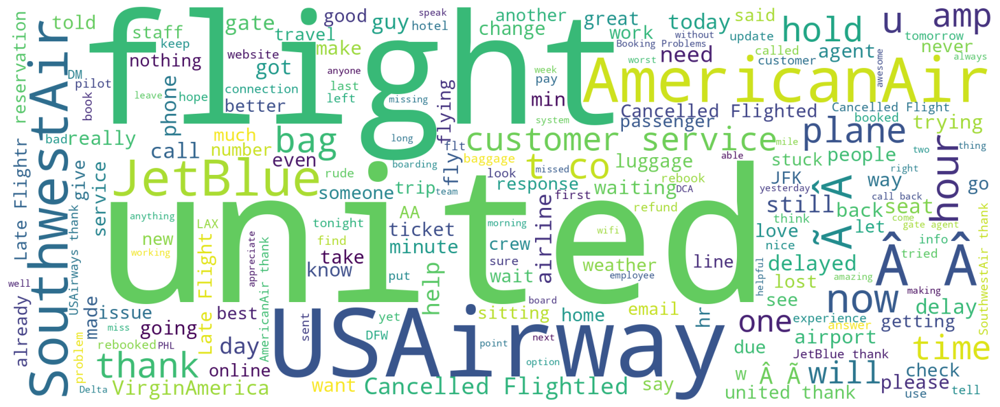

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df['Text'])
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

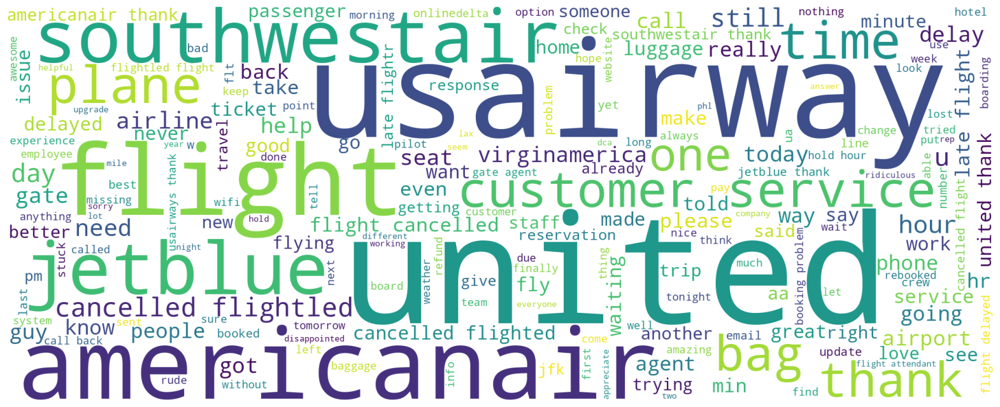

In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in x_liste)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

###### [x ve y değerlerinin belirlenmesi ve train tesst ayrımı](#b1)

In [ ]:
"""secilen_kolon_adi='USAirPrePro2'
secilen_sentiment_kolon_adi='score2'"""

In [ ]:
x = df[secilen_kolon_adi]
x

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away
...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
11537,americanair right cue delay
11538,americanair thank got different flight chicago
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc


In [ ]:
df['score2'] = df['score'].apply(lambda x: x - 1 if x == 2 else x)

In [ ]:
y = df[secilen_sentiment_kolon_adi]
y

,score
0,1.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
11536,0.0
11537,0.0
11538,1.0
11539,0.0


In [ ]:
y = y.apply(lambda x: x - 1 if x == 2 else x)
y

,score
0,1.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
11536,0.0
11537,0.0
11538,1.0
11539,0.0


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
 y_liste= y_liste.apply(lambda x: x - 1 if x == 2 else x)
 y_liste= y_liste.apply(lambda x: x + 1 if x == -1 else x)


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
y_liste

,score
0,1.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
11536,0.0
11537,0.0
11538,1.0
11539,0.0


####  [keşifsel veri analizi için deneme](#b1)


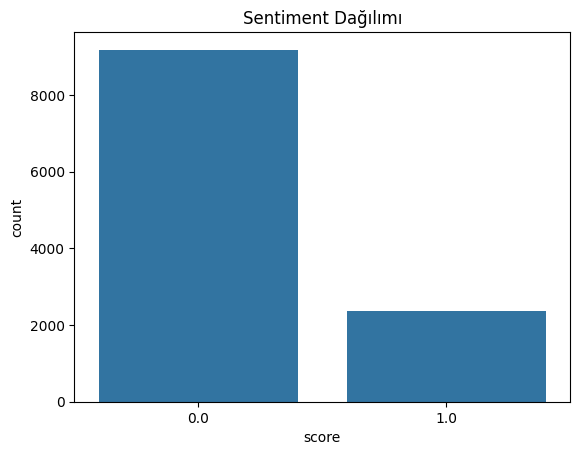

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.countplot(x='score', data=df)
plt.title("Sentiment Dağılımı")
plt.show()

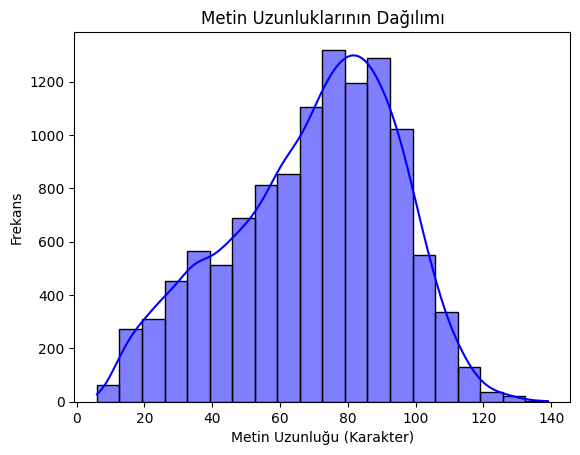

In [ ]:
df['text_length'] = df[secilen_kolon_adi].apply(len)
sns.histplot(df['text_length'], bins=20, kde=True, color='blue')
plt.title("Metin Uzunluklarının Dağılımı")
plt.xlabel("Metin Uzunluğu (Karakter)")
plt.ylabel("Frekans")
plt.show()

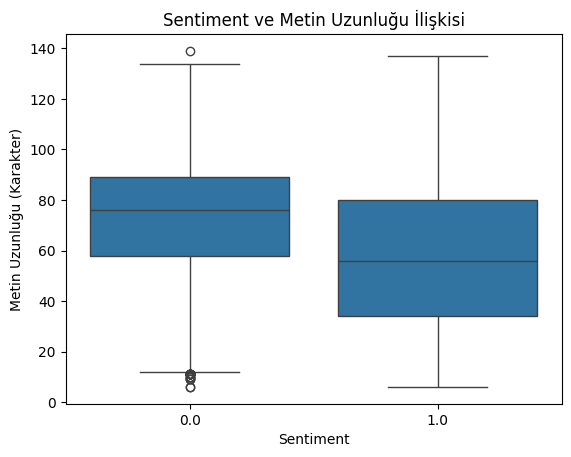

In [ ]:
# Sentiment bazında metin uzunluklarının dağılımı
sns.boxplot(x='score', y='text_length', data=df)
plt.title("Sentiment ve Metin Uzunluğu İlişkisi")
plt.xlabel("Sentiment")
plt.ylabel("Metin Uzunluğu (Karakter)")
plt.show()

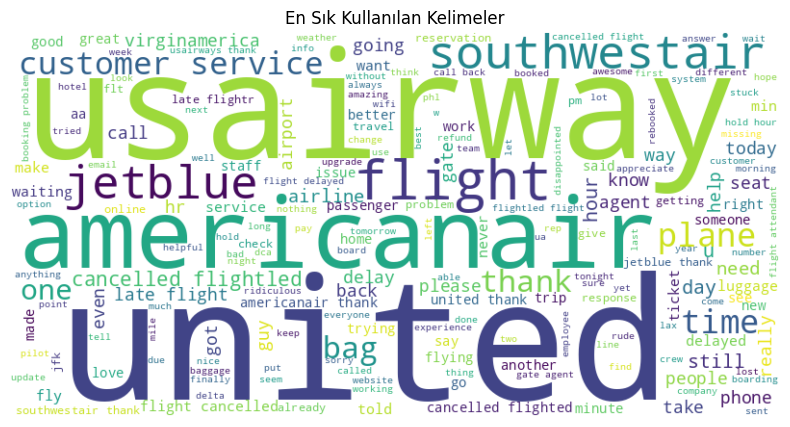

In [ ]:
from collections import Counter
from wordcloud import WordCloud

# Tüm metinleri birleştirerek kelimeleri say
all_words = " ".join(df[secilen_kolon_adi]).lower().split()
word_counts = Counter(all_words)

# En sık kullanılan kelimeleri görselleştirme
wordcloud = WordCloud(width=800, height=400, background_color="white").generate(" ".join(all_words))
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("En Sık Kullanılan Kelimeler")
plt.show()

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df['score'] == '1']['Text']).lower()
negative_text = " ".join(df[df['score'] == '-1']['Text']).lower()
neutral_text = " ".join(df[df['score'] == '0']['Text']).lower()

In [ ]:
df['score'] = df['score'].astype(int)

In [ ]:
# Pozitif, negatif ve nötr metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == -1][secilen_kolon_adi]).lower()
neutral_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()

In [ ]:
# Pozitif, negatif metinleri ayırma
positive_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 1][secilen_kolon_adi]).lower()
negative_text = " ".join(df[df[secilen_sentiment_kolon_adi] == 0][secilen_kolon_adi]).lower()


In [ ]:
positive_text

'virginamerica plus added commercial experience tacky virginamerica yes nearly every time fly vx ear worm wont go away virginamerica well notbut virginamerica amazing arrived hour early good virginamerica pretty graphic much better minimal iconography virginamerica great deal already thinking nd trip australia even gone st trip yet p virginamerica virginmedia flying fabulous seductive sky take stress away travel virginamerica thanks virginamerica excited first cross country flight lax mco heard nothing great thing virgin america daystogo flying virginamerica virginamerica know would amazingly awesome bosfll please want fly virginamerica love graphic virginamerica love hipster innovation feel good brand virginamerica great news america could start flight hawaii end year via pacificbiznews virginamerica moodlighting way fly best experience ever cool calming moodlitmonday virginamerica freddieawards done done best airline around hand virginamerica view downtown los angeles hollywood sign 

NameError: name 'neutral_text' is not defined

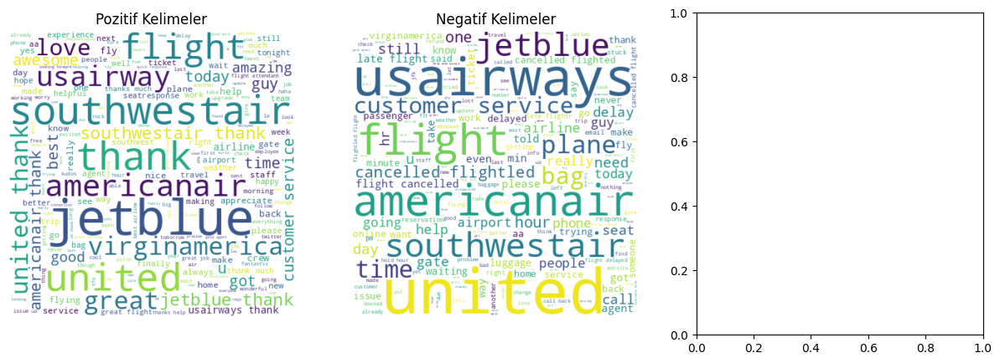

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Pozitif kelimeler
if positive_text.strip():
    axes[0].imshow(WordCloud(width=400, height=400, background_color="white").generate(positive_text), interpolation="bilinear")
    axes[0].set_title("Pozitif Kelimeler")
else:
    axes[0].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[0].axis("off")

# Negatif kelimeler
if negative_text.strip():
    axes[1].imshow(WordCloud(width=400, height=400, background_color="white").generate(negative_text), interpolation="bilinear")
    axes[1].set_title("Negatif Kelimeler")
else:
    axes[1].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[1].axis("off")

# Nötr kelimeler (örnek)
if neutral_text.strip():
    axes[2].imshow(WordCloud(width=400, height=400, background_color="white").generate(neutral_text), interpolation="bilinear")
    axes[2].set_title("Nötr Kelimeler")
else:
    axes[2].text(0.5, 0.5, 'Veri yok', horizontalalignment='center', verticalalignment='center', fontsize=16)
axes[2].axis("off")

plt.tight_layout()
plt.show()


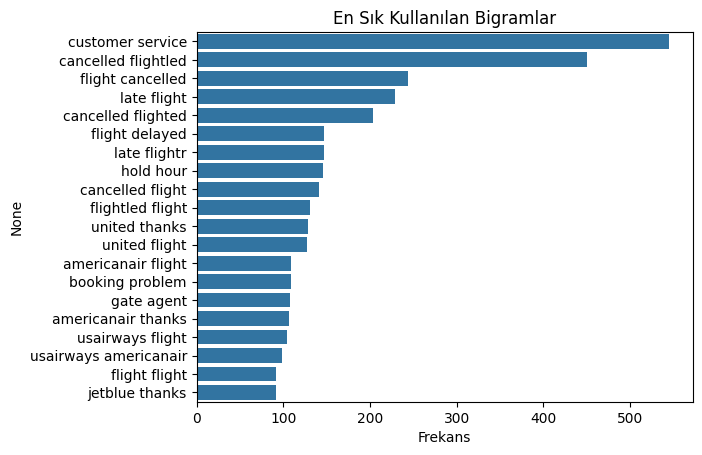

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

# Bigram oluşturma
vectorizer = CountVectorizer(ngram_range=(2, 2), max_features=20, stop_words='english')
bigrams = vectorizer.fit_transform(df[secilen_kolon_adi])
bigram_df = pd.DataFrame(bigrams.toarray(), columns=vectorizer.get_feature_names_out())

# En sık kullanılan bigramları görselleştirme
bigram_counts = bigram_df.sum().sort_values(ascending=False)
sns.barplot(x=bigram_counts.values, y=bigram_counts.index)
plt.title("En Sık Kullanılan Bigramlar")
plt.xlabel("Frekans")
plt.show()

* ## [TF_IDF](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [KNN](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmişse](#b2)

######Kütüphanelerin Yüklenmesi

In [ ]:
pip install keras

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
from tensorflow.keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.losses import categorical_crossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential


###### [Dosyanın yüklenmesi](#p2)

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/
"""da db .csv nini yüklü olduğu klasör"""


Mounted at /content/drive
/content/drive/My Drive/Bil482


'da db .csv nini yüklü olduğu klasör'

In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri setinin incelenmesi](#p2)

In [ ]:
df.isnull().values.any()

df.head(10)

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0
6,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","[""['sir', 'infra', 'move', 'sideways', 'washwoman', 'inaugural', 'marker', 'strategist']""]",64,srei infra moving sideways ashwani gujral market strategist,srei infra move sideway ashwani gujral market strategist,srei infra moving sideways ashwani gujral market strategist,SREI Infra is moving sideways Ashwani Gujral Market Strategist,"SREI Infra is moving sideways: Ashwani Gujral, Market Strategist","srei infra move sideway ashwani gujral , market strategist",-1,0,0
7,Sweet sugar turns bitter for mill owners in 2014,"[""['sweet', 'sugar', 'turn', 'bitter', 'mill', 'owner', '2014']""]",48,sweet sugar turns bitter mill owners,sweet sugar turn bitter mill owner,sweet sugar turn bitter mill owner,Sweet sugar turns bitter for mill owners in,Sweet sugar turns bitter for mill owners in 2014,sweet sugar turn bitter mill owner,-1,0,0
8,Foreign investors navigate turmoil in Chinese markets with new playbook,"[""['fo reign', 'investor', 'navigable', 'turmoil', 'Chinese', 'market', 'no', 'playbook']""]",71,foreign investors navigate turmoil chinese markets new playbook,foreign investor navig turmoil chines market new playbook,foreign investor navigate turmoil chinese market new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,Foreign investors navigate turmoil in Chinese markets with new playbook,foreign investor navig turmoil chines market new playbook,-1,0,0
9,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,nif may turn co plaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,nif may turn coplaintiff modern india suit nsel,NIF may turn co plaintiff in Modern India suit against NSEL,NIF may turn co-plaintiff in Modern India suit against NSEL,nif may turn coplaintiff modern india suit nsel,-1,0,0
10,NIF may turn co-plaintiff in Modern India suit against NSEL,"[""['nigh', 'be', 'ten', 'co plaintiff', 'modern', 'India', 'soot', 'noel']""]",59,ni

<Axes: xlabel='score', ylabel='count'>

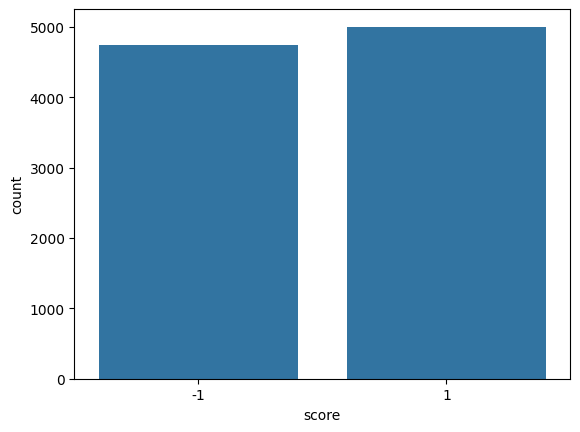

In [ ]:
import seaborn as sns
sns.countplot(x='score', data=df)

In [ ]:
df.shape

(9741, 12)

In [ ]:
print(len(df))

9741


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
df.columns

Index(['Text', 'score', 'hibrit', 'USAirPrePro', 'USAirPrePro2',
       'USAirPrePro3', 'USAirPrePro4', 'MuammerNLPPrePRro',
       'MuammerNLPPrePRro2', 'MuammerNLPPrePRro3', 'MuammerNLPLSTMPrePRro',
       'text_length', 'sentiment', 'score2'],
      dtype='object')

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
 y_liste= y_liste.apply(lambda x: x - 1 if x == 2 else x)
 y_liste= y_liste.apply(lambda x: x + 1 if x == -1 else x)

In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
2,virginamerica plus added commercials experience tacky,1
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,0
5,virginamerica really big bad thing,0
6,virginamerica seriously would pay flight seats playing really bad thing flying va,0
7,virginamerica yes nearly every time fly vx ear worm go away,1
...,...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0
14635,americanair right cue delays,0
14636,americanair thank got different flight chicago,1
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc,0


###### [Veri Ön işleme ](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
y = df['score2']

In [ ]:
y.shape

(9741,)

In [ ]:
y_liste

,score2
1,0
2,0
3,0
4,0
5,0
...,...
9737,1
9738,1
9739,1
9740,1


In [ ]:
x

,Text
2,@VirginAmerica plus you've added commercials to the experience... tacky.
4,"@VirginAmerica it's really aggressive to blast obnoxious ""entertainment"" in your guests' faces &amp; they have little recourse"
5,@VirginAmerica and it's a really big bad thing about it
6,@VirginAmerica seriously would pay $30 a flight for seats that didn't have this playing.\nit's really the only bad thing about flying VA
7,"@VirginAmerica yes, nearly every time I fly VX this Ã¢ÂÂear wormÃ¢ÂÂ wonÃ¢ÂÂt go away :)"
...,...
14634,"@AmericanAir my flight was Cancelled Flightled, leaving tomorrow morning. Auto rebooked for a Tuesday night flight but need to arrive Monday."
14635,@AmericanAir right on cue with the delaysÃ°ÂÂÂ
14636,@AmericanAir thank you we got on a different flight to Chicago.
14637,@AmericanAir leaving over 20 minutes Late Flight. No warnings or communication until we were 15 minutes Late Flight. That's called shitty customer svc


In [ ]:
X #Büyük X

['At Wipro growth remains mirage',
 'Why Chinese stocks leave US investors vulnerable',
 'US stocks finish mixed amid more tech selling',
 'Opec reduces estimate on oil demand growth',
 'Immediate support for rupee is placed at Bonanza',
 'SREI Infra is moving sideways Ashwani Gujral Market Strategist',
 'Sweet sugar turns bitter for mill owners in ',
 'Foreign investors navigate turmoil in Chinese markets with new playbook',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'NIF may turn co plaintiff in Modern India suit against NSEL',
 'Stock Buzz Sun Pharma may face resistance at current levels',
 'Investors should be wary of cyclicals even if Narendra Modi wins',
 'Markets will move sideways before next upside starts Ashwani Gujral',
 'Stock markets to see cautious trading amid elections IIP data Report',
 'Be cautious on amount of stock you buy into BEML Devang Visaria',
 'Immediate resistance for Reliance is around levels Mileen Vasudeo Angel Broking',
 ' Sahara in

###### %30-70

In [ ]:
  #X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
  X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
x_liste

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away
...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
11537,americanair right cue delay
11538,americanair thank got different flight chicago
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc


In [ ]:
y_liste

,score
0,1.0
1,0.0
2,0.0
3,0.0
4,1.0
...,...
11536,0.0
11537,0.0
11538,1.0
11539,0.0


---
<a id="p1"></a>
###### TF-IDF

In [ ]:
#feature extraction with Tf-idf vectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(max_features=10000)
train_vectors = vectorizer.fit_transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(8078, 8652) (3463, 8652)


In [ ]:
print(test_vectors)

  (0, 1122)	0.2956512097778964
  (0, 1251)	0.5829225217390113
  (0, 2888)	0.19207392256375574
  (0, 2912)	0.3545495179776315
  (0, 7959)	0.6057224161162913
  (0, 8116)	0.2080728189681252
  (1, 2888)	0.18370963524190967
  (1, 3329)	0.7435009890042171
  (1, 4065)	0.24134173852809165
  (1, 8203)	0.5959959853164061
  (2, 95)	0.30874138319712685
  (2, 159)	0.22297132012461685
  (2, 600)	0.32507679343111273
  (2, 893)	0.29409728342511116
  (2, 2888)	0.1166134133442403
  (2, 3190)	0.21431125225485195
  (2, 4418)	0.26072021510799165
  (2, 4859)	0.277076633911027
  (2, 5933)	0.24745463800970213
  (2, 6220)	0.3392643541601131
  (2, 6536)	0.2792663806468177
  (2, 7172)	0.3710361566130812
  (2, 8010)	0.11693515376938247
  (2, 8259)	0.22990095993845938
  (3, 0)	0.236343312225005
  :	:
  (3459, 8010)	0.14658729938325488
  (3460, 1055)	0.2898292786417996
  (3460, 3273)	0.4655355225109413
  (3460, 4438)	0.316905701945794
  (3460, 5556)	0.2594323799058463
  (3460, 5722)	0.1993117100878429
  (3460, 5754


<a id="nb"></a>
###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted_NB = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted_NB)*100)


Naive Bayes Accuracy Score ->  84.26220040427374


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted_NB))

              precision    recall  f1-score   support

         0.0       0.84      1.00      0.91      2771
         1.0       0.99      0.22      0.35       692

    accuracy                           0.84      3463
   macro avg       0.91      0.61      0.63      3463
weighted avg       0.87      0.84      0.80      3463



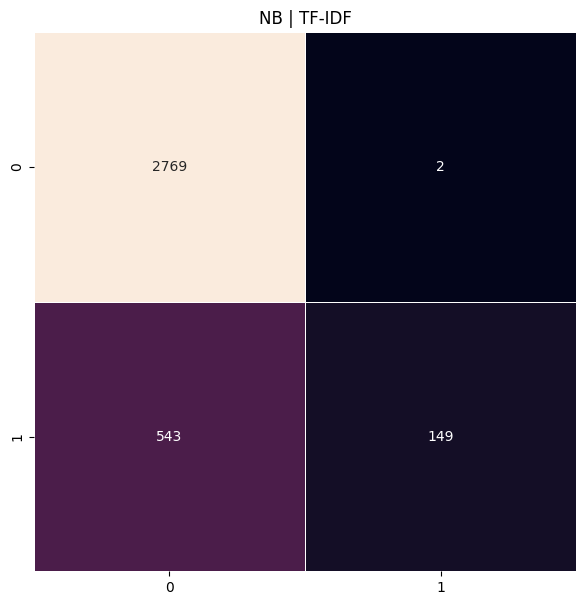

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted_NB)
plt.figure(figsize=(7,7))
plt.title("NB | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

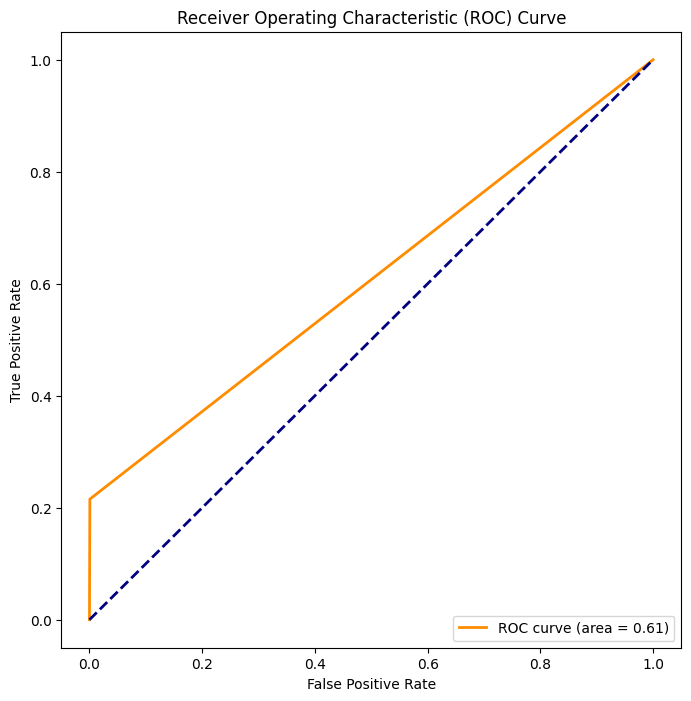

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predicted_NB= predicted_NB.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predicted_NB)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="svm"></a>
###### SVM  

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000 #maximum number of iterations
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations) #create support vector machine model

SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  92.17441524689576


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2771
           1       0.87      0.72      0.79       692

    accuracy                           0.92      3463
   macro avg       0.90      0.85      0.87      3463
weighted avg       0.92      0.92      0.92      3463



In [ ]:
X_test

,USAirPrePro2
9193,usairways charged flight cancelled flightled unbelievable unheard
6112,jetblue great flight great view
967,united actually gate agent rude standing line waiting reflight booking problem missed flight sti awful
11279,americanair worry called back hr late flightr asleep took additional fee aa standard everythings gr
3061,united thank one month ago none weird club one busiest airport u
...,...
266,virginamerica good home texas moodlighting
1108,united problem flight ua called rebooked found hotel taxi
8847,usairways would pleased reassess business practice goal passenger plane little possible
10451,americanair andyellwood delk lol sure would wake response halfthought auto tweet hope made


In [ ]:
y_test.head(500)

,score
9193,0
6112,1
967,0
11279,0
3061,1
...,...
4210,0
4093,0
9045,0
2629,1


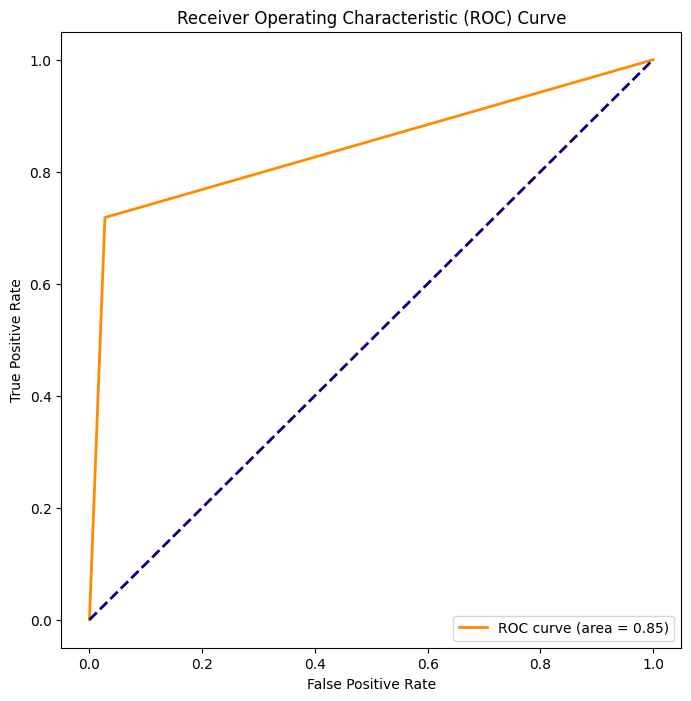

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_SVM= predictions_SVM.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_SVM)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


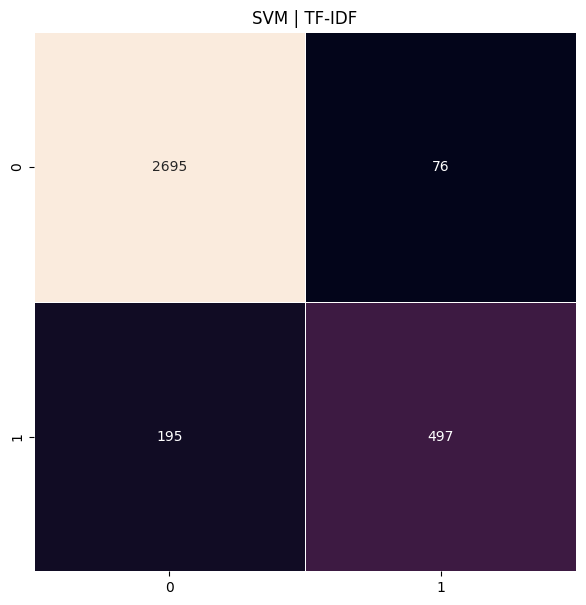

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


<a id="log"></a>
###### Log Reg

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  90.84608720762346


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      2771
           1       0.91      0.60      0.72       692

    accuracy                           0.91      3463
   macro avg       0.91      0.79      0.83      3463
weighted avg       0.91      0.91      0.90      3463



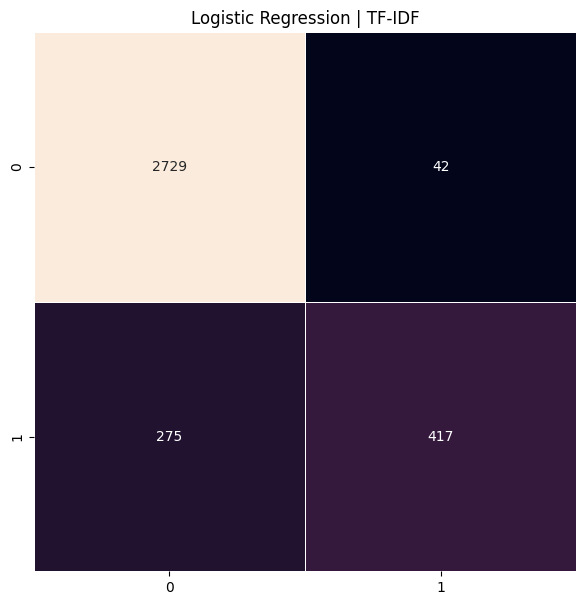

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
y_test

,score
9193,0
6112,1
967,0
11279,0
3061,1
...,...
266,1
1108,0
8847,0
10451,0


In [ ]:
predictions_log

array([0., 1., 0., ..., 0., 0., 0.])

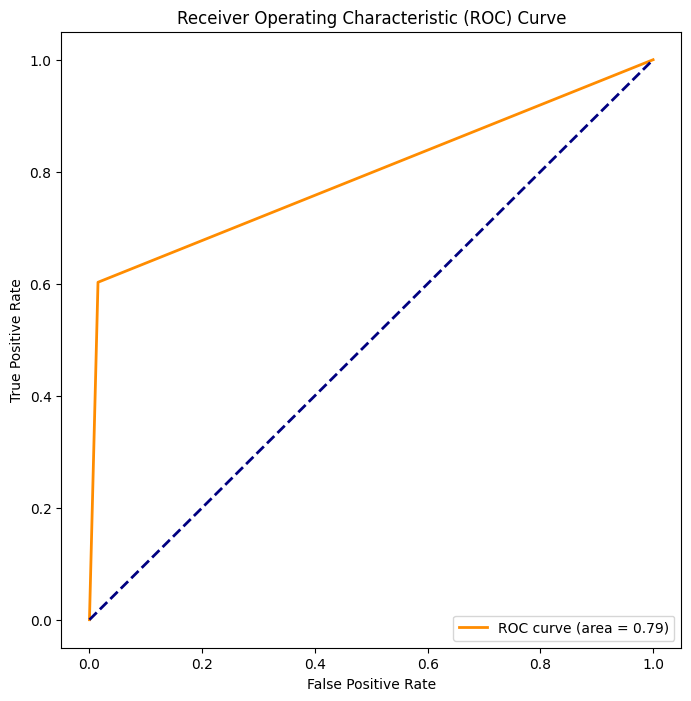

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

predictions_log= predictions_log.astype(int)
y_test = y_test.astype(int)
# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_log)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


<a id="knn"></a>
###### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
number_of_neigbors = 5
minkowski_power = 2 # Manhattan Distance = 1, Euclidean Distance = 2
knn = KNeighborsClassifier(n_neighbors=number_of_neigbors, p =minkowski_power)
model_knn=knn.fit(train_vectors, y_train)
predictions_knn = model_knn.predict(test_vectors)
predictions_knn= predictions_knn.astype(int)
y_test = y_test.astype(int)
# Use accuracy_score function to get the accuracy
print("KNN Accuracy Score -> ",accuracy_score(predictions_knn, y_test)*100)





KNN Accuracy Score ->  88.39156800462027


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_knn))

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      2771
           1       0.71      0.71      0.71       692

    accuracy                           0.88      3463
   macro avg       0.82      0.82      0.82      3463
weighted avg       0.88      0.88      0.88      3463



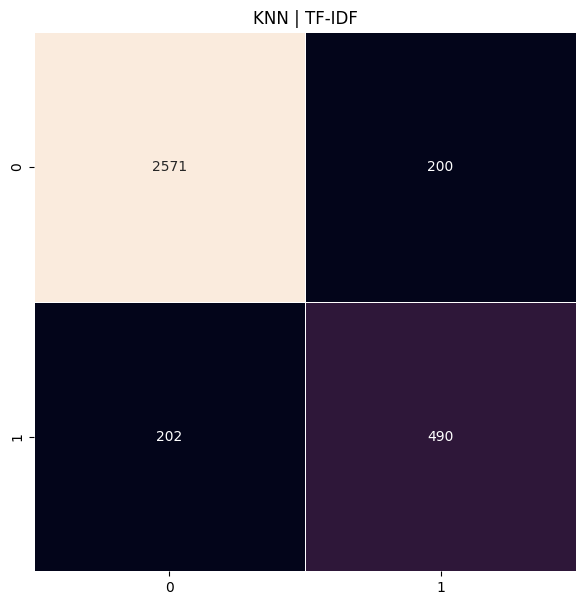

In [ ]:

from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_knn)
plt.figure(figsize=(7,7))
plt.title("KNN | TF-IDF")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

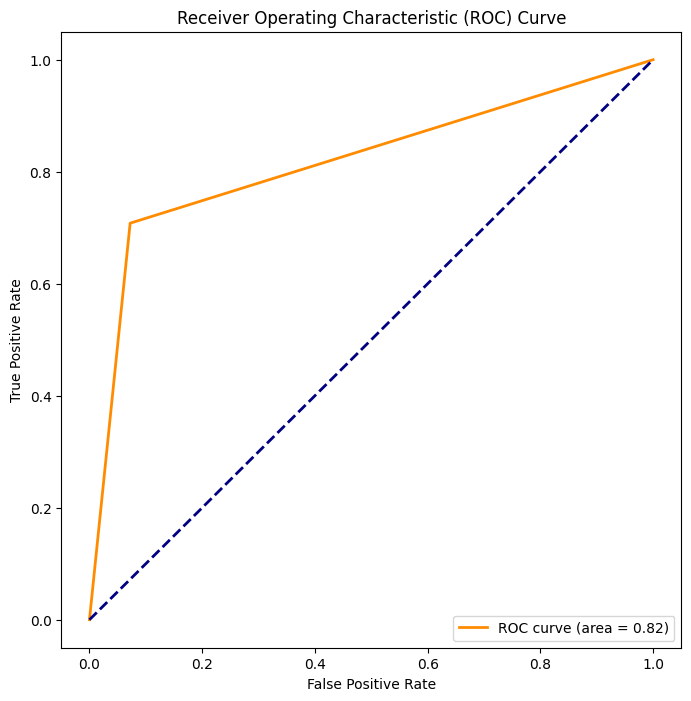

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Assuming you have already imported necessary libraries and have y_test, predicted

# Compute ROC curve and ROC area for each class
fpr, tpr, _ = roc_curve(y_test, predictions_knn)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 8))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {:.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()


###### Decision tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Decision Tree sınıflandırıcısını tanımla
tree_clf = DecisionTreeClassifier()

# Modeli eğit
tree_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_tree = tree_clf.predict(test_vectors)

predictions_tree= predictions_tree.astype(int)
y_test = y_test.astype(int)
# Doğruluk skorunu hesapla ve yazdır
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)


Decision Tree Accuracy Score ->  85.61940514005198


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_tree))


              precision    recall  f1-score   support

           0       0.91      0.91      0.91      2771
           1       0.64      0.64      0.64       692

    accuracy                           0.86      3463
   macro avg       0.78      0.77      0.77      3463
weighted avg       0.86      0.86      0.86      3463



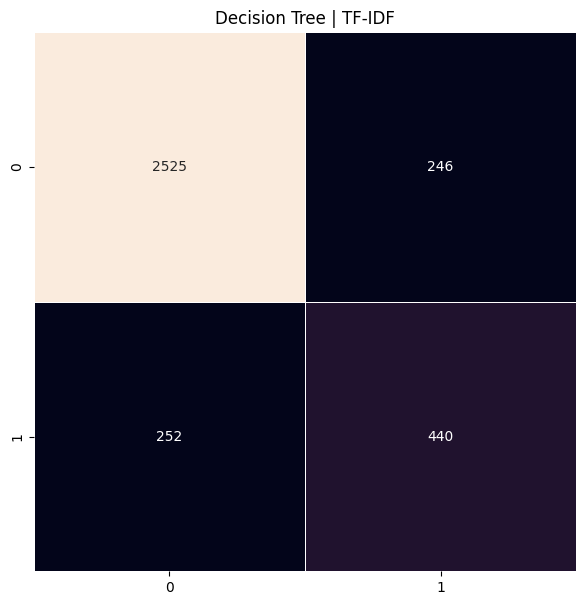

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | TF-IDF")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


######Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)
predictions_rf = predictions_rf.astype(int)
y_test = y_test.astype(int)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  90.41293676003465


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))


              precision    recall  f1-score   support

           0       0.91      0.98      0.94      2771
           1       0.87      0.61      0.72       692

    accuracy                           0.90      3463
   macro avg       0.89      0.79      0.83      3463
weighted avg       0.90      0.90      0.90      3463



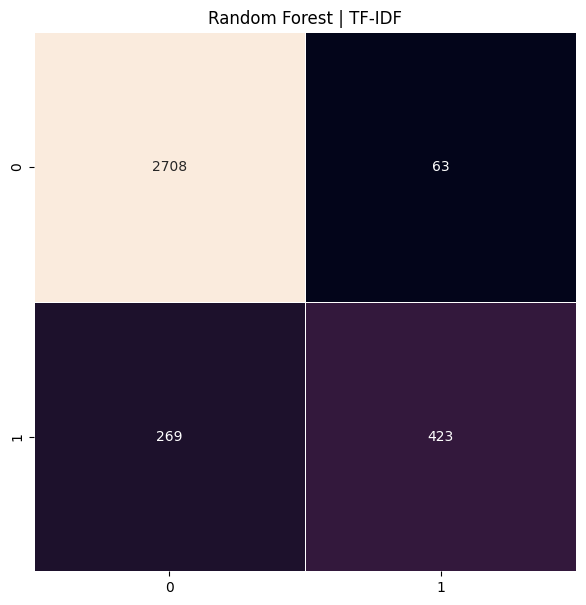

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | TF-IDF")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [BOW](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)
    * #### [Decission Tree](#log)
    * #### [Random Forest](#log)
    
    

#####[Dosya en başta yüklenmişse](#b2)

######[Kütüphanelerin yüklenmesi ve test setinin oluşturulması](#b2)

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import nltk
from nltk.stem.porter import *
nltk.download('gutenberg')
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')

from nltk.tokenize import TweetTokenizer
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
import datetime

from scipy import stats
from scipy.sparse import hstack, csr_matrix
from sklearn.model_selection import train_test_split, cross_val_score

from collections import Counter
from nltk.corpus import stopwords
from nltk.util import ngrams

import string
import gensim
from gensim.models.phrases import Phraser, Phrases
from gensim.models.word2vec import Word2Vec
from sklearn.manifold import TSNE

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.multiclass import OneVsRestClassifier
pd.set_option('max_colwidth',400)
from bs4 import BeautifulSoup
import re

from tqdm import tqdm
from bokeh.io import output_notebook, output_file
from bokeh.plotting import show, figure
%matplotlib inline
from collections import defaultdict

[nltk_data] Downloading package gutenberg to /root/nltk_data...
[nltk_data]   Package gutenberg is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


In [ ]:
from nltk import pos_tag
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from collections import defaultdict
from nltk.corpus import wordnet as wn
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn import model_selection, naive_bayes, svm
from sklearn.metrics import accuracy_score
import warnings
warnings.filterwarnings("ignore")

In [ ]:
altta hata oluştu

In [ ]:
from keras.utils import to_categorical
import random
from sklearn.model_selection import train_test_split
from keras.preprocessing import sequence
from keras.preprocessing.text import Tokenizer
from keras.layers import Dense,Dropout,Embedding,LSTM
from keras.callbacks import EarlyStopping
from keras.losses import categorical_crossentropy
from keras.optimizers import Adam
from keras.models import Sequential

ModuleNotFoundError: No module named 'keras.preprocessing.text'

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.layers import Dense, Dropout, Embedding, LSTM
from tensorflow.keras.callbacks import EarlyStopping


In [ ]:
import tensorflow as tf
print(tf.__version__)


2.18.0


In [ ]:
!pip install --upgrade tensorflow keras


In [ ]:
!pip uninstall keras -y
!pip install keras tensorflow


Found existing installation: keras 3.6.0
Uninstalling keras-3.6.0:
  Successfully uninstalled keras-3.6.0
  Using cached keras-3.6.0-py3-none-any.whl.metadata (5.8 kB)
Using cached keras-3.6.0-py3-none-any.whl (1.2 MB)
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-keras 2.17.0 requires tensorflow<2.18,>=2.17, but you have tensorflow 2.18.0 which is incompatible.


In [ ]:
!pip install nltk
from nltk.tokenize import word_tokenize


###### [Dosyanın yüklenmesi](#b2)

In [ ]:
warnings.filterwarnings('ignore')
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Eski/Bil482/
df=pd.read_csv("Loan.csv",index_col=0)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/My Drive/Bil482


In [ ]:
df=pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
df.isnull().values.any()

df.head()

,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,NumberOfDependents,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,LoanApproved,RiskScore
ApplicationDate,,,,,,,,,,,,,,,,,,,,,
2018-01-01,45,39948,617,Employed,Master,22,13152,48,Married,2,...,3329.000000,0.724972,11,126928,0.199652,0.227590,419.805992,0.181077,0,49.0
2018-01-02,38,39709,628,Employed,Associate,15,26045,48,Single,1,...,3309.083333,0.935132,3,43609,0.207045,0.201077,794.054238,0.389852,0,52.0
2018-01-03,47,40724,570,Employed,Bachelor,26,17627,36,Married,2,...,3393.666667,0.872241,6,5205,0.217627,0.212548,666.406688,0.462157,0,52.0
2018-01-04,58,69084,545,Employed,High School,34,37898,96,Single,1,...,5757.000000,0.896155,5,99452,0.300398,0.300911,1047.506980,0.313098,0,54.0
2018-01-05,37,103264,594,Employed,Associate,17,9184,36,Married,1,...,8605.333333,0.941369,5,227019,0.197184,0.175990,330.179140,0.070210,1,36.0


In [ ]:
df.shape

(20000, 35)

In [ ]:
print(len(df))

20000


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

words  = " ".join(x for x in df.Text)
plt.figure(figsize=(20,10))
wordcloud = WordCloud(background_color="white", width = 2000, height = 800).generate(words)
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

AttributeError: 'DataFrame' object has no attribute 'Text'

#####[Dosya en başta yüklemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"

In [ ]:
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(11541, 1)

In [ ]:
print(len(df))

11541


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,USAirPrePro2,score
0,virginamerica plus added commercial experience tacky,1.0
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,0.0
2,virginamerica really big bad thing,0.0
3,virginamerica seriously would pay flight seat playing really bad thing flying va,0.0
4,virginamerica yes nearly every time fly vx ear worm wont go away,1.0
...,...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0.0
11537,americanair right cue delay,0.0
11538,americanair thank got different flight chicago,1.0
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc,0.0


###### [Veri ön işleme](#b2)

In [ ]:
def preprocess_text(sen):
    # Removing html tags
    sentence = remove_tags(sen)

    # Remove punctuations and numbers
    sentence = re.sub('[^a-zA-Z]', ' ', sentence)

    # Single character removal
    sentence = re.sub(r"\s+[a-zA-Z]\s+", ' ', sentence)

    # Removing multiple spaces
    sentence = re.sub(r'\s+', ' ', sentence)

    return sentence

In [ ]:
TAG_RE = re.compile(r'<[^>]+>')

def remove_tags(text):
    return TAG_RE.sub('', text)

In [ ]:
df['Comment']=df['Text'].apply(str)

In [ ]:
X = []
sentences = list(df['Comment'])
for sen in sentences:
    X.append(preprocess_text(sen))

In [ ]:
X

[' AAlwuhaib Muslim mob violence against Hindus in Bangladesh continues in Islam http co JBWJwuRc',
 ' NULL ',
 ' jncatron isra jourisra AMPalestine Islamophobia is like the idea of Naziphobia Islam is religion of hate and it must be outlawed ',
 'Finally m all caught up and that sudden death cook off looks like it gonna be intense MKR',
 ' carolinesinders herecomesfran hugs ',
 'Please PLEASE start using is your discernment blunted by steroids to mean are you on DRUGS from now on DEAD',
 ' aymannathem As soon as ISIS chased all the minorities out of Mosul the Sunni Arabs were happy to steal their property So fuck them ',
 ' Ali Gharib MaxBlumenthal Glad you like it http co ME Nrk xZ',
 ' HuffPostRelig Islam invaded and conquered of Christiandom before any Christian crusades in response The writer is liar ',
 ' semzyxx Do you approve of your pedophile prophet raping year old girl like it says in hadith ',
 ' watan geeky zekey Problem with vile Muslims is that they try to rationalize am

In [ ]:
y = df['oh_label']

KeyError: 'oh_label'

###### %30-70

In [ ]:
x

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away
...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
11537,americanair right cue delay
11538,americanair thank got different flight chicago
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc


In [ ]:
y

array([1., 0., 0., ..., 1., 0., 0.])

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x_liste, y_liste, test_size=0.30, random_state=42)

In [ ]:
from sklearn import  preprocessing

In [ ]:
encoder = preprocessing.LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.fit_transform(y_test)

###### BOW

In [ ]:
#feature extraction with Tf-idf vectorizer

#feature extraction with BOW
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(max_features=10000)
vectorizer.fit(X_train)

train_vectors = vectorizer.transform(X_train)
test_vectors = vectorizer.transform(X_test)
print(train_vectors.shape, test_vectors.shape)

(8078, 8652) (3463, 8652)


In [ ]:
y_test

array([0, 1, 0, ..., 0, 0, 0])

###### NB

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(train_vectors, y_train)

In [ ]:
#test the performance of our model on the test set to predict the sentiment labels
from  sklearn.metrics  import accuracy_score
predicted = clf.predict(test_vectors)
print("Naive Bayes Accuracy Score -> ", accuracy_score(y_test,predicted)*100)


Naive Bayes Accuracy Score ->  90.99047069015305


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predicted))

              precision    recall  f1-score   support

           0       0.91      0.98      0.95      2771
           1       0.90      0.62      0.73       692

    accuracy                           0.91      3463
   macro avg       0.90      0.80      0.84      3463
weighted avg       0.91      0.91      0.90      3463



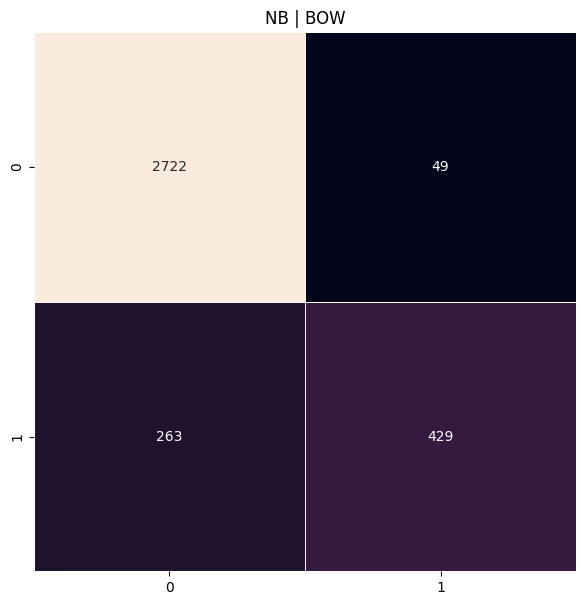

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predicted)
plt.figure(figsize=(7,7))
plt.title("NB | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### SVM

In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(train_vectors,y_train)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(test_vectors)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  91.10597747617672


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_SVM))

              precision    recall  f1-score   support

           0       0.94      0.95      0.94      2771
           1       0.79      0.76      0.77       692

    accuracy                           0.91      3463
   macro avg       0.86      0.85      0.86      3463
weighted avg       0.91      0.91      0.91      3463



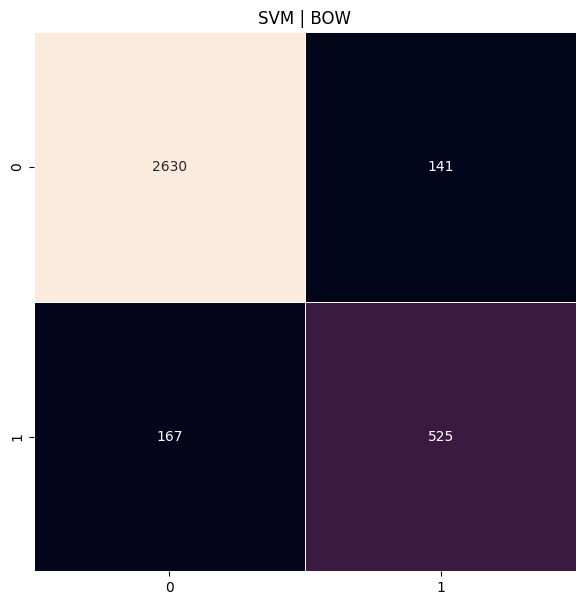

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_SVM)
plt.figure(figsize=(7,7))
plt.title("SVM | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### LOG REG

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(train_vectors,y_train)
predictions_log = log_reg.predict(test_vectors)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  91.25036095870632


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_log))

              precision    recall  f1-score   support

           0       0.93      0.96      0.95      2771
           1       0.83      0.71      0.76       692

    accuracy                           0.91      3463
   macro avg       0.88      0.84      0.85      3463
weighted avg       0.91      0.91      0.91      3463



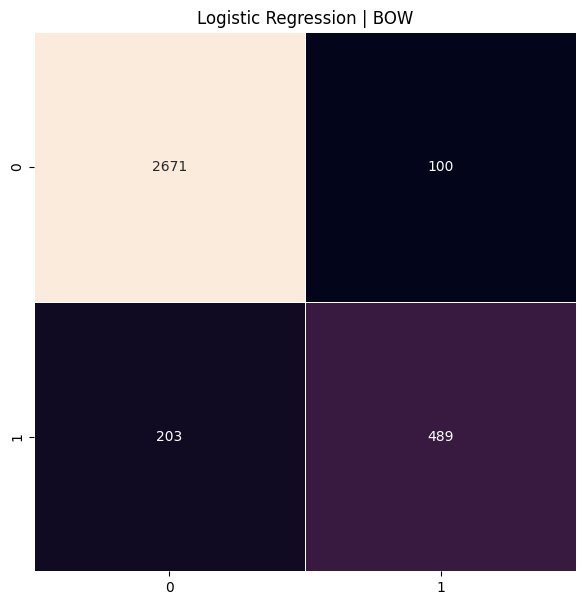

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test, predictions_log)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | BOW")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Decission Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(train_vectors, y_train)
predictions_tree = tree_clf.predict(test_vectors)
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree, y_test) * 100)

Decision Tree Accuracy Score ->  87.09211666185388


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions_tree))

              precision    recall  f1-score   support

           0       0.92      0.92      0.92      2771
           1       0.68      0.66      0.67       692

    accuracy                           0.87      3463
   macro avg       0.80      0.79      0.80      3463
weighted avg       0.87      0.87      0.87      3463



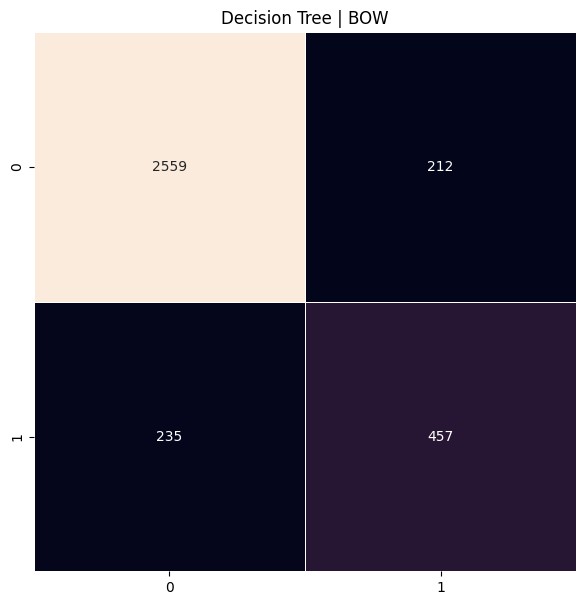

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Karar ağacı modeli için confusion matrix oluştur
cm_tree = confusion_matrix(y_test, predictions_tree)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Decision Tree | BOW")
sns.heatmap(cm_tree, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### Random forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(train_vectors, y_train)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(test_vectors)

# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf, y_test) * 100)


Random Forest Accuracy Score ->  90.03753970545769


In [ ]:
from sklearn.metrics import classification_report

# Sınıflandırma raporunu yazdır
print(classification_report(y_test, predictions_rf))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94      2771
           1       0.82      0.64      0.72       692

    accuracy                           0.90      3463
   macro avg       0.87      0.80      0.83      3463
weighted avg       0.90      0.90      0.90      3463



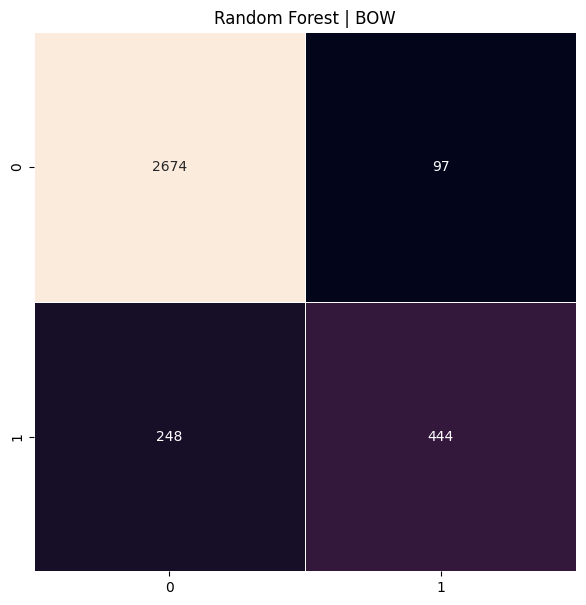

In [ ]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Random Forest modeli için confusion matrix oluştur
cm_rf = confusion_matrix(y_test, predictions_rf)

# Heatmap'i çiz
plt.figure(figsize=(7,7))
plt.title("Random Forest | BOW")
sns.heatmap(cm_rf, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()


* ## [W2V](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin eklenmesi](#b2)

> Blok alıntı ekle



In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

In [ ]:
#dirve da kullanacaksanız buras şart yoksa yorum satırına alınız
warnings.filterwarnings('ignore')

from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/Bil482/  #çalışılacak drve dizinni


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/Bil482/ #çalışılacak drve dizinni'
/content/drive/My Drive/Bil482


'\n\ndata = pd.read_csv("db.csv",index_col=0)\ndata.isnull().values.any()\n\ndata.head()'

In [ ]:
data = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

In [ ]:
data['Text'].isnull().values.any()

False

In [ ]:
data.head()

,Text,score
1,"At Wipro, growth remains a mirage",-1
2,Why Chinese stocks leave US investors vulnerable,-1
3,US stocks finish mixed amid more tech selling,-1
4,Opec reduces estimate on oil demand growth,-1
5,Immediate support for rupee is placed at 55.10: Bonanza,-1


In [ ]:
data.head()

,Text,score
0,@AAlwuhaib1977 Muslim mob violence against Hindus in Bangladesh continues in 2014. #Islam http://t.co/C1JBWJwuRc,1
1,#NULL!,0
2,@jncatron @isra_jourisra @AMPalestine Islamophobia is like the idea of Naziphobia. Islam is a religion of hate and it must be outlawed.,1
3,"Finally I'm all caught up, and that sudden death cook off looks like it's gonna be intense #MKR",0
4,@carolinesinders @herecomesfran *hugs*,0


In [ ]:
data.shape

(9741, 2)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
import gensim

In [ ]:
data['Text'] = data['Text'].values.astype('U')
"""data['Text'] = data['Comment'].values.astype('U')"""

"data['Text'] = data['Comment'].values.astype('U')"

In [ ]:
data['Text'].head()

,Text
1,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza


#####[Dosya en başta yüklenmemişse](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#secilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)

In [ ]:
data

,hibrit,score
2,virginamerica plus added commercials experience tacky,1
4,virginamerica really aggressive blast obnoxious entertainment guests faces amp little recourse,0
5,virginamerica really big bad thing,0
6,virginamerica seriously would pay flight seats playing really bad thing flying va,0
7,virginamerica yes nearly every time fly vx ear worm go away,1
...,...,...
14634,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0
14635,americanair right cue delays,0
14636,americanair thank got different flight chicago,1
14637,americanair leaving minutes late flight warnings communication minutes late flight called shitty customer svc,0


In [ ]:
data_size=data.shape[0]
data_size

11541

###### [**Word Embeddings**](#b2)
1. Word2Vec Embeddings

- 100 dim,
- cbow

In [ ]:
tokenized_tweet = data[secilen_kolon_adi].head(data_size).apply(lambda x: x.split()) # tokenizing

model_w2v = gensim.models.Word2Vec(
            tokenized_tweet,
            vector_size=100,
            window=5, # context window size
            min_count=2,
            sg = 0, # 1 for skip-gram model
            hs = 0,
            negative = 10, # for negative sampling
            workers= 2, # no.of cores
            seed = 34)

model_w2v.train(tokenized_tweet, total_examples= len(data[secilen_kolon_adi]), epochs=20)

(1804936, 2323640)

In [ ]:
tokenized_tweet


,USAirPrePro2
0,"[virginamerica, plus, added, commercial, experience, tacky]"
1,"[virginamerica, really, aggressive, blast, obnoxious, entertainment, guest, face, little, recourse]"
2,"[virginamerica, really, big, bad, thing]"
3,"[virginamerica, seriously, would, pay, flight, seat, playing, really, bad, thing, flying, va]"
4,"[virginamerica, yes, nearly, every, time, fly, vx, ear, worm, wont, go, away]"
...,...
11536,"[americanair, flight, cancelled, flightled, leaving, tomorrow, morning, auto, rebooked, tuesday, night, flight, need, arrive, monday]"
11537,"[americanair, right, cue, delay]"
11538,"[americanair, thank, got, different, flight, chicago]"
11539,"[americanair, leaving, minute, late, flight, warning, communication, minute, late, flight, called, shitty, customer, svc]"


In [ ]:
tokenized_tweet.shape

(11541,)

In [ ]:
null_count = 0
from contextlib import nullcontext

# Örnek bir tokenized_tweet listesi oluşturalım
tokenized_tweet = [{"Text": "#NULL!"}, {"Text": "some_text"}, {"Text": "#NULL!"}]

# Sözlük olup olmadığını kontrol edelim ve "Text" anahtarının varlığını kontrol edelim
for tweet in tokenized_tweet:
    if isinstance(tweet, dict) and "Text" in tweet:
        if tweet["Text"] == '#NULL!':
            null_count += 1

print(null_count)


2


In [ ]:
def word_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v[word].reshape((1, size))
            count += 1.
        except KeyError: # handling the case where the token is not in vocabulary

            continue
    if count != 0:
        vec /= count
    return vec

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

#wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

In [ ]:
"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape"""

(3, 100)

In [ ]:
# Assuming 'model_w2v' is the Word2Vec model you trained earlier
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:  # handling the case where the word is not in the vocabulary
            continue
    if count != 0:
        vec /= count
    return vec

wordvec_arrays = np.zeros((len(tokenized_tweet), 100))

"""for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape
"""

'for i in range(len(tokenized_tweet)):\n    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)\n\nwordvec_df = pd.DataFrame(wordvec_arrays)\nwordvec_df.shape\n'

In [ ]:
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)
wordvec_df.shape

(3, 100)

In [ ]:
print("tokenized_tweet:", len(tokenized_tweet))
print("wordvec_df:", wordvec_df.shape)
print("data['score']:", len(data[secilen_sentiment_kolon_adi]))

tokenized_tweet: 3
wordvec_df: (3, 100)
data['score']: 11541


In [ ]:
# 1. Tüm veriyi tokenize et (buradaki 'text' sütunun adı sana bağlı)
tokenized_tweet = [str(text).split() for text in data[secilen_kolon_adi]]  # veya kendi tokenizer'ın varsa kullan

# 2. Word2Vec modelini oluştur
from gensim.models import Word2Vec
model_w2v = Word2Vec(sentences=tokenized_tweet, vector_size=100, window=5, min_count=2)

# 3. Ortalama vektör fonksiyonu (seninkini aynen kullanıyoruz)
def get_tweet_vector(tokens, size):
    vec = np.zeros(size).reshape((1, size))
    count = 0.
    for word in tokens:
        try:
            vec += model_w2v.wv[word].reshape((1, size))
            count += 1.
        except KeyError:
            continue
    if count != 0:
        vec /= count
    return vec

# 4. Tüm tweet'leri vektöre çevir
wordvec_arrays = np.zeros((len(tokenized_tweet), 100))
for i in range(len(tokenized_tweet)):
    wordvec_arrays[i, :] = get_tweet_vector(tokenized_tweet[i], 100)

wordvec_df = pd.DataFrame(wordvec_arrays)

# 5. Etiketlerle aynı uzunlukta mı kontrol et
print(wordvec_df.shape)         # (13471, 100) olmalı
print(len(data[secilen_kolon_adi]))       # 13471 olmalı


(11541, 100)
11541


In [ ]:
wordvec_df

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,-0.101728,-0.020084,-0.055054,-0.102188,0.134034,-0.681079,-0.004825,0.674019,0.006433,-0.340861,...,0.425422,0.242831,-0.132598,0.421668,0.555617,0.394042,-0.154130,-0.294631,-0.034374,0.103672
1,-0.071978,-0.027670,-0.048024,-0.051048,0.073633,-0.400429,0.001396,0.400643,0.009550,-0.203527,...,0.252086,0.153317,-0.059373,0.253659,0.330838,0.263514,-0.100467,-0.178647,-0.012937,0.080668
2,-0.175266,-0.055818,-0.110651,-0.124617,0.188434,-0.986128,0.003182,0.992592,0.025010,-0.498217,...,0.619342,0.378415,-0.156574,0.628957,0.813718,0.640167,-0.240890,-0.433893,-0.028929,0.188888
3,-0.139831,-0.073692,-0.108056,-0.096799,0.165897,-0.863693,0.009035,0.879922,0.036627,-0.435418,...,0.526509,0.334106,-0.102184,0.534479,0.720174,0.587419,-0.215826,-0.367703,-0.022262,0.182121
4,-0.124323,-0.051799,-0.078261,-0.084020,0.129091,-0.690449,0.007480,0.695955,0.027007,-0.341105,...,0.439491,0.268313,-0.090112,0.439953,0.569283,0.462580,-0.174143,-0.302390,-0.014119,0.147483
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11536,-0.050496,-0.134186,-0.194461,-0.051573,0.175050,-0.775219,0.043105,0.843525,0.085912,-0.403310,...,0.355544,0.334229,0.043015,0.424341,0.738252,0.596978,-0.237806,-0.253921,0.010297,0.212432
11537,-0.121048,-0.066403,-0.110119,-0.094562,0.161427,-0.821321,0.019318,0.840611,0.044088,-0.417362,...,0.497938,0.319812,-0.079007,0.498680,0.673823,0.563418,-0.200551,-0.337495,0.001495,0.158070
11538,-0.124260,-0.098112,-0.157639,-0.084709,0.183908,-0.947648,0.032266,0.987574,0.062575,-0.488213,...,0.530019,0.375960,-0.056667,0.563843,0.819220,0.670396,-0.266220,-0.380164,-0.012641,0.212905
11539,-0.043824,-0.082858,-0.136827,-0.073596,0.153620,-0.767442,0.047758,0.812293,0.065131,-0.394405,...,0.423949,0.338615,-0.033705,0.457995,0.711539,0.557890,-0.228529,-0.256430,-0.008738,0.148611


**2. Doc2Vec Embedding**

- 100 dim,


###### [Train test split](#b2)

In [ ]:
data['score']=data['score'].astype(int)

In [ ]:

from sklearn.model_selection import train_test_split

train_w2v = wordvec_df.iloc[:150000, :]
test_w2v = wordvec_df.iloc[150000:, :]
#xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)
"""
# Splitting data into training and validation set
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['BinaryNumTarget'],random_state=42,test_size=0.2)
"""
xtrain_w2v, xvalid_w2v, ytrain, yvalid = train_test_split(train_w2v, data['score'],random_state=42,test_size=0.3)


In [ ]:
data['score']

,score
0,1
1,0
2,0
3,0
4,1
...,...
11536,0
11537,0
11538,1
11539,0


In [ ]:
test_w2v.shape

(0, 100)

In [ ]:
print(type(ytrain))
print(ytrain.head())

<class 'pandas.core.series.Series'>
9067    0
6475    1
5147    1
3319    0
8885    0
Name: score, dtype: int64


In [ ]:
yvalid.head()

,score
9193,0
6112,1
967,0
11279,0
3061,1


In [ ]:
yvalid.shape

(3463,)

In [ ]:
ytrain

,score
9067,0
6475,1
5147,1
3319,0
8885,0
...,...
11284,0
5191,0
5390,1
860,0


In [ ]:
ytrain.shape

(8078,)

###### [**1. Logistic Regression**](#b2)
xtrain_w2v, xvalid_w2v, ytrain, yvalid

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
log_reg = linear_model.LogisticRegression()
log_reg.fit(xtrain_w2v,y_train)
predictions_log = log_reg.predict(xvalid_w2v)
print("Logistic Regression Accuracy Score -> ",accuracy_score(predictions_log, y_test)*100)

Logistic Regression Accuracy Score ->  84.78198094138031


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score

In [ ]:
from sklearn import linear_model
from sklearn.model_selection import cross_val_score
lreg = linear_model.LogisticRegression()

In [ ]:
lreg.fit(xtrain_w2v, ytrain)

LogisticRegression()

In [ ]:
from sklearn.metrics import f1_score

# Olasılık tahmini
prediction = lreg.predict_proba(xvalid_w2v)

# Eşik değeri uygulayarak ikili sınıflandırma
prediction_LR_int = (prediction[:, 1] >= 0.3).astype(int)

# Etiketleri integer'a dönüştür (örneğin: "0" -> 0, "1" -> 1)
yvalid_int = [int(label) for label in yvalid]

# F1 skoru hesapla
f1_score_result = f1_score(yvalid_int, prediction_LR_int)
print("F1 Score:", f1_score_result)


F1 Score: 0.5851285615010424


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_LR_int))

              precision    recall  f1-score   support

           0       0.89      0.89      0.89      2771
           1       0.57      0.57      0.57       692

    accuracy                           0.83      3463
   macro avg       0.73      0.73      0.73      3463
weighted avg       0.83      0.83      0.83      3463



In [ ]:
f1_score(yvalid_int, prediction_LR_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_LR_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8300366423298112

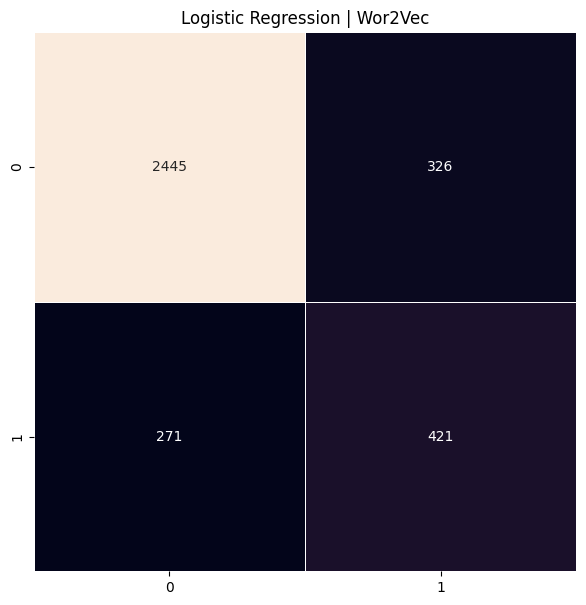

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_LR_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**2. Support Vector Machine**](#b2)

In [ ]:
from sklearn import svm


In [ ]:
from sklearn.svm import LinearSVC
l2_norm = 2
l2_norm_inverse = 1/l2_norm
maximum_iterations=4000
svm = LinearSVC(C=l2_norm_inverse,max_iter=maximum_iterations)
SVM=svm.fit(xtrain_w2v,ytrain)

# predict the labels on validation dataset
predictions_SVM = SVM.predict(xvalid_w2v)
# Use accuracy_score function to get the accuracy
print("SVM Accuracy Score -> ",accuracy_score(predictions_SVM, y_test)*100)

SVM Accuracy Score ->  86.0814322841467


In [ ]:
import numpy as np
from sklearn import svm
from sklearn.metrics import f1_score

svc = svm.SVC(kernel='linear', C=1, probability=True).fit(xtrain_w2v, ytrain)

prediction = svc.predict_proba(xvalid_w2v)
prediction_int = prediction[:, 1] >= 0.3
prediction_SVM_int = prediction_int.astype(int)
f1_score(yvalid_int, prediction_SVM_int)


0.6494773519163763

In [ ]:
f1_score(yvalid_int, prediction_SVM_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_SVM_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8566567756897022

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_SVM_int))

              precision    recall  f1-score   support

           0       0.92      0.90      0.91      2771
           1       0.63      0.67      0.65       692

    accuracy                           0.85      3463
   macro avg       0.77      0.79      0.78      3463
weighted avg       0.86      0.85      0.86      3463



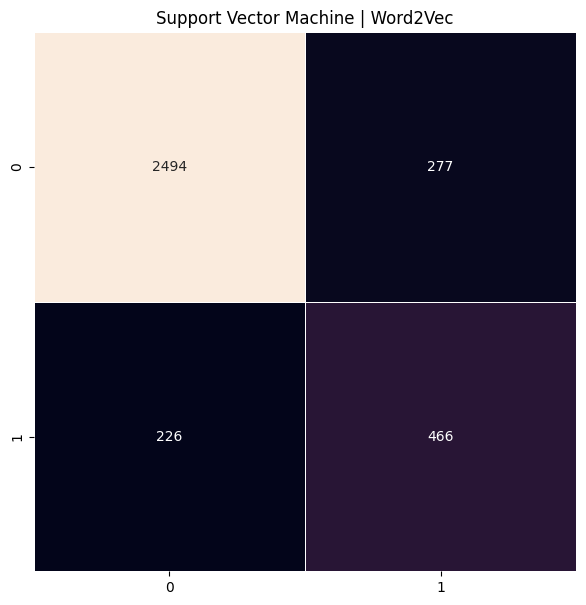

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_SVM_int)
plt.figure(figsize=(7,7))
plt.title("Support Vector Machine | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [**3. Decission tree**]($b2)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
tree_clf = DecisionTreeClassifier()
tree_clf.fit(xtrain_w2v, ytrain)
predictions_tree = tree_clf.predict(xvalid_w2v)
predictions_tree_int = [int(label) for label in predictions_tree]
yvalid_int = [int(label) for label in yvalid]
print("Decision Tree Accuracy Score -> ", accuracy_score(predictions_tree_int, yvalid_int) * 100)

Decision Tree Accuracy Score ->  79.81518914236212


In [ ]:
from sklearn.tree import DecisionTreeClassifier


In [ ]:
dt = DecisionTreeClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_DT=  dt.predict(xvalid_w2v)
prediction_DT_int = [int(label) for label in prediction_DT]
f1_score(yvalid_int, prediction_DT_int)


0.5089605734767025

In [ ]:
f1_score(yvalid_int, prediction_DT_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, prediction_DT_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8027778100246751

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_DT_int))

              precision    recall  f1-score   support

           0       0.88      0.87      0.88      2771
           1       0.50      0.51      0.51       692

    accuracy                           0.80      3463
   macro avg       0.69      0.69      0.69      3463
weighted avg       0.80      0.80      0.80      3463



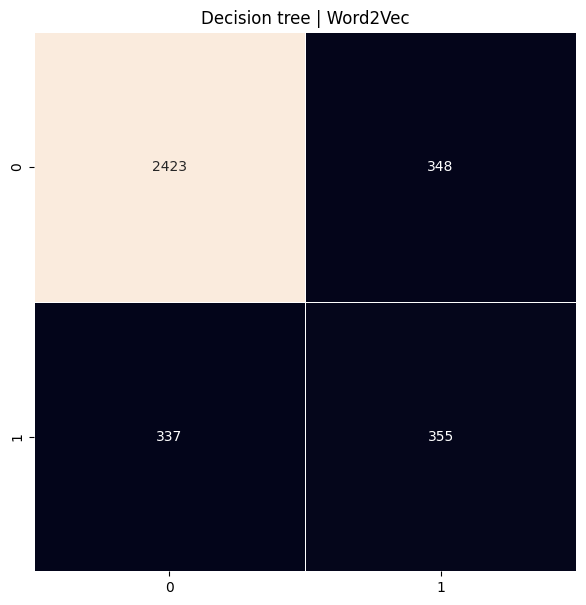

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, prediction_DT_int)
plt.figure(figsize=(7,7))
plt.title("Decision tree | Word2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

###### [NB](#b2)
Navie Bayes wordvec deki negatif değerlerden dolayı hata verdi

In [ ]:
#use ML algorithms classifier
#use a Naive Bayes Classifier and train the model on the training set.
"""from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB().fit(xtrain_w2v, ytrain)"""

'from sklearn.naive_bayes import MultinomialNB\nclf = MultinomialNB().fit(xtrain_w2v, ytrain)'

###### [Random Forest](#b2)

In [ ]:
#multi output için
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Random Forest sınıflandırıcısını tanımla
rf_clf = RandomForestClassifier()

# Modeli eğit
rf_clf.fit(xtrain_w2v, ytrain)

# Test verileri üzerinde tahmin yap
predictions_rf = rf_clf.predict(xvalid_w2v)
predictions_rf_int = [int(label) for label in predictions_rf]
yvalid_int = [int(label) for label in yvalid]
# Doğruluk skorunu hesapla ve yazdır
print("Random Forest Accuracy Score -> ", accuracy_score(predictions_rf_int, yvalid_int) * 100)


Random Forest Accuracy Score ->  86.28356915968813


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import f1_score

# Multi-label için model sarmalayıcı kullan
RF = OneVsRestClassifier(RandomForestClassifier(random_state=42))
RF.fit(xtrain_w2v, ytrain)

# Tahmin
predictions = RF.predict(xvalid_w2v)

# F1 score
f1 = f1_score(yvalid, predictions, average='macro')  # veya 'samples', 'micro'
print("F1 Score:", f1)


F1 Score: 0.7357255480713438


In [ ]:

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = RandomForestClassifier().fit(xtrain_w2v, ytrain)
yvalid_int = [int(label) for label in yvalid]
prediction_RF = RF.predict(xvalid_w2v)

# Bu satırda yanlışlık var — prediction_DT yanlış değişken
prediction_RF_int = [int(label) for label in prediction_RF]  # Doğrusu bu olmalı

f1_score(yvalid_int, prediction_RF_int)

0.5591798695246971

In [ ]:
#2 output
from sklearn.multiclass import OneVsRestClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score

RF = OneVsRestClassifier(RandomForestClassifier())
RF.fit(xtrain_w2v, ytrain)

prediction_RF = RF.predict(xvalid_w2v)
f1 = f1_score(yvalid, prediction_RF, average='macro')  # veya 'micro', 'samples'
print("F1 Score:", f1)


F1 Score: 0.7343675073217446


In [ ]:
from sklearn.metrics import classification_report
print(classification_report(yvalid_int, prediction_RF_int))

              precision    recall  f1-score   support

           0       0.87      0.97      0.92      2771
           1       0.79      0.43      0.56       692

    accuracy                           0.86      3463
   macro avg       0.83      0.70      0.74      3463
weighted avg       0.86      0.86      0.85      3463



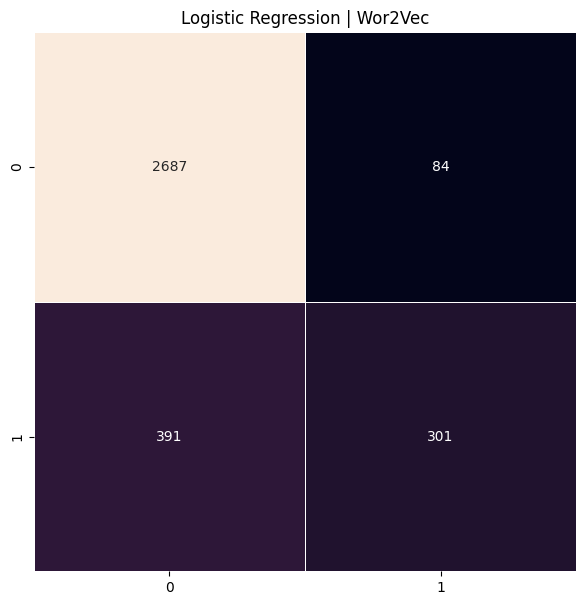

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(yvalid_int, predictions_rf_int)
plt.figure(figsize=(7,7))
plt.title("Logistic Regression | Wor2Vec")
sns.heatmap(cm, annot=True, fmt="d", linewidths=0.7 ,cbar=False)
plt.show()

In [ ]:
f1_score(yvalid_int, predictions_rf_int, average='macro')       # Sınıflar eşit ağırlıklı
f1_score(yvalid_int, predictions_rf_int, average='weighted')    # Gerçek örnek sayısına göre ağırlıklı


0.8468859883115065

* ## [LSTM](#p1)
    * #### [NB](#nb)
    * #### [SVM](#svm)
    * #### [LOGISTIC REG](#log)


#####[Dosya en başta yüklenmemişse](#b2)

###### [Kütüphanelerin yüklenmesi](#p2)

In [ ]:
# importing required libraries
import pandas as pd
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
import re
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
import nltk
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

%matplotlib inline

###### [Dosyanın yüklenmesin](#p2)

In [ ]:
import numpy as np
import pandas as pd
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

/kaggle/input/amazon-product-reviews/amazon.csv

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/My Drive/BİL482/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
[Errno 2] No such file or directory: '/content/drive/My Drive/BİL482/'
/content/drive/My Drive/Bil482


In [ ]:
train_df = pd.read_csv("twitter_racism_parsed_dataset.csv",index_col=0)

###### [Veri Setinin incelenmesi](#p2)

In [ ]:
train_df=df

In [ ]:
train_df.isnull().values.any()

False

In [ ]:
train_df.head()

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Comment
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"At Wipro, growth remains a mirage"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,Why Chinese stocks leave US investors vulnerable
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,US stocks finish mixed amid more tech selling
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,Opec reduces estimate on oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,Immediate support for rupee is placed at 55.10: Bonanza


In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1.0,0,0.0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1.0,0,0.0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1.0,0,0.0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1.0,0,0.0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1.0,0,0.0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1.0,2,1.0,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1.0,2,1.0,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is o

In [ ]:
train_df

,Text,tokens,text_length,hibrit,USAirPrePro,USAirPrePro2,MuammerNLPPrePRro,MuammerNLPPrePRro2,MuammerNLPLSTMPrePRro,score,oh_label,score2,Text_prepro
1,"At Wipro, growth remains a mirage","[""['Micro', 'growth', 'remain', 'murat']""]",33,wipro growth remains mirage,wipro growth remain mirag,wipro growth remains mirage,At Wipro growth remains mirage,"At Wipro, growth remains a mirage","wipro , growth remain mirag",-1,0,0,"wipro , growth remain mirag"
2,Why Chinese stocks leave US investors vulnerable,"[""['Chinese', 'stick', 'leave', 'of', 'investor', 'vulnerable']""]",48,chinese stocks leave us investors vulnerable,chines stock leav u investor vulner,chinese stock leave u investor vulnerable,Why Chinese stocks leave US investors vulnerable,Why Chinese stocks leave US investors vulnerable,chines stock leav us investor vulner,-1,0,0,chines stock leav us investor vulner
3,US stocks finish mixed amid more tech selling,"[""['of', 'stick', 'finish', 'fix', 'maid', 'each', 'sell']""]",45,us stocks finish mixed amid tech selling,u stock finish mix amid tech sell,u stock finish mixed amid tech selling,US stocks finish mixed amid more tech selling,US stocks finish mixed amid more tech selling,us stock finish mix amid tech sell,-1,0,0,us stock finish mix amid tech sell
4,Opec reduces estimate on oil demand growth,"[""['OPEC', 'reduces', 'estimate', 'oil', 'demand', 'growth']""]",42,opec reduces estimate oil demand growth,opec reduc estim oil demand growth,opec reduces estimate oil demand growth,Opec reduces estimate on oil demand growth,Opec reduces estimate on oil demand growth,opec reduc estim oil demand growth,-1,0,0,opec reduc estim oil demand growth
5,Immediate support for rupee is placed at 55.10: Bonanza,"[""['immediate', 'support', 'rule', 'place', '5510', 'bonanza']""]",55,immediate support rupee placed bonanza,immedi support rupe place bonanza,immediate support rupee placed bonanza,Immediate support for rupee is placed at Bonanza,Immediate support for rupee is placed at 55.10: Bonanza,immedi support rupe place bonanza,-1,0,0,immedi support rupe place bonanza
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9737,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","[""['negotiation', 'carry', 'constructive', 'manner', '', 'patch', 'tire', 'fund', 'solution', 'situation', '']""]",121,negotiations carried constructive manner parties tried find solution situation,negoti carri construct manner parti tri find solut situat,negotiation carried constructive manner party tried find solution situation,The negotiations were carried out in constructive manner and all parties tried to find solution to the situation,"The negotiations were carried out in a constructive manner , and all parties tried to find a solution to the situation .","negoti carri construct manner , parti tri find solut situat",1,2,1,"negoti carri construct manner , parti tri find solut situat"
9738,Wockhardt story is really intriguing: Deven Choksey,"[""['hardtack', 'story', 'really', 'intrigue', 'seven', 'choke']""]",51,wockhardt story really intriguing deven choksey,wockhardt stori realli intrigu deven choksey,wockhardt story really intriguing deven choksey,Wockhardt story is really intriguing Deven Choksey,Wockhardt story is really intriguing: Deven Choksey,wockhardt stori realli intrigu deven choksey,1,2,1,wockhardt stori realli intrigu deven choksey
9739,Finnish Bore that is owned by the Rettig family has grown recently through the acquisition of smaller shipping companies .,"[""['Finnish', 'robe', 'own', 'get', 'family', 'frown', 'recently', 'acquisition', 'small', 'shipping', 'company', '']""]",123,finnish bore owned rettig family grown recently acquisition smaller shipping companies,finnish bore own rettig famili grown recent acquisit smaller ship compani,finnish bore owned rettig family grown recently acquisition smaller shipping company,Finnish Bore that is owned by the Rettig family ha

#####[Dosya en başta yüklenmişse burdan başla](#b2)

###### [x ve y değerlerinin belirlenmesi](#p2)

In [ ]:
#ecilen_kolon_adi="hibrit"
#secilen_sentiment_kolon_adi="score2"

In [ ]:
#x burda veri setinden seçilen sütunun listesi
x_liste=df[secilen_kolon_adi]
y_liste=df[secilen_sentiment_kolon_adi]


In [ ]:
from tkinter import Y
#X_df burda veri setinden seçilen sütunun listesi
X_df = x_liste.to_frame(name=secilen_kolon_adi)
Y_df = y_liste.to_frame(name=secilen_sentiment_kolon_adi)


In [ ]:
X_df.shape

(9741, 1)

In [ ]:
print(len(df))

9741


In [ ]:
data=pd.concat([X_df,Y_df],axis=1)
data=data.reset_index(drop=True)

In [ ]:
data

,USAirPrePro2,score
0,virginamerica plus added commercial experience tacky,1
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse,0
2,virginamerica really big bad thing,0
3,virginamerica seriously would pay flight seat playing really bad thing flying va,0
4,virginamerica yes nearly every time fly vx ear worm wont go away,1
...,...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday,0
11537,americanair right cue delay,0
11538,americanair thank got different flight chicago,1
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc,0


###### [Tokanize işlemleri](#p2)

In [ ]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
nltk.download('stopwords')
nltk.download('punkt')
stemmer = PorterStemmer()
def preprocess_text(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'(.)\1{2,}', '', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'\b(\w+)\s+(\1\s+){2,}', r'\1 ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    preprocessed_text = ' '.join(tokens)
    return preprocessed_text

def preprocess_text2(text):
    text = text.lower()
    text = re.sub(r'[^\x00-\x7F]+', ' ', text)
    text = re.sub(r'\.{2,}', ' ', text)
    text = re.sub(r'[^a-zA-Z\s,\']', '', text)
    tokens = word_tokenize(text)
    stopwords_set = set(stopwords.words('english'))
    tokens = [stemmer.stem(word) for word in tokens if word not in stopwords_set]
    return tokens
def preprocess_text3(text):

    tokens = word_tokenize(text)

    return tokens

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
preprocess_data=lambda text:preprocess_text(text)
data["Text_prepro"]=data[secilen_kolon_adi].apply(preprocess_data)

In [ ]:
tokenized_documents=[preprocess_text2(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
x_liste

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away
...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
11537,americanair right cue delay
11538,americanair thank got different flight chicago
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc


In [ ]:
X_df

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away
...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
11537,americanair right cue delay
11538,americanair thank got different flight chicago
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc


In [ ]:
#Ön işleme yapmayacaksak
tokenized_documents=[preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]

In [ ]:
len(tokenized_documents)

11541

In [ ]:
tokenized_documents[0]

['virginamerica', 'plus', 'added', 'commercial', 'experience', 'tacky']

In [ ]:
from gensim.models import Word2Vec
ukuran_vektor=100
word2vec_model = Word2Vec(sentences=tokenized_documents,
                          min_count=1, vector_size=ukuran_vektor,sg=1)

In [ ]:
print(word2vec_model)

Word2Vec<vocab=10563, vector_size=100, alpha=0.025>


In [ ]:
all_words =word2vec_model.wv.index_to_key
print("50 kata pertama dalam model Word2Vec:")
for index, word in enumerate(all_words):
    if index < 50:
        print(f"{word} : {index}")
    else:
        break

50 kata pertama dalam model Word2Vec:
flight : 0
united : 1
usairways : 2
americanair : 3
southwestair : 4
jetblue : 5
get : 6
hour : 7
thanks : 8
cancelled : 9
service : 10
customer : 11
time : 12
bag : 13
help : 14
plane : 15
u : 16
hold : 17
would : 18
thank : 19
still : 20
day : 21
call : 22
delayed : 23
airline : 24
one : 25
gate : 26
flightled : 27
need : 28
back : 29
phone : 30
hr : 31
delay : 32
got : 33
agent : 34
seat : 35
late : 36
please : 37
guy : 38
min : 39
like : 40
waiting : 41
today : 42
virginamerica : 43
minute : 44
great : 45
make : 46
wait : 47
fly : 48
going : 49


In [ ]:
max_length = X_df[secilen_kolon_adi].apply(lambda x: len(x.split())).max()

In [ ]:
max_length

21

In [ ]:
max_length_index = X_df[secilen_kolon_adi].apply(len).idxmax()
print("Index baris dengan max_length adalah :", max_length_index)

Index baris dengan max_length adalah : 9180


In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'usairways travelling pwm atl sunday flight got cancelled flightled new flight cancelled flightled got disconnected reflight booking problem'

In [ ]:
X_df.at[max_length_index, secilen_kolon_adi]

'usairways travelling pwm atl sunday flight got cancelled flightled new flight cancelled flightled got disconnected reflight booking problem'

In [ ]:
sequences = [[word2vec_model.wv.key_to_index[word] for word in text]
             for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]]

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] if word in word2vec_model.wv.key_to_index else None for word in text]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]


In [ ]:
from keras.preprocessing.sequence import pad_sequences
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')

In [ ]:
sequences = [
    [word2vec_model.wv.key_to_index[word] for word in text if word in word2vec_model.wv.key_to_index]
    for text in [preprocess_text3(doc) for doc in X_df[secilen_kolon_adi]]
]

# Pad sequences after removing None values
padded_sequences = pad_sequences(sequences, maxlen=max_length, padding='post')


In [ ]:
len(sequences)

11541

In [ ]:
sequences[0]

[43, 402, 1039, 1174, 85, 4693]

In [ ]:
padded_sequences.shape

(11541, 21)

In [ ]:
y = np.asarray(df[secilen_sentiment_kolon_adi])

In [ ]:
y

array([1., 0., 0., ..., 1., 0., 0.])

In [ ]:
jumlah_kelas=len(df[secilen_sentiment_kolon_adi].unique())

In [ ]:
jumlah_kelas

2

In [ ]:
y

array([1., 0., 0., ..., 1., 0., 0.])

In [ ]:
padded_sequences

array([[  43,  402, 1039, ...,    0,    0,    0],
       [  43,   57, 3291, ...,    0,    0,    0],
       [  43,   57,  305, ...,    0,    0,    0],
       ...,
       [   3,   19,   33, ...,    0,    0,    0],
       [   3,  345,   44, ...,    0,    0,    0],
       [   3,  236,   60, ...,    0,    0,    0]], dtype=int32)

###### [Test_train ayrımı ve embeding yapma](#p2)

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(padded_sequences, y,
                                            test_size=0.3,
                                            random_state=42, stratify=y)

In [ ]:
embedding_matrix = np.zeros((len(word2vec_model.wv.key_to_index) + 1, word2vec_model.vector_size))
for word, i in word2vec_model.wv.key_to_index.items():
    embedding_vector = word2vec_model.wv[word]
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

###### [Model Oluşturma ve çalıştırma](#p2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Etiketlerinizi sayısal değerlere dönüştürün
y_train = label_encoder.fit_transform(y_train)
y_val = label_encoder.transform(y_val)


In [ ]:
y_val.shape

(3463,)

In [ ]:
y_train.shape

(8078,)

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
x_liste

,USAirPrePro2
0,virginamerica plus added commercial experience tacky
1,virginamerica really aggressive blast obnoxious entertainment guest face little recourse
2,virginamerica really big bad thing
3,virginamerica seriously would pay flight seat playing really bad thing flying va
4,virginamerica yes nearly every time fly vx ear worm wont go away
...,...
11536,americanair flight cancelled flightled leaving tomorrow morning auto rebooked tuesday night flight need arrive monday
11537,americanair right cue delay
11538,americanair thank got different flight chicago
11539,americanair leaving minute late flight warning communication minute late flight called shitty customer svc


###### [1. Deneme](#b3)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 107ms/step - accuracy: 0.7606 - loss: 0.6127 - val_accuracy: 0.7953 - val_loss: 0.5211
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 95ms/step - accuracy: 0.7971 - loss: 0.5065 - val_accuracy: 0.7953 - val_loss: 0.4655
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - accuracy: 0.7976 - loss: 0.4655 - val_accuracy: 0.8184 - val_loss: 0.4160
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - accuracy: 0.8272 - loss: 0.4177 - val_accuracy: 0.8293 - val_loss: 0.3988
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 8s 94ms/step - accuracy: 0.8438 - loss: 0.3842 - val_accuracy: 0.8455 - val_loss: 0.3831
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 87ms/step - accuracy: 0.8499 - loss: 0.3698 - val_accuracy: 0.8487 - val_loss: 0.3754
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 144ms/step - accuracy: 0.8549 - loss: 0.3597 - val_accuracy: 0.8464 - val_loss: 0.3765
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 100ms/step - accuracy: 0.8550 - loss: 0.3592 - val_accurac

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 88.30%


In [ ]:
#2 sınıf için
from sklearn.metrics import classification_report

# Olasılık tahminlerini al
y_pred_prob = model.predict(X_val)  # Sonuçlar 0-1 arası değerler

# 0.5 eşik değeri ile sınıf tahminine çevir
y_pred_classes = (y_pred_prob >= 0.5).astype(int)

# Classification report yazdır
report = classification_report(y_test, y_pred_classes, target_names=["Negative", "Positive"])
print("Classification Report:")
print(report)


109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
Classification Report:
              precision    recall  f1-score   support

    Negative       0.80      0.85      0.82      2771
    Positive       0.20      0.15      0.17       692

    accuracy                           0.71      3463
   macro avg       0.50      0.50      0.50      3463
weighted avg       0.68      0.71      0.69      3463



109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step


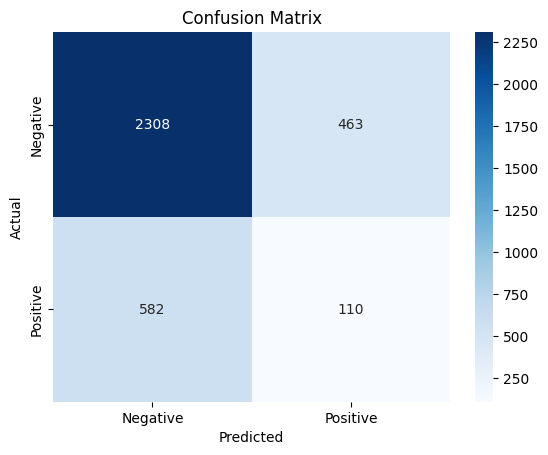

📌 Classification Report:
              precision    recall  f1-score   support

    Negative       0.80      0.83      0.82      2771
    Positive       0.19      0.16      0.17       692

    accuracy                           0.70      3463
   macro avg       0.50      0.50      0.49      3463
weighted avg       0.68      0.70      0.69      3463



In [ ]:
#2 Sınıf varsa
y_pred_prob = model.predict(X_val)                         # Olasılıklar (0-1 arası)
y_pred = (y_pred_prob >= 0.5).astype(int)                 # 0.5 eşik ile sınıf tahmini

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Classification report
from sklearn.metrics import classification_report
print("📌 Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Negative', 'Positive']))


In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_1', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 10564, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[ 0.00561036 -0.01116495  0.02439922 ...  0.04126102 -0.02027042
   0.04573914]
 [ 0.03472749 -0.02701889 -0.01342719 ...  0.04511945 -0.01301843
  -0.03892518]
 [ 0.01799292 -0.00303339 -0.02549812 ... -0.01066267 -0.03256189
  -0.026501  ]
 ...
 [ 0.00597277 -0.0497618   0.00382968 ...  0.00769482 -0.04767501
   0.03943869]
 [ 0.0059886  -0.04312101  0.03397058 ...  0.0282849  -0.03771722
   0.01778496]
 [-0.00338813  0.00496197  0.0359706  ...  0.04076444 -0.02704898
   0.01024482]]


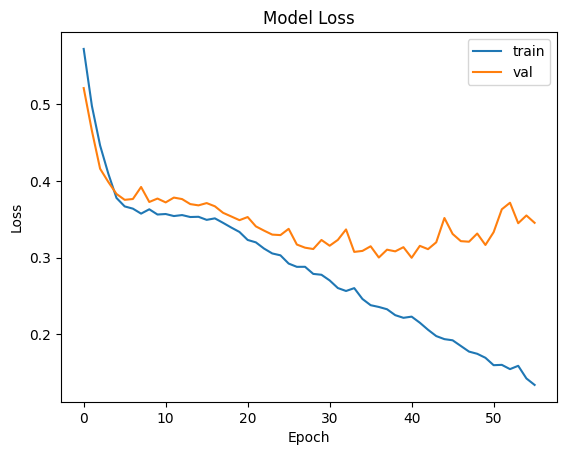

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

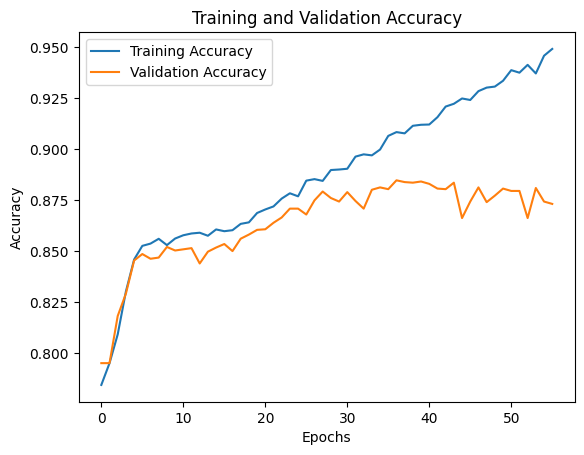

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

###### [2. Deneme](#b3)

In [ ]:
history = model.fit(X_train, y_train, epochs=100, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])


Epoch 1/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 111ms/step - accuracy: 0.9315 - loss: 0.1788 - val_accuracy: 0.8790 - val_loss: 0.3362
Epoch 2/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 4s 118ms/step - accuracy: 0.9349 - loss: 0.1713 - val_accuracy: 0.8747 - val_loss: 0.3463
Epoch 3/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 90ms/step - accuracy: 0.9341 - loss: 0.1695 - val_accuracy: 0.8779 - val_loss: 0.3189
Epoch 4/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 98ms/step - accuracy: 0.9318 - loss: 0.1696 - val_accuracy: 0.8729 - val_loss: 0.3755
Epoch 5/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 7s 145ms/step - accuracy: 0.9362 - loss: 0.1659 - val_accuracy: 0.8819 - val_loss: 0.3571
Epoch 6/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 91ms/step - accuracy: 0.9399 - loss: 0.1571 - val_accuracy: 0.8735 - val_loss: 0.3519
Epoch 7/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.9420 - loss: 0.1494 - val_accuracy: 0.8735 - val_loss: 0.3589
Epoch 8/100
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 96ms/step - accuracy: 0.9497 - loss: 0.1395 - val_accuracy:

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')

Test Accuracy: 87.79%


In [ ]:
#2 sınıf için
from sklearn.metrics import classification_report

# Olasılık tahminlerini al
y_pred_prob = model.predict(X_val)  # Sonuçlar 0-1 arası değerler

# 0.5 eşik değeri ile sınıf tahminine çevir
y_pred_classes = (y_pred_prob >= 0.5).astype(int)

# Classification report yazdır
report = classification_report(y_test, y_pred_classes, target_names=["Negative", "Positive"])
print("Classification Report:")
print(report)


109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Classification Report:
              precision    recall  f1-score   support

    Negative       0.80      0.82      0.81      2771
    Positive       0.19      0.17      0.18       692

    accuracy                           0.69      3463
   macro avg       0.49      0.49      0.49      3463
weighted avg       0.68      0.69      0.68      3463



109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


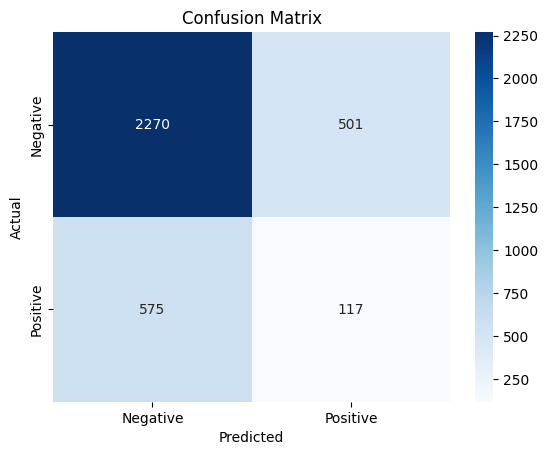

📌 Classification Report:
              precision    recall  f1-score   support

    Negative       0.80      0.82      0.81      2771
    Positive       0.19      0.17      0.18       692

    accuracy                           0.69      3463
   macro avg       0.49      0.49      0.49      3463
weighted avg       0.68      0.69      0.68      3463



In [ ]:
#2 Sınıf varsa
y_pred_prob = model.predict(X_val)                         # Olasılıklar (0-1 arası)
y_pred = (y_pred_prob >= 0.5).astype(int)                 # 0.5 eşik ile sınıf tahmini

# Confusion matrix
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Negative', 'Positive'],
            yticklabels=['Negative', 'Positive'])
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# Classification report
from sklearn.metrics import classification_report
print("📌 Classification Report:")
print(classification_report(y_test, y_pred, target_names=['Negative', 'Positive']))


In [ ]:
print("Konfigurasi Lapisan Embedding:")
print(model.layers[0].get_config())

Konfigurasi Lapisan Embedding:
{'name': 'embedding_1', 'trainable': False, 'dtype': {'module': 'keras', 'class_name': 'DTypePolicy', 'config': {'name': 'float32'}, 'registered_name': None}, 'input_dim': 10564, 'output_dim': 100, 'embeddings_initializer': {'module': 'keras.initializers', 'class_name': 'RandomUniform', 'config': {'seed': None, 'minval': -0.05, 'maxval': 0.05}, 'registered_name': None}, 'embeddings_regularizer': None, 'activity_regularizer': None, 'embeddings_constraint': None, 'mask_zero': False}


In [ ]:
print("Bobot Lapisan Embedding:")
print(model.layers[0].get_weights()[0])

Bobot Lapisan Embedding:
[[ 0.00561036 -0.01116495  0.02439922 ...  0.04126102 -0.02027042
   0.04573914]
 [ 0.03472749 -0.02701889 -0.01342719 ...  0.04511945 -0.01301843
  -0.03892518]
 [ 0.01799292 -0.00303339 -0.02549812 ... -0.01066267 -0.03256189
  -0.026501  ]
 ...
 [ 0.00597277 -0.0497618   0.00382968 ...  0.00769482 -0.04767501
   0.03943869]
 [ 0.0059886  -0.04312101  0.03397058 ...  0.0282849  -0.03771722
   0.01778496]
 [-0.00338813  0.00496197  0.0359706  ...  0.04076444 -0.02704898
   0.01024482]]


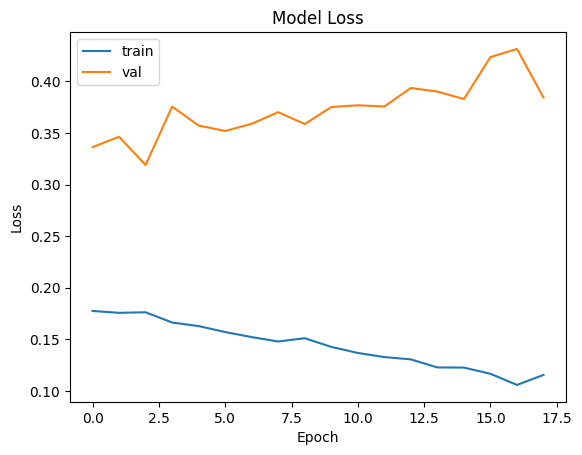

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='val')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

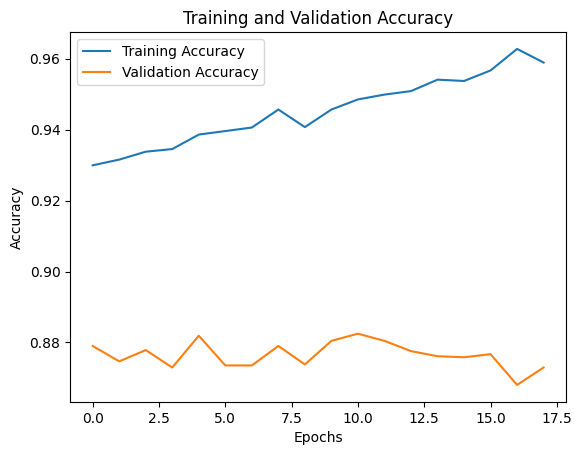

In [ ]:
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
plt.plot(accuracy, label='Training Accuracy')
plt.plot(val_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

###### [Model özet ve Arsitektur](#b3)

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding_1 (Embedding)         │ (None, 21, 100)        │     1,056,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 21, 100)        │        80,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_max_pooling1d_1          │ (None, 100)            │             0 │
│ (GlobalMaxPooling1D)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 128)            │        12,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,336,773 (5.10 MB)

 Trainable params: 93,457 (365.07 KB)

 Non-trainable params: 1,056,400 (4.03 MB)

 Optimizer params: 186,916 (730.14 KB)

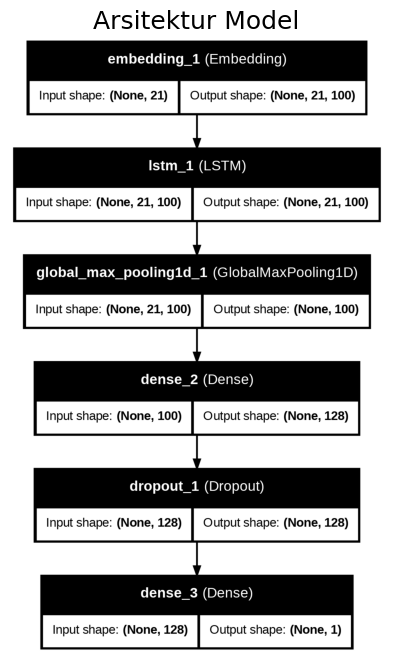

In [ ]:
from keras.utils import plot_model
file_name = 'arsitektur_model.png'
plot_model(model, to_file=file_name, show_shapes=True, show_layer_names=True)
plt.figure(figsize=(8,8))
img = plt.imread(file_name)
plt.imshow(img)
plt.title('Arsitektur Model', fontsize=18)
plt.axis('off')
plt.savefig(file_name)
plt.show()

###### [Çoklu output varsa kullanılacak](#b3)

In [ ]:
#3 sınıf için
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

109/109 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.80      1.00      0.89      2754
           1       0.00      0.00      0.00       709

    accuracy                           0.80      3463
   macro avg       0.40      0.50      0.44      3463
weighted avg       0.63      0.80      0.70      3463



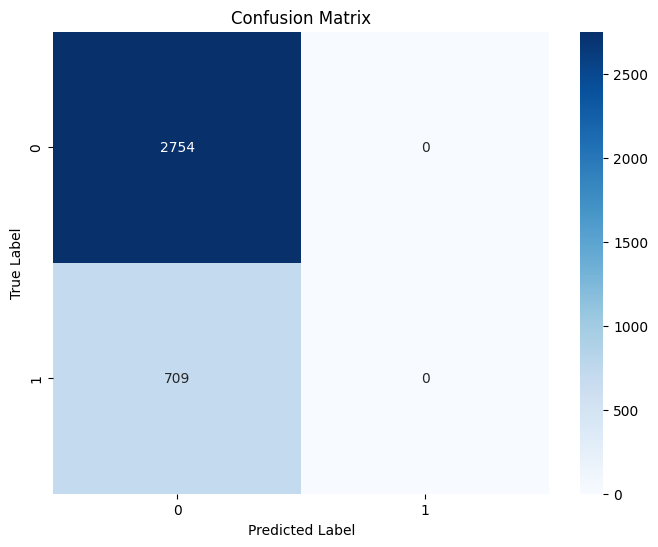

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
cm = confusion_matrix(y_val, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
model.save("model_Amazon_Product_Reviews.h5")
word2vec_model.save("word2vec_model.model")
train_df.to_csv("train_data.csv", index=False)

###### [history hata verdi bu model kullanılmadı](#b2)

In [ ]:
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input,Embedding,GlobalMaxPooling1D
model = Sequential()
model.add(Input(shape=(max_length,)))
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1],
                  trainable=False))
model.add(LSTM(ukuran_vektor, return_sequences=True))
model.add(GlobalMaxPooling1D())
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(jumlah_kelas, activation='softmax'))

In [ ]:
# 0 ve 1 output varsa
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout, Input, Embedding, GlobalMaxPooling1D

model = Sequential()
model.add(Input(shape=(max_length,)))  # Giriş katmanı
model.add(Embedding(input_dim=embedding_matrix.shape[0], output_dim=embedding_matrix.shape[1], trainable=False))  # Embedding katmanı
model.add(LSTM(ukuran_vektor, return_sequences=True))  # LSTM katmanı
model.add(GlobalMaxPooling1D())  # GlobalMaxPooling1D katmanı
model.add(Dense(128, activation='relu'))  # Dense katmanı
model.add(Dropout(0.2))  # Dropout katmanı
model.add(Dense(1, activation='sigmoid'))  # Çıkış katmanı: 1 nöron, sigmoid aktivasyon

# Modelin derlenmesi
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])


In [ ]:
y_train_int=[int(label) for label in y_train]
y_val_int=[int(label) for label in y_val]

In [ ]:
from keras.optimizers import Adam
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping
early_stopping = EarlyStopping(monitor='val_loss', patience=15, restore_best_weights=True)

In [ ]:
history = model.fit(X_train, y_train_int, epochs=500, batch_size=256,
                    validation_data=(X_val, y_val), callbacks=[early_stopping])

ValueError: Unrecognized data type: x=[[   2 2976  121 ...    0    0    0]
 [   0  133  153 ...    0    0    0]
 [   5   20  425 ...    0    0    0]
 ...
 [   2  232   75 ...    0    0    0]
 [   0   33    1 ...    0    0    0]
 [   3  179  158 ...    0    0    0]] (of type <class 'numpy.ndarray'>)

###### [Denemeler 0 ın öğrenmesi o geldiği için yapıldı](#b2)

In [ ]:
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

class_weights = compute_class_weight('balanced', classes=np.unique(y_train), y=y_train)
class_weights_dict = {i : class_weights[i] for i in range(len(class_weights))}

model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, class_weight=class_weights_dict)


Epoch 1/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 24s 97ms/step - accuracy: 0.8543 - loss: 0.3336 - val_accuracy: 0.7756 - val_loss: 0.4651
Epoch 2/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8863 - loss: 0.2743 - val_accuracy: 0.7680 - val_loss: 0.5310
Epoch 3/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9294 - loss: 0.2049 - val_accuracy: 0.7889 - val_loss: 0.4667
Epoch 4/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 60ms/step - accuracy: 0.9353 - loss: 0.1925 - val_accuracy: 0.7886 - val_loss: 0.5145
Epoch 5/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 56ms/step - accuracy: 0.9554 - loss: 0.1389 - val_accuracy: 0.7927 - val_loss: 0.5285
Epoch 6/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step - accuracy: 0.9706 - loss: 0.1073 - val_accuracy: 0.8050 - val_loss: 0.5483
Epoch 7/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 20s 53ms/step - accuracy: 0.9819 - loss: 0.0785 - val_accuracy: 0.7978 - val_loss: 0.5897
Epoch 8/50
214/214 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step - accuracy: 0.9856 - loss: 0.0622 - 

In [ ]:
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print(f'Test Accuracy: {accuracy*100:.2f}%')


Test Accuracy: 80.19%


In [ ]:
from sklearn.metrics import classification_report
y_pred = model.predict(X_val)
y_pred_classes = np.argmax(y_pred, axis=1)
report = classification_report(y_val, y_pred_classes)
print("Classification Report:")
print(report)

92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.49      1.00      0.65      1423
           1       0.00      0.00      0.00      1500

    accuracy                           0.49      2923
   macro avg       0.24      0.50      0.33      2923
weighted avg       0.24      0.49      0.32      2923



In [ ]:
import numpy as np

y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5'ten büyük kaç tane tahmin var:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 29ms/step
Tahmin ortalaması: 0.5227914
0.5'ten büyük kaç tane tahmin var: 1535


In [ ]:
print(np.unique(y_train))  # [0 1] olmalı
print(y_train[:10])        # Sayılar olmalı, liste değil


[0 1]
[0 1 0 1 1 1 1 1 1 0]


In [ ]:
print(embedding_matrix.shape)
# input_dim=embedding_matrix.shape[0] ile tokenizer.num_words eşleşiyor mu?


(10791, 100)


In [ ]:
print(X_train.shape, y_train.shape)


(6818, 53) (6818,)


In [ ]:
print("Etiket tipi:", y_train.dtype)
print("Eşsiz etiketler:", np.unique(y_train))


Etiket tipi: int64
Eşsiz etiketler: [0 1]


In [ ]:
y_pred_probs = model.predict(X_val)
print("Tahmin ortalaması:", np.mean(y_pred_probs))
print("0.5 üstü kaç tane:", np.sum(y_pred_probs > 0.5))


92/92 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step
Tahmin ortalaması: 0.5227914
0.5 üstü kaç tane: 1535


# [Son](#b1)
